In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from itertools import count
from random import shuffle
import time
from copy import deepcopy

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/covid19-global-forecasting-week-4/submission.csv
/kaggle/input/covid19-global-forecasting-week-4/test.csv
/kaggle/input/covid19-global-forecasting-week-4/train.csv


In [2]:
def dateToInt(date):
    days = [0, 31, 29, 31, 30, 31, 30, 31, 31, 30, 31]
    month, day = tuple(int(i) for i in date.split('-')[1:])
    return sum(days[:month]) + day - 22
dateToInt("2020-01-22")
dateToInt("2020-04-04")

73

In [3]:
def findDuplicates(l):
    duplicates = list()
    idxs = list()
    seen = dict()
    for i, element in enumerate(l):
        if element in seen:
            idx = seen[element]
            duplicates.append(i)
            idxs.append(idx)
        seen.update({element: i})
    return duplicates, idxs
findDuplicates([1, 2, 3, 4, 1, 2, 3, 4])

([4, 5, 6, 7], [0, 1, 2, 3])

In [4]:
# Installs adabound
import sys
from subprocess import call
call([sys.executable, '-m', 'pip', 'install', 'adabound'])

0

In [5]:
testname = "/kaggle/input/covid19-global-forecasting-week-4/test.csv"
ptest = pd.read_csv(testname)
testnames = [p[1] if type(p[1]) is str else p[2] for p in ptest.to_numpy()]
ptest

,ForecastId,Province_State,Country_Region,Date
0,1,NaN,Afghanistan,2020-04-02
1,2,NaN,Afghanistan,2020-04-03
2,3,NaN,Afghanistan,2020-04-04
3,4,NaN,Afghanistan,2020-04-05
4,5,NaN,Afghanistan,2020-04-06
...,...,...,...,...
13454,13455,NaN,Zimbabwe,2020-05-10
13455,13456,NaN,Zimbabwe,2020-05-11
13456,13457,NaN,Zimbabwe,2020-05-12
13457,13458,NaN,Zimbabwe,2020-05-13


In [6]:
trainname = "/kaggle/input/covid19-global-forecasting-week-4/train.csv"
ptrain = pd.read_csv(trainname)
nptrain = ptrain.to_numpy()
names = set()
provinces = set()
pdatas = dict()
for data in nptrain:
    name = data[2]
    names.add(name)
for name in names:
    pdatas.update({name: ptrain[ptrain["Country_Region"] == name].to_numpy()})
for name, data in list(pdatas.items()):
    for d in data:
        state = d[1]
        if type(state) is float or state in provinces:
            continue
        try:
            if name not in ("Canada",) and name not in testnames:
                del pdatas[name]
                names.remove(name)
        except:
            pass
        names.add(state)
        provinces.add(state)
        pdatas.update({state: ptrain[ptrain["Province_State"] == state].to_numpy()})
counter = 0
stuff = [0 for i in range(72)]
for i in pdatas["Illinois"]:
    stuff[counter % 72] += i[-2]
    counter += 1
# pdatas["California"]


In [7]:
oldxbycountry = dict()
oldybycountry = dict()
xbycountry = dict()
ybycountry = dict()
shufflexbycountry = dict()
shuffleybycountry = dict()

for name in names:
    data = pdatas[name]
    countryx = [dateToInt(p[3]) for p in data]
    countryy = [p[4:] for p in data]
    oldxbycountry.update({name: countryx})
    oldybycountry.update({name: countryy})
l = len(oldxbycountry["Italy"])
for name in names:
    scheme = list(range(l))
    shuffle(scheme)
    newx = list(0 for i in range(l))
    newy = list([0, 0] for i in range(l))
    shufflex = list(0 for i in range(l))
    shuffley = list([0,0] for i in range(l))
    for i, x, y in zip(count(), oldxbycountry[name], oldybycountry[name]):
        newx[i%l] = x
        newy[i%l][0] += y[0]
        newy[i%l][1] += y[1]
        shufflex[scheme[i%l]] = x
        shuffley[scheme[i%l]][0] += y[0]
        shuffley[scheme[i%l]][1] += y[1]
    xbycountry.update({name: np.array(newx)})
    ybycountry.update({name: np.array(newy)})
    shufflexbycountry.update({name: np.array(shufflex)})
    shuffleybycountry.update({name: np.array(shuffley)})
len(ybycountry["California"])
xbycountry["California"]

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83])

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import adabound

In [9]:
def train(model, criterion, optimizer, x, y, limit):
    beg = time.time()
    try:
        for epoch in count():
            model.train()
            optimizer.zero_grad()
            y_pred = model(x)
            loss = criterion(y_pred, y)
            if epoch % 5000 == 0:
                print("Epoch:", epoch + 0*120000, "\tLoss:", loss.item())
            loss.backward()
            optimizer.step()
            seconds = time.time() - beg
            if seconds > limit:
                break
    except KeyboardInterrupt:
        pass
    return model, criterion, optimizer


In [10]:
class Model(nn.Module):
    def __init__(self, deg=1):
        super(Model, self).__init__()
        self.fc1 = nn.Linear(deg, 2)
        self.sigmoid = nn.Sigmoid()
        self.fc2 = nn.Linear(2, 2)
    def forward(self, x):
        return self.fc2(self.sigmoid(self.fc1(x/70)))

loosex = torch.FloatTensor([[pow(i, p) for p in (2,1)] for i in shufflexbycountry["Canada"]])
loosey = torch.FloatTensor([[float(i[0]/1e4), float(i[1]/2e2)] for i in shuffleybycountry["Canada"]])

m = Model(2)
loosemodel = train(
    m,
    nn.MSELoss(),
    adabound.AdaBound(m.parameters(), lr=1e-3, final_lr=.1),
    loosex,
    loosey,
    10
)[0]


Epoch: 0 	Loss: 1.2595173120498657
Epoch: 5000 	Loss: 0.7077845335006714
Epoch: 10000 	Loss: 0.704882025718689


In [11]:
models = dict()
cnames = names
# cnames = ("Anguilla",)

for cname in cnames:
    if cname == "Canada":
        continue
    cases = max(i[0] for i in ybycountry[cname])
    small = cases < 30000
    rllysmall = cases < 5000
    xsmall = cases < 100
    print(small, rllysmall, xsmall)
    
    casenorm = 100 if xsmall else cases + .0001
    fatnorm = max(i[1] for i in ybycountry[cname]) + .001

    powers = (2,1) if small else (1,)

    beg = time.time()
    
#     train_limit = 100 if xsmall else 45 if rllysmall else 60 if small else 100
    train_limit = 100 if rllysmall else 30 if small else 60
#     train_limit = 3

    model = deepcopy(loosemodel) if rllysmall else Model(2 if small else 1)
    criterion = nn.MSELoss()
    sgd = lambda model: torch.optim.SGD(model.parameters(), lr=.1)
#     ada = lambda model: adabound.AdaBound(model.parameters(), lr=1e-2, final_lr=.1)
    adam = lambda model: torch.optim.Adam(model.parameters())

    x = torch.FloatTensor([[pow(i, p) for p in powers] for i in shufflexbycountry[cname]])
    y = torch.FloatTensor([[float(i[0]/casenorm), float(i[1]/fatnorm)] for i in shuffleybycountry[cname]])

    # Around 120000 epochs
    newmodel = train(
        model,
        criterion,
        adam(model),
        x,
        y,
        train_limit
    )[0]
    
    models.update({cname: (newmodel, powers, casenorm, fatnorm)})

    seconds = time.time() - beg
    print(cname, "trained in", seconds // 60, "minutes", seconds % 60, "seconds")


True True True
Epoch: 0 	Loss: 0.17110776901245117
Epoch: 5000 	Loss: 0.019504902884364128
Epoch: 10000 	Loss: 0.007639997638761997
Epoch: 15000 	Loss: 0.004717558156698942
Epoch: 20000 	Loss: 0.0030583280604332685
Epoch: 25000 	Loss: 0.0023330282419919968
Epoch: 30000 	Loss: 0.001931993756443262
Epoch: 35000 	Loss: 0.00167441600933671
Epoch: 40000 	Loss: 0.0014904143754392862
Epoch: 45000 	Loss: 0.0013496789615601301
Epoch: 50000 	Loss: 0.0012370845070108771
Epoch: 55000 	Loss: 0.0011436736676841974
Epoch: 60000 	Loss: 0.001064124284312129
Epoch: 65000 	Loss: 0.0009975444991141558
Epoch: 70000 	Loss: 0.0009345891885459423
Epoch: 75000 	Loss: 0.0008803798700682819
Epoch: 80000 	Loss: 0.0008313561556860805
Epoch: 85000 	Loss: 0.0007868048269301653
Epoch: 90000 	Loss: 0.0007460697670467198
Epoch: 95000 	Loss: 0.0007084915414452553
Epoch: 100000 	Loss: 0.0006736465729773045
Epoch: 105000 	Loss: 0.0006413442315533757
Epoch: 110000 	Loss: 0.0006112586124800146
Gambia trained in 1.0 minutes 

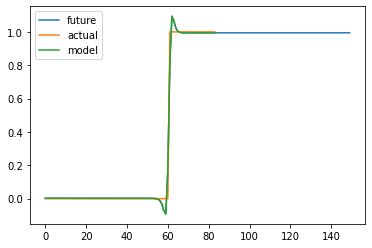

Gambia average accuracy: 98.9%


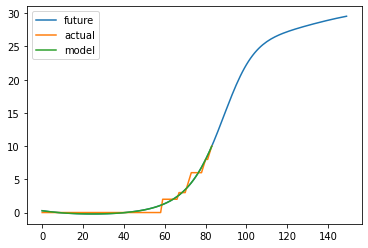

Singapore average accuracy: 97.0%


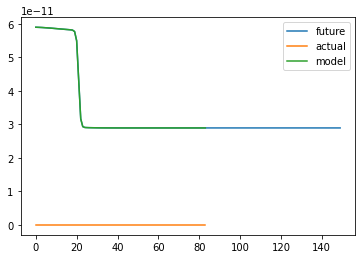

Ningxia average accuracy: 1e+02%


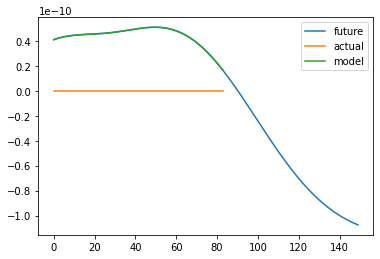

Northwest Territories average accuracy: 1e+02%


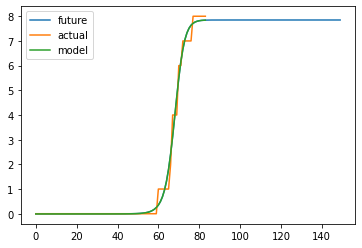

Guadeloupe average accuracy: 98.5%


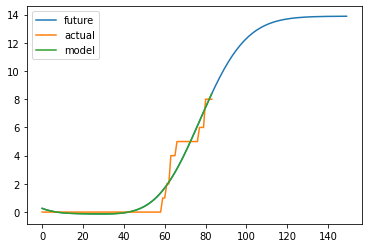

Ghana average accuracy: 95.2%


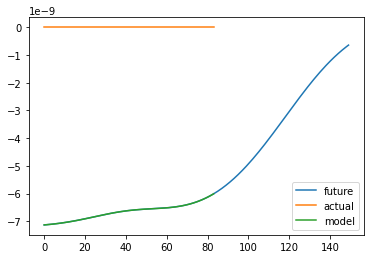

Falkland Islands (Malvinas) average accuracy: 1e+02%


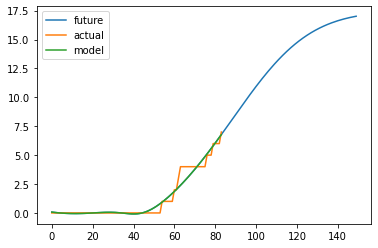

Bahrain average accuracy: 96.6%


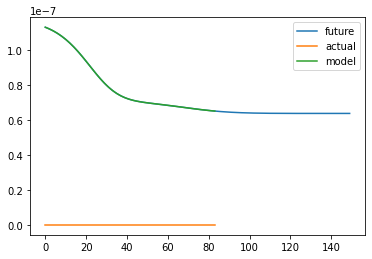

Eswatini average accuracy: 1e+02%


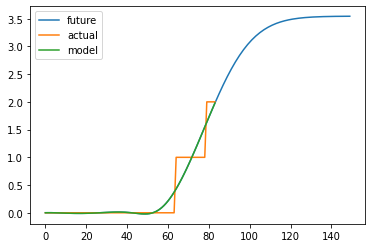

West Bank and Gaza average accuracy: 95.5%


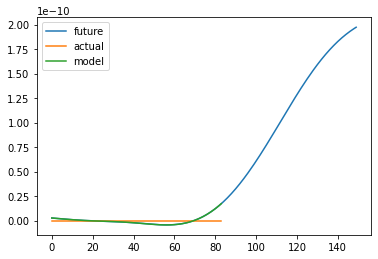

Sierra Leone average accuracy: 1e+02%


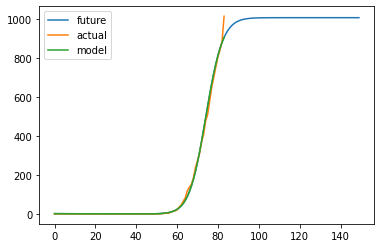

Louisiana average accuracy: 99.4%


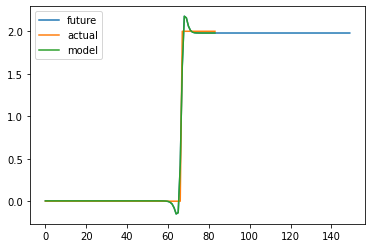

Angola average accuracy: 98.8%


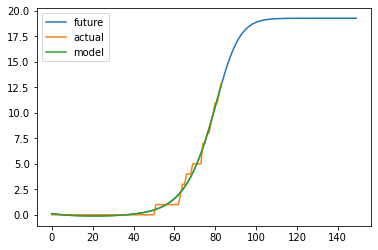

Azerbaijan average accuracy: 98.3%


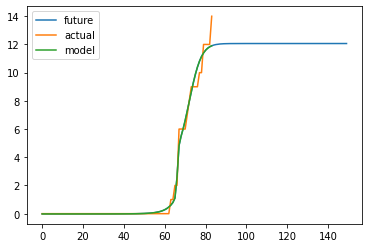

Cameroon average accuracy: 98.7%


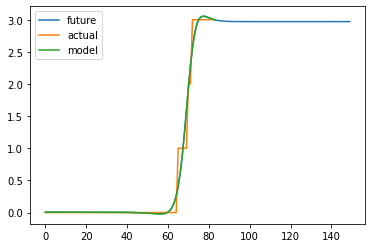

Togo average accuracy: 98.4%


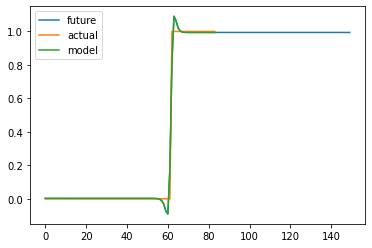

Cabo Verde average accuracy: 98.8%


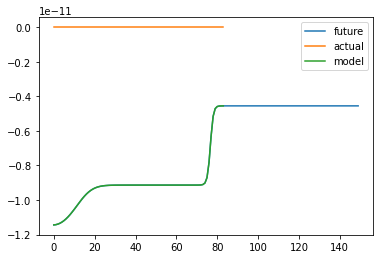

Shanxi average accuracy: 1e+02%


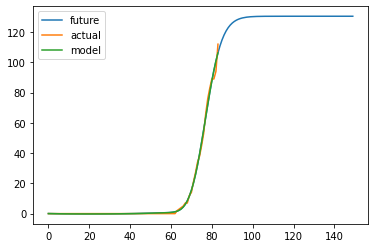

North Carolina average accuracy: 99.4%


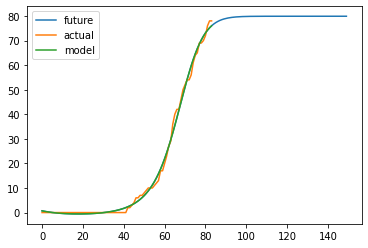

Iraq average accuracy: 98.7%


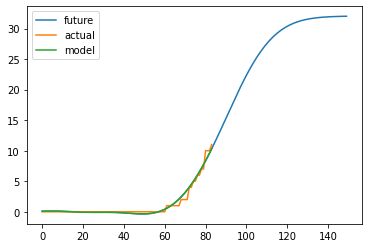

Nigeria average accuracy: 97.6%


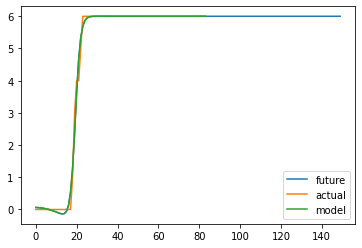

Anhui average accuracy: 99.1%


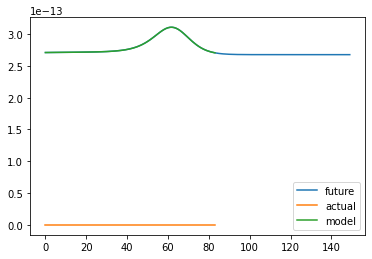

Gibraltar average accuracy: 1e+02%


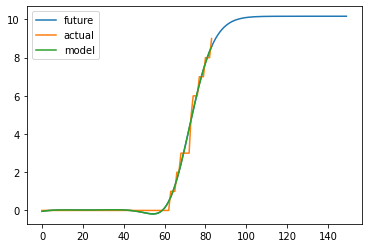

Alaska average accuracy: 98.6%


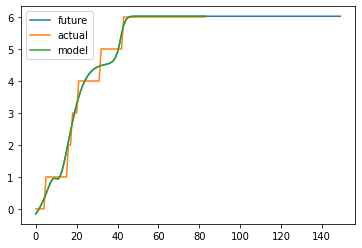

Hainan average accuracy: 97.3%


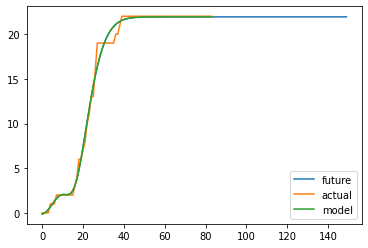

Henan average accuracy: 98.5%


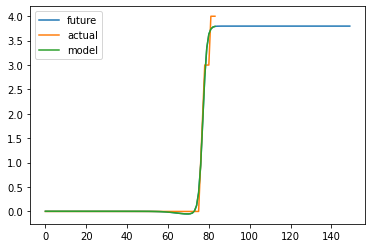

South Australia average accuracy: 99.0%


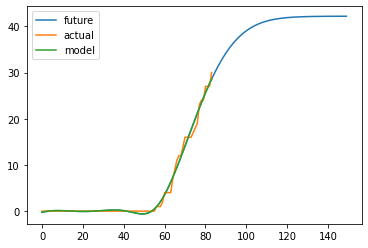

Burkina Faso average accuracy: 98.5%


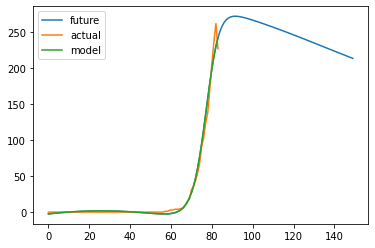

Maryland average accuracy: 98.8%


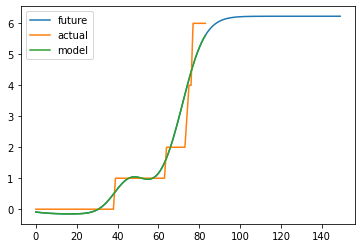

Western Australia average accuracy: 95.4%


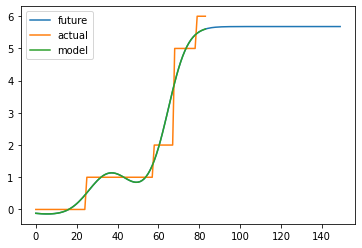

Taiwan* average accuracy: 95.6%


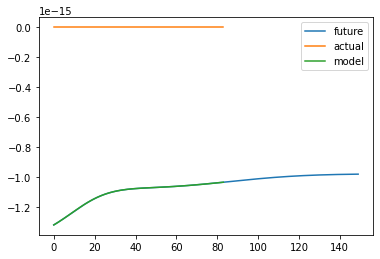

Equatorial Guinea average accuracy: 1e+02%


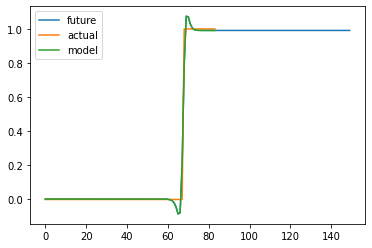

Mauritania average accuracy: 98.7%


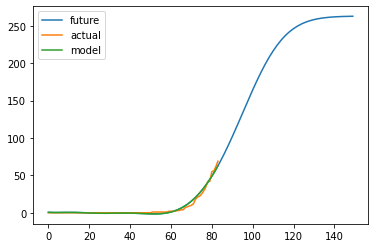

Kansas average accuracy: 97.9%


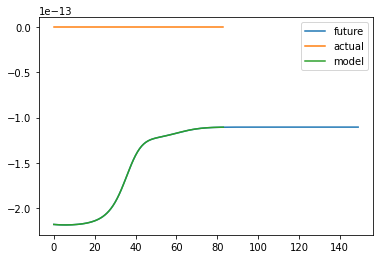

Greenland average accuracy: 1e+02%


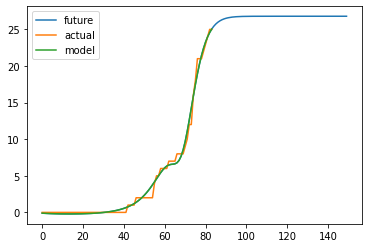

New South Wales average accuracy: 98.5%


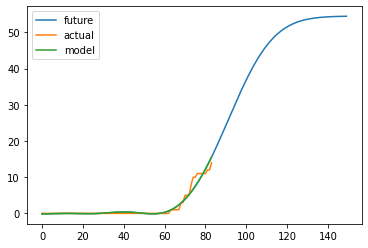

Niger average accuracy: 97.1%


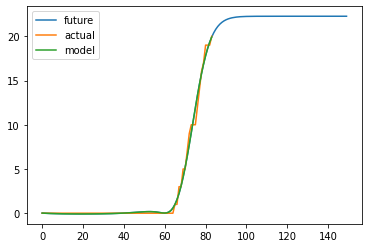

Maine average accuracy: 99.0%


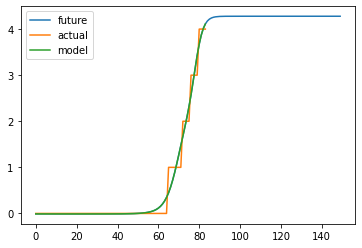

Manitoba average accuracy: 98.0%


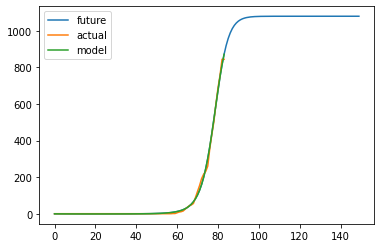

Massachusetts average accuracy: 99.4%


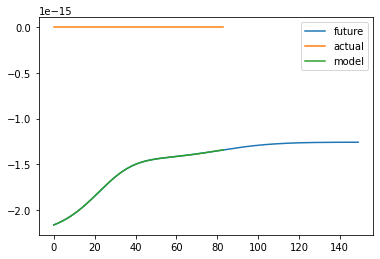

Saint Kitts and Nevis average accuracy: 1e+02%


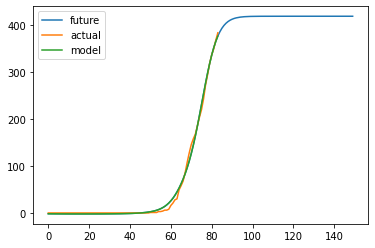

Austria average accuracy: 99.0%


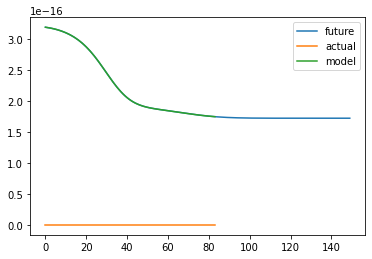

Saint Lucia average accuracy: 1e+02%


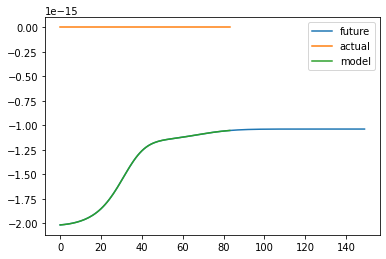

Grenada average accuracy: 1e+02%


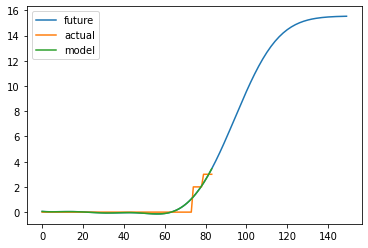

Ethiopia average accuracy: 95.2%


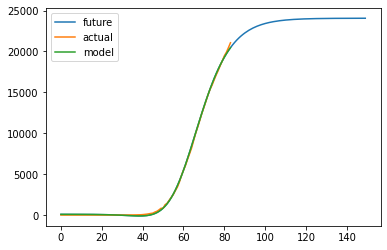

Italy average accuracy: 99.5%


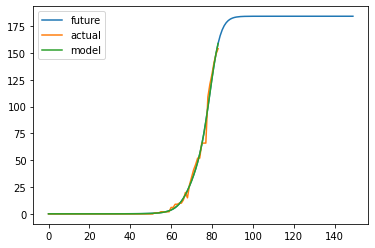

Virginia average accuracy: 99.1%


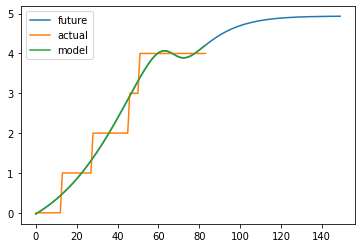

Hong Kong average accuracy: 94.6%


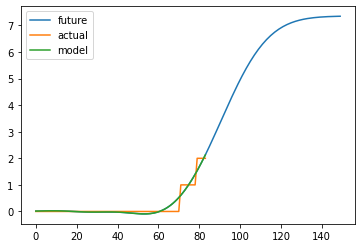

Zambia average accuracy: 95.7%


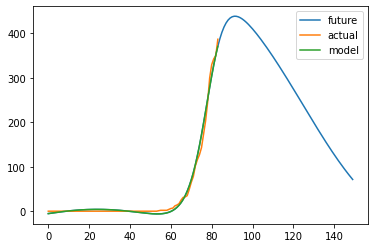

Indiana average accuracy: 98.6%


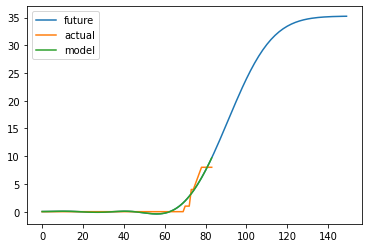

Bahamas average accuracy: 96.0%


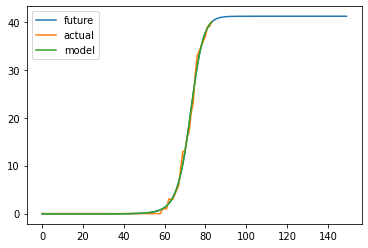

Bosnia and Herzegovina average accuracy: 99.2%


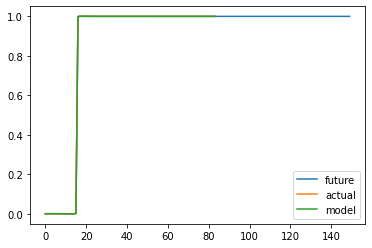

Jilin average accuracy: 1e+02%


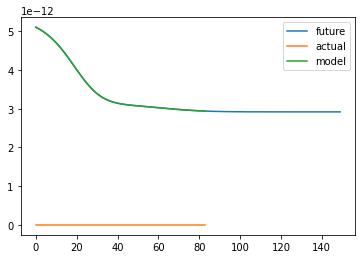

Mongolia average accuracy: 1e+02%


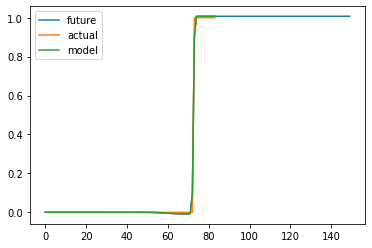

Liechtenstein average accuracy: 99.5%


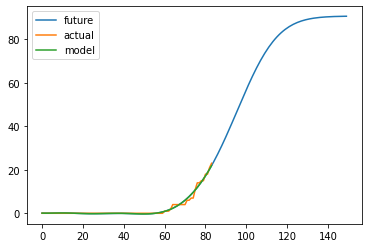

Afghanistan average accuracy: 98.4%


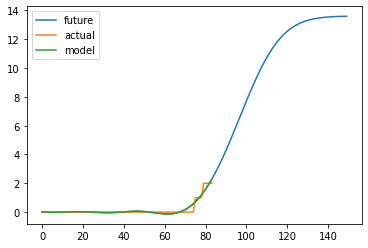

Belize average accuracy: 96.1%


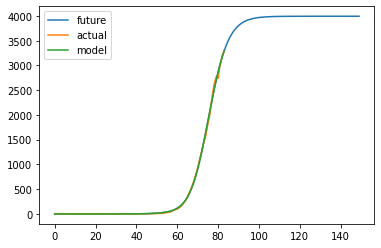

Germany average accuracy: 99.6%


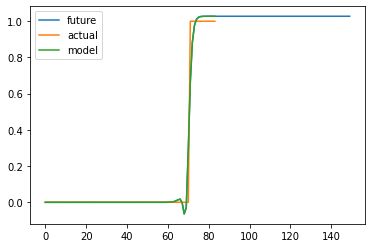

Libya average accuracy: 98.6%


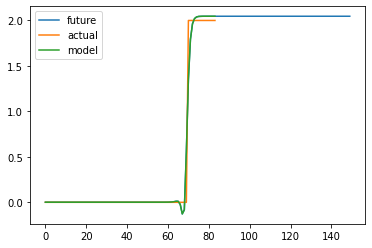

MS Zaandam average accuracy: 98.7%


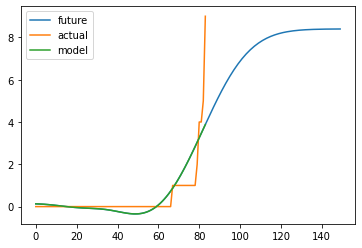

New Zealand average accuracy: 96.0%


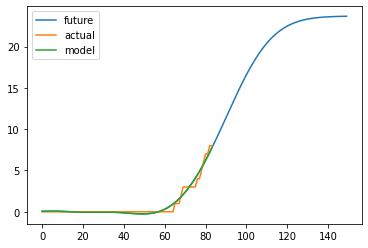

North Dakota average accuracy: 97.3%


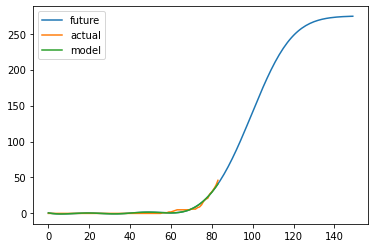

Bangladesh average accuracy: 97.7%


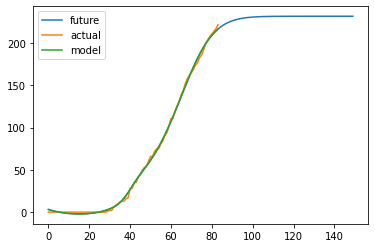

Korea, South average accuracy: 99.2%


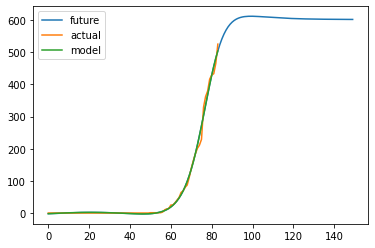

Georgia average accuracy: 99.2%


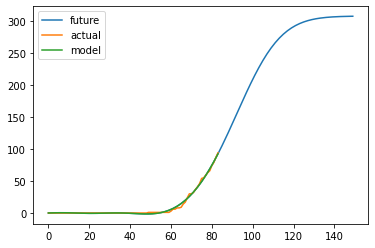

Panama average accuracy: 98.9%


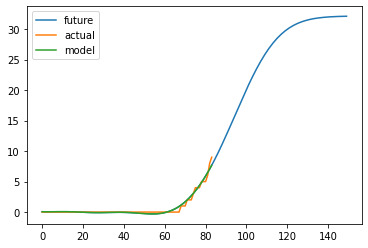

West Virginia average accuracy: 97.8%


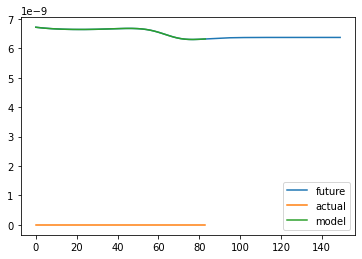

Vietnam average accuracy: 1e+02%


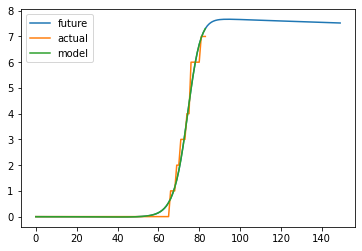

Qatar average accuracy: 98.5%


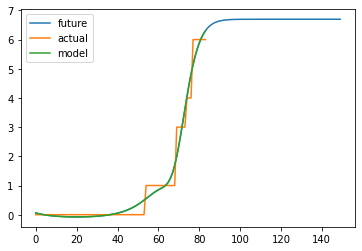

Martinique average accuracy: 96.9%


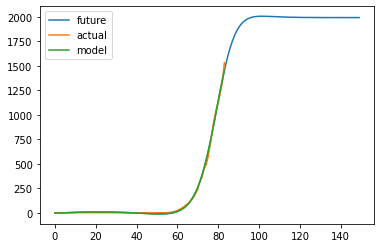

Brazil average accuracy: 99.3%


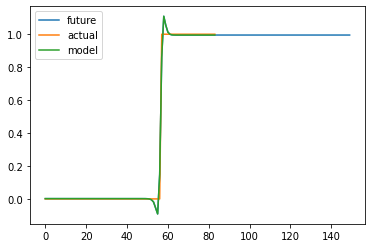

Curacao average accuracy: 99.0%


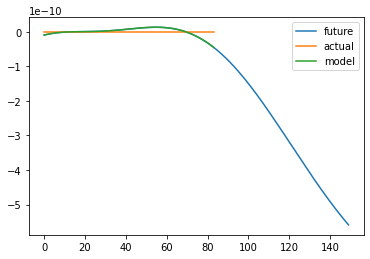

Saint Pierre and Miquelon average accuracy: 1e+02%


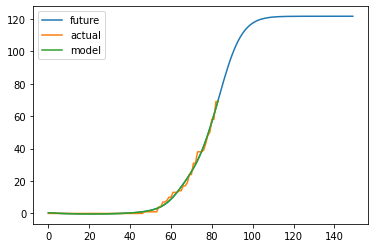

British Columbia average accuracy: 98.7%


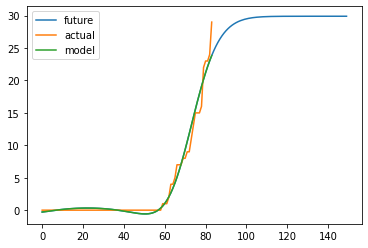

Lithuania average accuracy: 98.0%


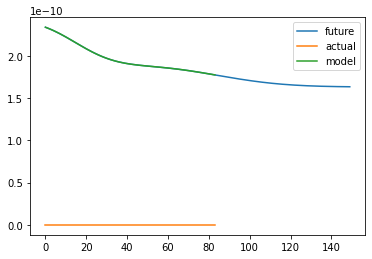

Montserrat average accuracy: 1e+02%


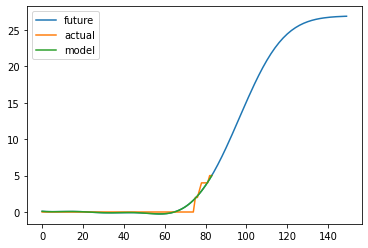

Bermuda average accuracy: 96.0%


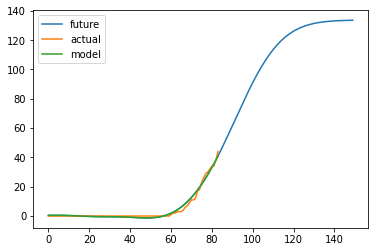

North Macedonia average accuracy: 97.8%


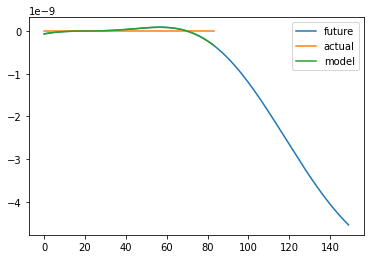

Sao Tome and Principe average accuracy: 1e+02%


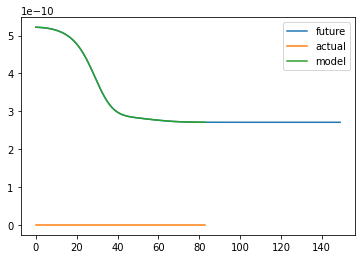

Seychelles average accuracy: 1e+02%


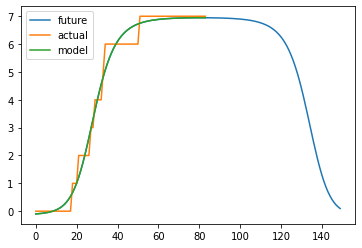

Shandong average accuracy: 96.9%


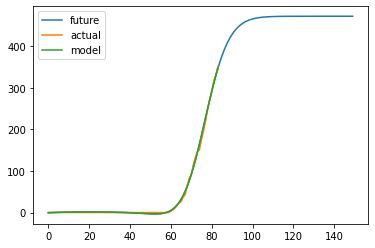

Romania average accuracy: 99.4%


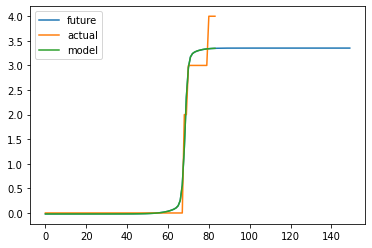

Saskatchewan average accuracy: 97.4%


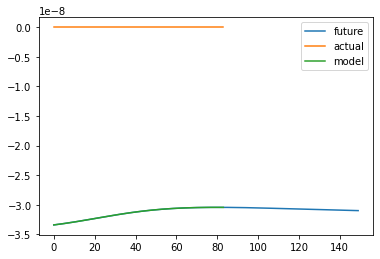

Western Sahara average accuracy: 1e+02%


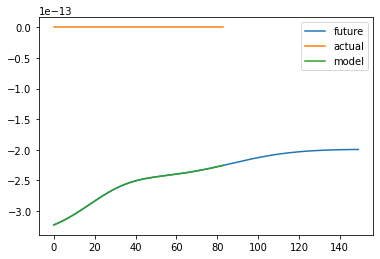

Fiji average accuracy: 1e+02%


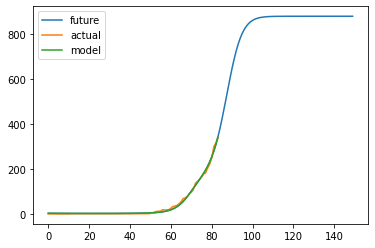

Philippines average accuracy: 99.0%


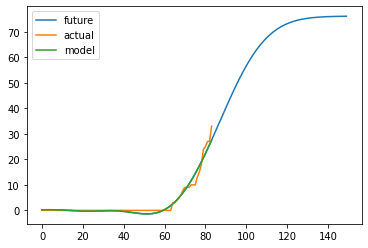

Idaho average accuracy: 97.6%


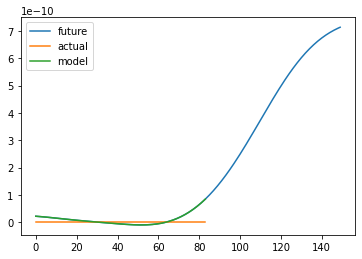

Chad average accuracy: 1e+02%


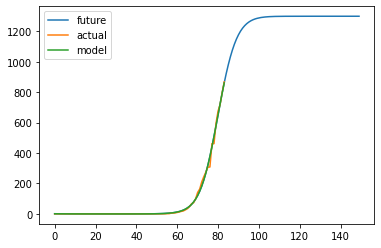

Illinois average accuracy: 99.5%


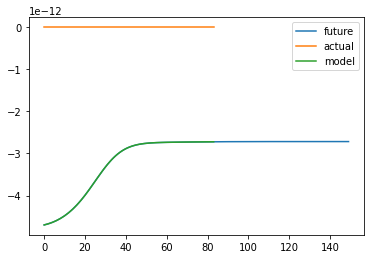

British Virgin Islands average accuracy: 1e+02%


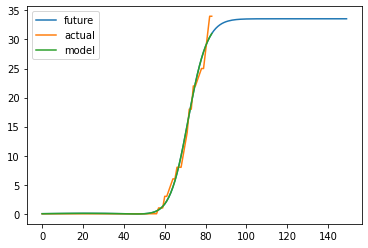

Tunisia average accuracy: 98.7%


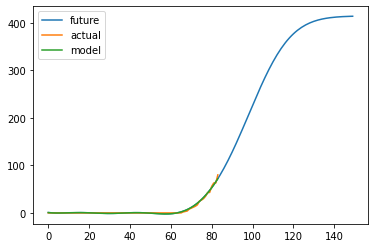

Rhode Island average accuracy: 98.6%


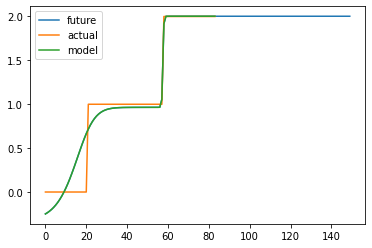

Liaoning average accuracy: 95.3%


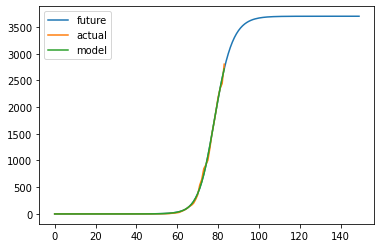

New Jersey average accuracy: 99.6%


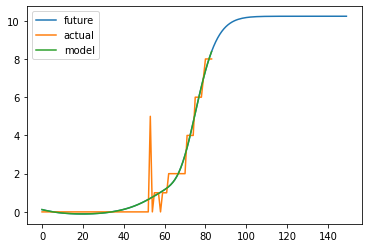

Iceland average accuracy: 96.5%


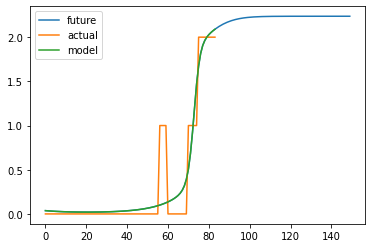

Slovakia average accuracy: 94.0%


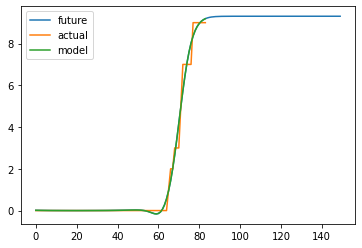

Venezuela average accuracy: 98.7%


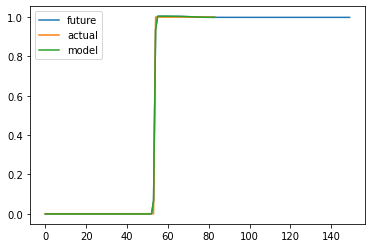

Cayman Islands average accuracy: 99.7%


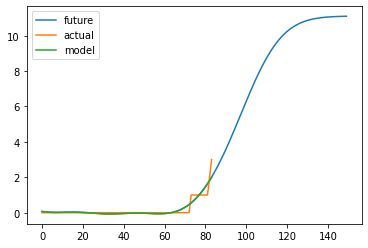

Kuwait average accuracy: 96.8%


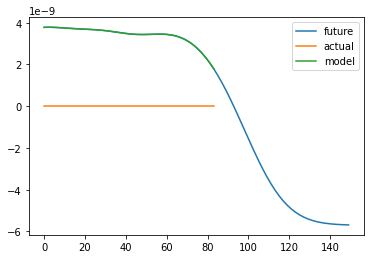

Guinea average accuracy: 1e+02%


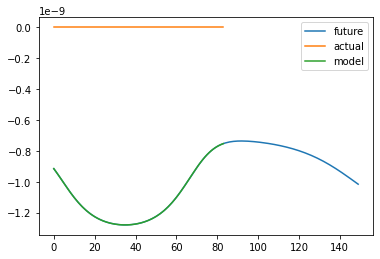

Saint Barthelemy average accuracy: 1e+02%


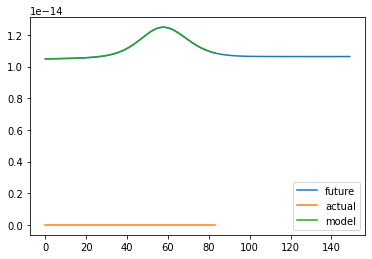

Rwanda average accuracy: 1e+02%


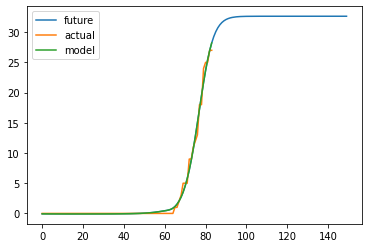

South Africa average accuracy: 98.9%


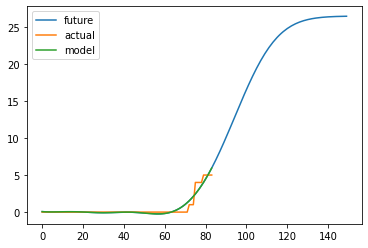

Kyrgyzstan average accuracy: 95.5%


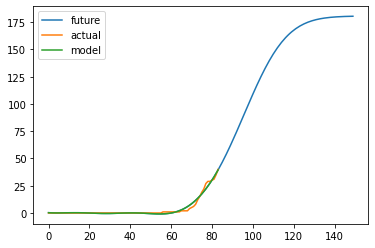

Moldova average accuracy: 98.0%


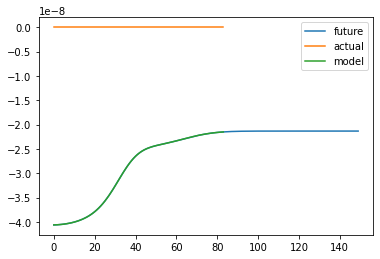

Namibia average accuracy: 1e+02%


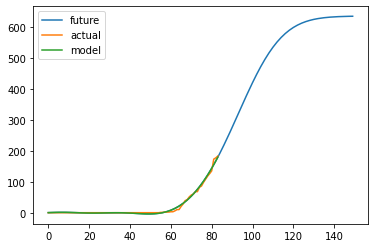

Dominican Republic average accuracy: 98.6%


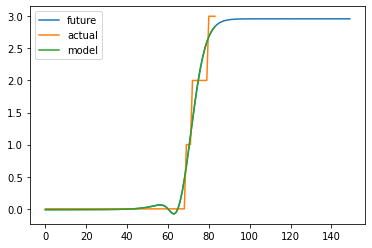

Mayotte average accuracy: 97.4%


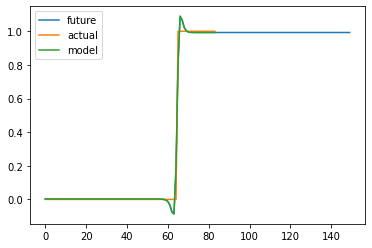

Nicaragua average accuracy: 98.8%


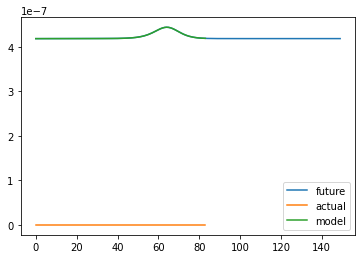

New Brunswick average accuracy: 1e+02%


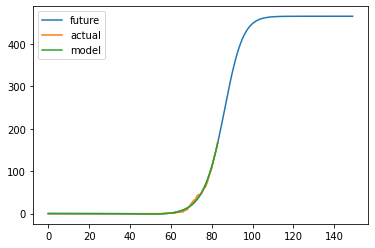

Russia average accuracy: 99.4%


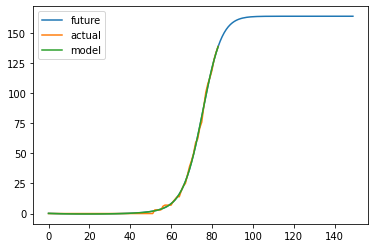

Norway average accuracy: 99.5%


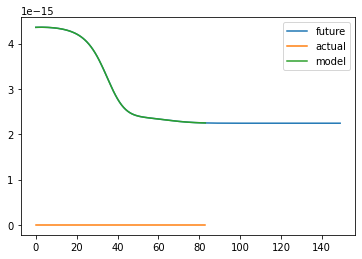

Dominica average accuracy: 1e+02%


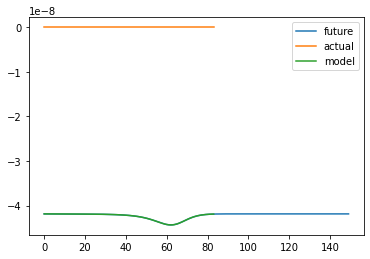

Reunion average accuracy: 1e+02%


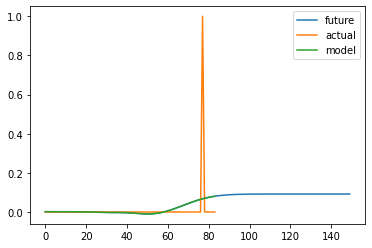

Prince Edward Island average accuracy: 97.4%


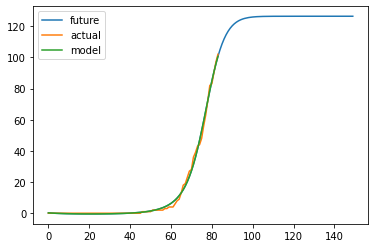

Argentina average accuracy: 99.1%


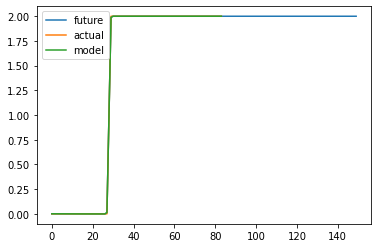

Yunnan average accuracy: 1e+02%


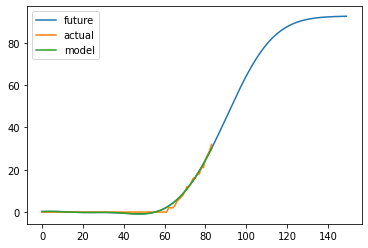

Arkansas average accuracy: 98.3%


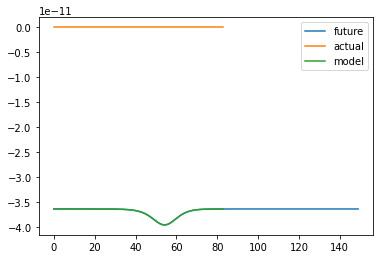

Cambodia average accuracy: 1e+02%


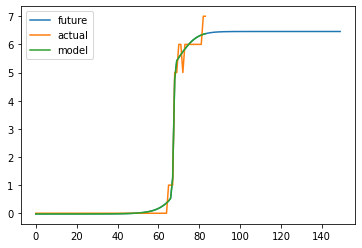

Montana average accuracy: 98.4%


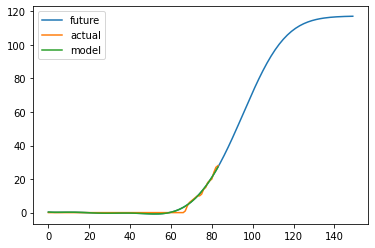

Bolivia average accuracy: 98.1%


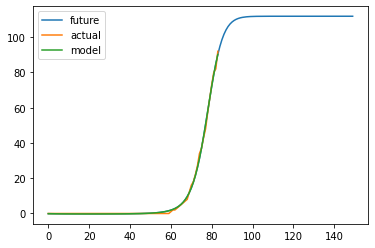

Chile average accuracy: 99.5%


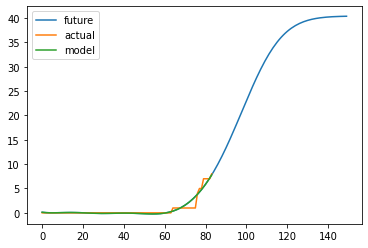

Kosovo average accuracy: 96.9%


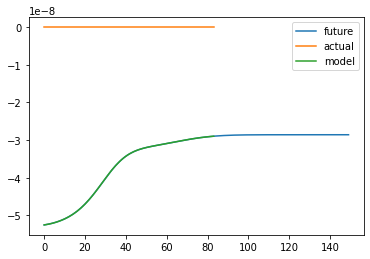

Holy See average accuracy: 1e+02%


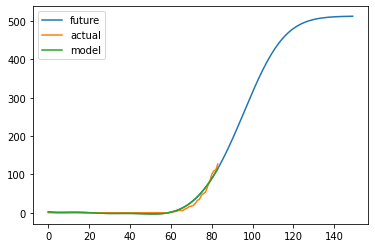

Colombia average accuracy: 97.5%


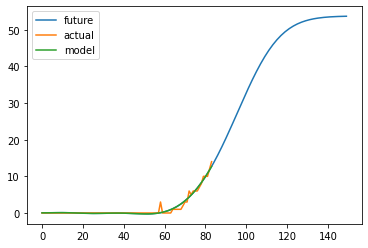

Kazakhstan average accuracy: 97.9%


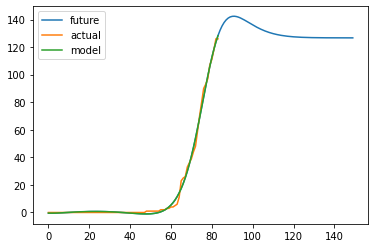

Morocco average accuracy: 99.0%


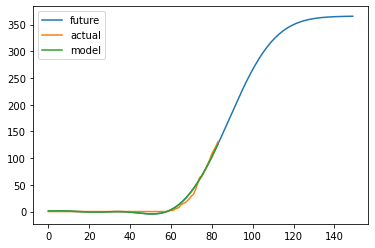

Arizona average accuracy: 98.3%


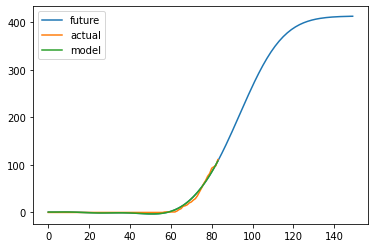

Mississippi average accuracy: 98.2%


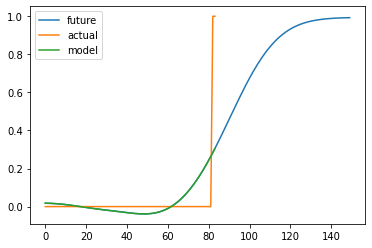

Wyoming average accuracy: 94.2%


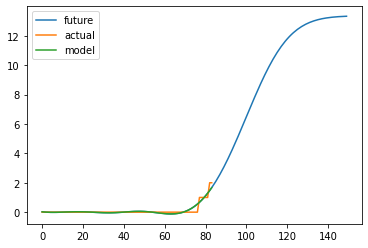

Somalia average accuracy: 96.4%


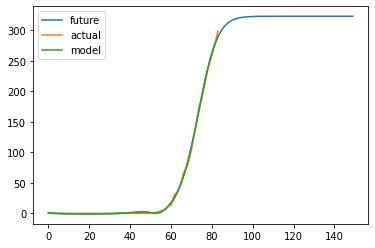

Denmark average accuracy: 99.5%


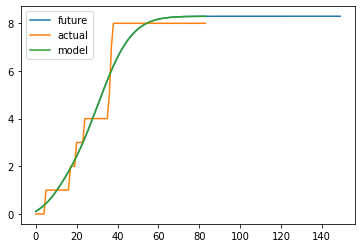

Beijing average accuracy: 94.6%


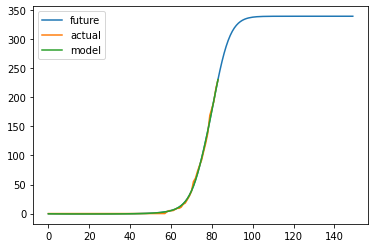

Peru average accuracy: 99.5%


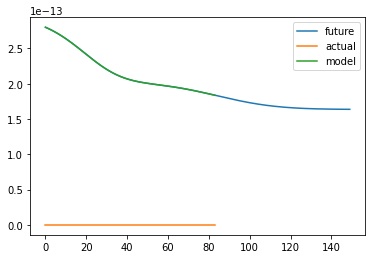

Laos average accuracy: 1e+02%


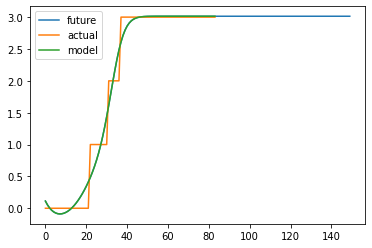

Xinjiang average accuracy: 96.7%


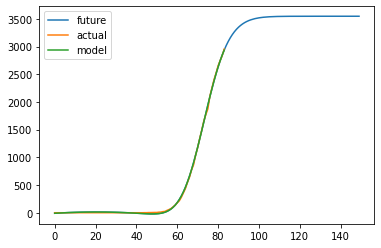

Netherlands average accuracy: 99.6%


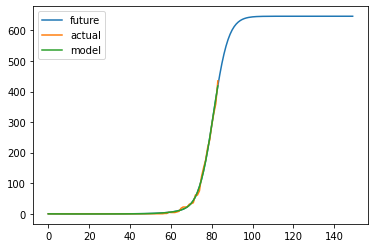

Quebec average accuracy: 99.5%


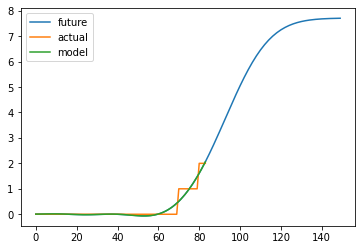

Isle of Man average accuracy: 96.1%


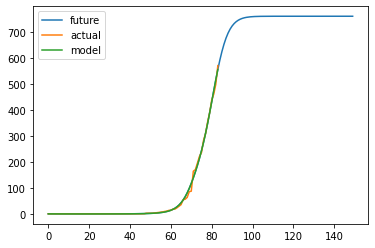

Florida average accuracy: 99.5%


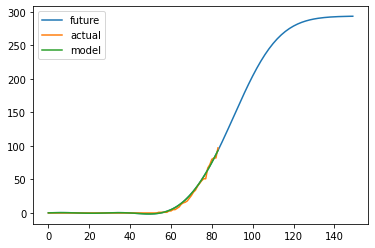

South Carolina average accuracy: 98.8%


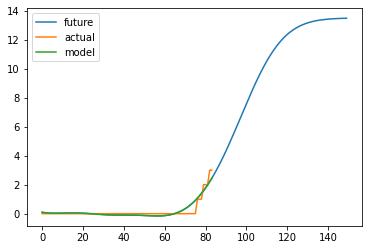

Nova Scotia average accuracy: 95.3%


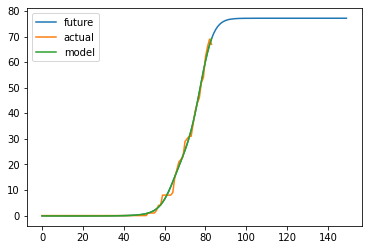

Luxembourg average accuracy: 99.1%


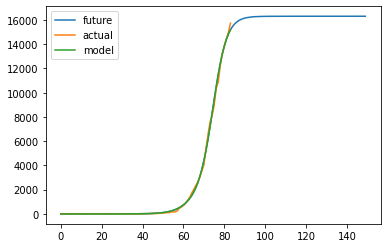

France average accuracy: 99.5%


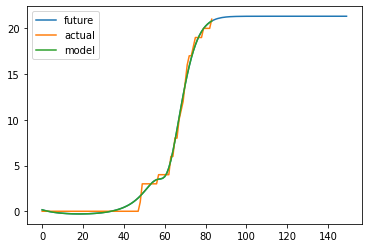

Lebanon average accuracy: 98.2%


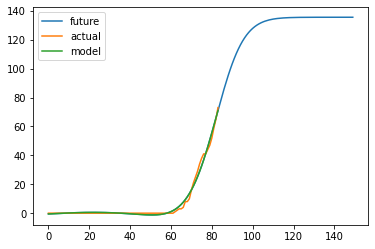

Saudi Arabia average accuracy: 98.5%


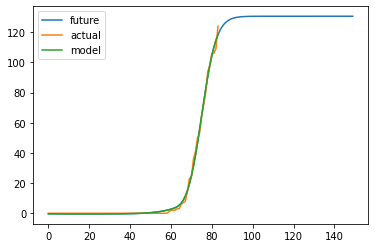

Tennessee average accuracy: 99.2%


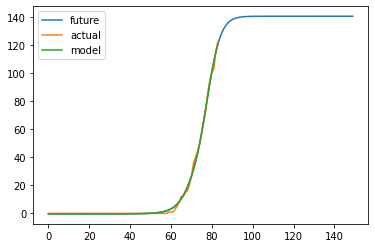

Israel average accuracy: 99.3%


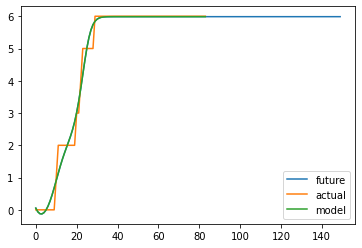

Chongqing average accuracy: 97.9%


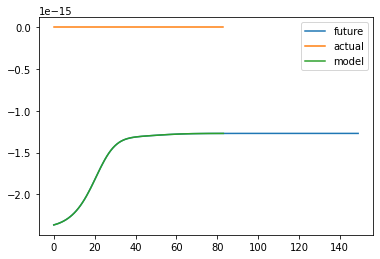

Maldives average accuracy: 1e+02%


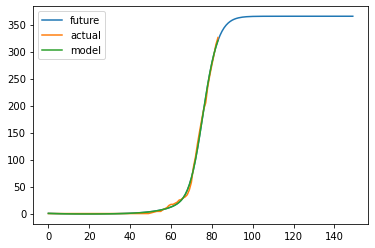

Algeria average accuracy: 99.4%


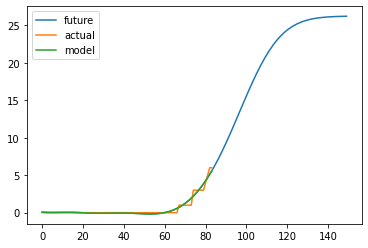

Cote d'Ivoire average accuracy: 97.3%


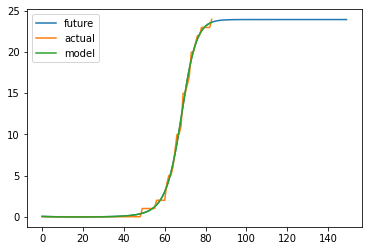

Albania average accuracy: 99.1%


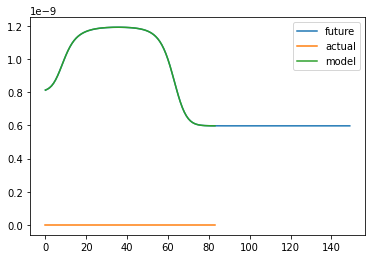

Macau average accuracy: 1e+02%


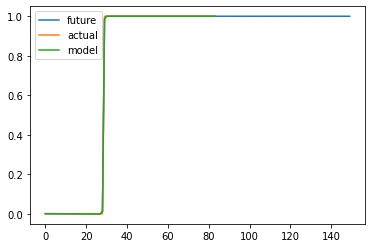

Zhejiang average accuracy: 99.9%


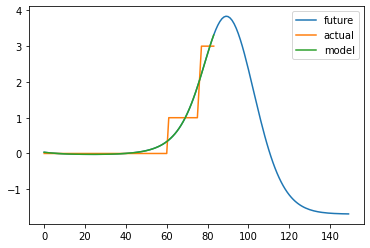

Zimbabwe average accuracy: 95.5%


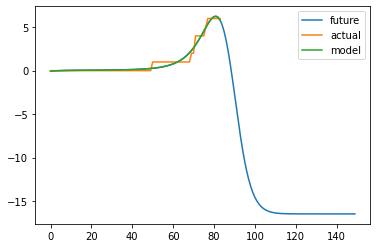

Guyana average accuracy: 96.3%


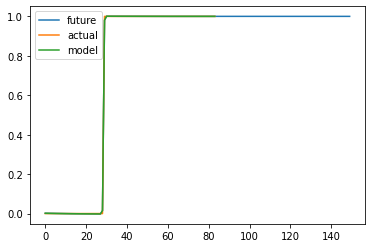

Fujian average accuracy: 99.9%


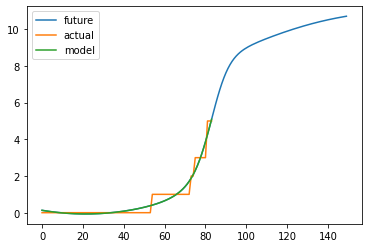

Guatemala average accuracy: 96.3%


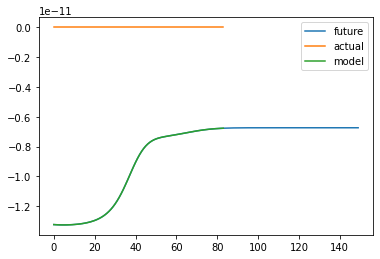

Uganda average accuracy: 1e+02%


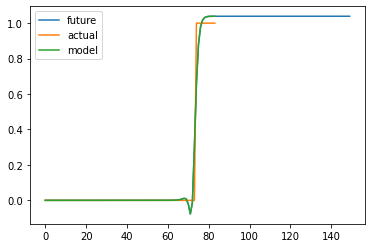

Turks and Caicos Islands average accuracy: 98.6%


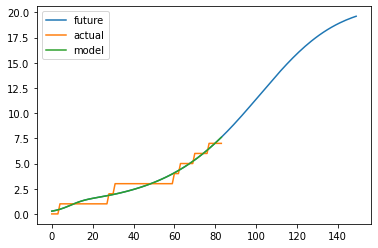

Shanghai average accuracy: 94.2%


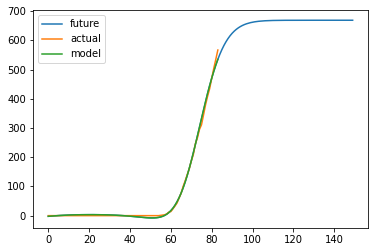

Portugal average accuracy: 99.2%


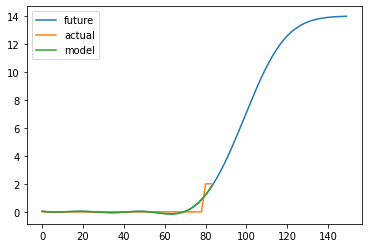

Djibouti average accuracy: 95.0%


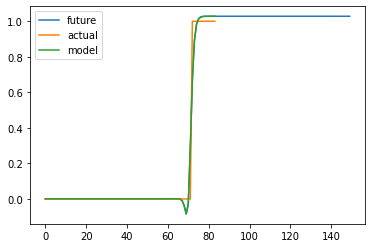

Suriname average accuracy: 98.6%


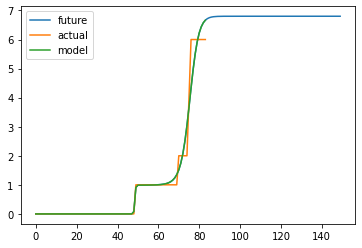

South Dakota average accuracy: 98.2%


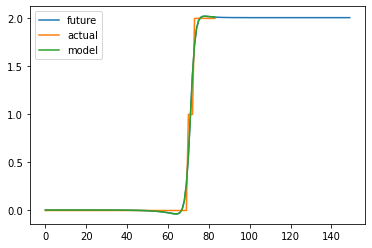

Senegal average accuracy: 98.7%


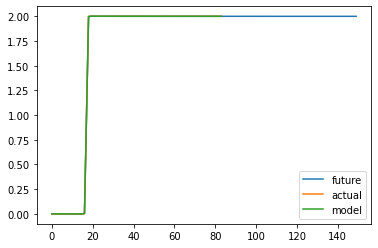

Gansu average accuracy: 1e+02%


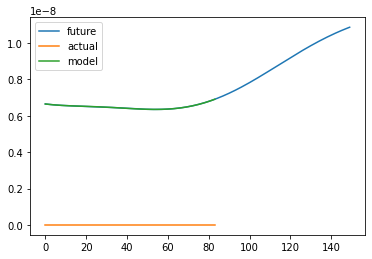

Bonaire, Sint Eustatius and Saba average accuracy: 1e+02%


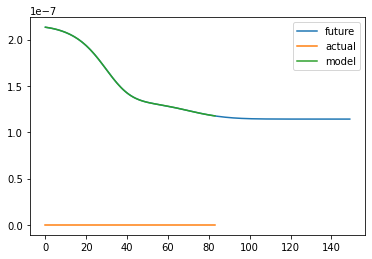

Aruba average accuracy: 1e+02%


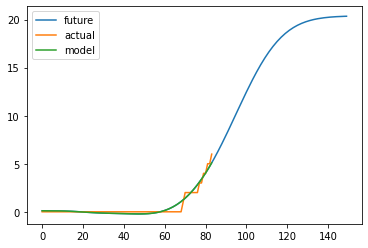

Tasmania average accuracy: 96.5%


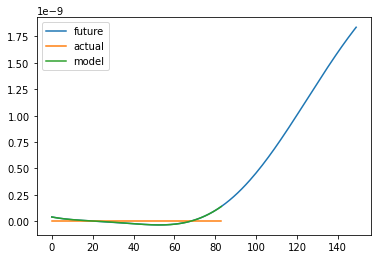

Timor-Leste average accuracy: 1e+02%


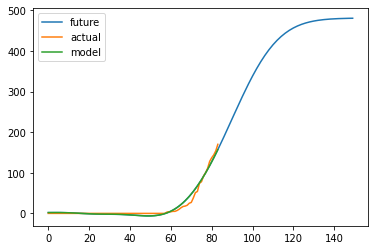

Wisconsin average accuracy: 97.5%


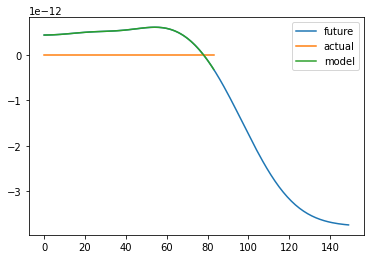

Guinea-Bissau average accuracy: 1e+02%


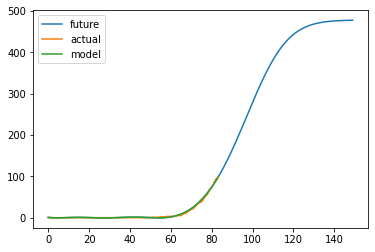

Ukraine average accuracy: 98.9%


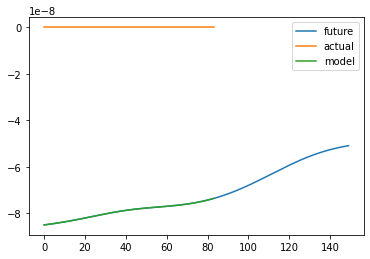

Saint Vincent and the Grenadines average accuracy: 1e+02%


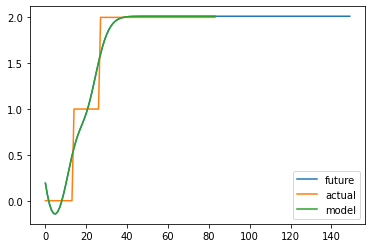

Guizhou average accuracy: 95.5%


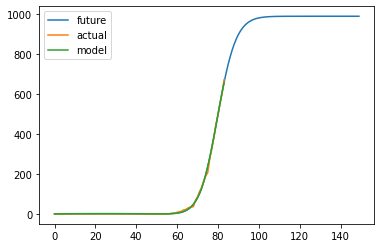

Connecticut average accuracy: 99.6%


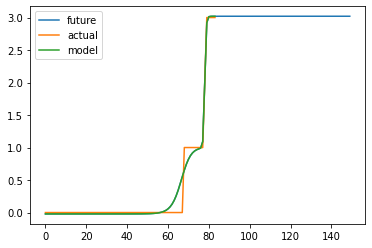

Newfoundland and Labrador average accuracy: 98.2%


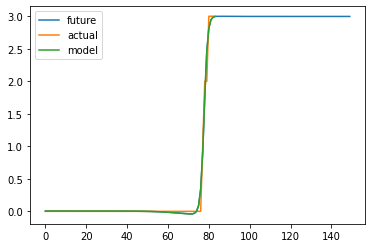

Malta average accuracy: 99.2%


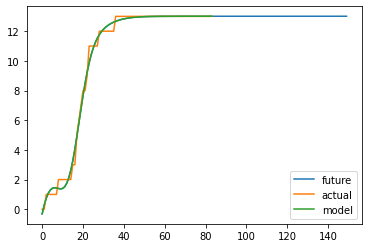

Heilongjiang average accuracy: 98.5%


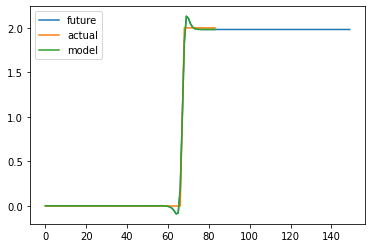

Syria average accuracy: 99.3%


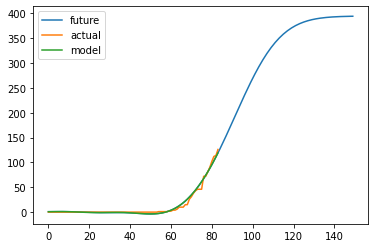

Nevada average accuracy: 98.1%


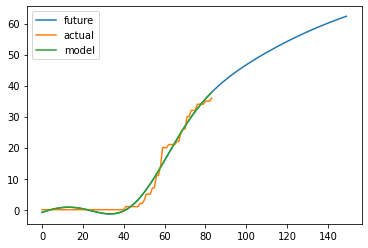

San Marino average accuracy: 96.9%


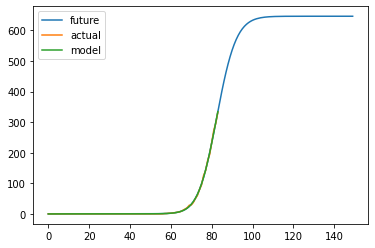

Mexico average accuracy: 99.8%


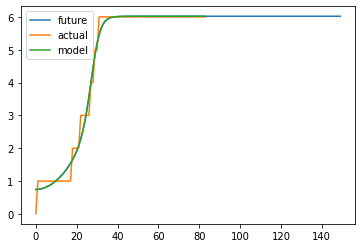

Hebei average accuracy: 98.0%


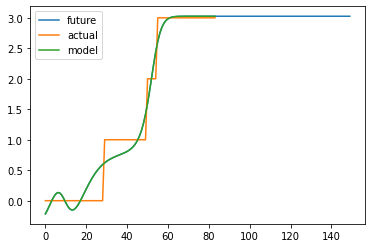

Shaanxi average accuracy: 94.8%


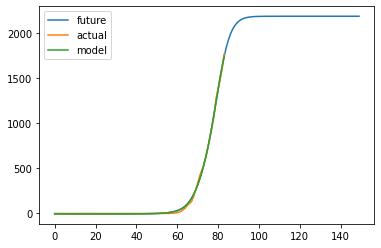

Michigan average accuracy: 99.5%


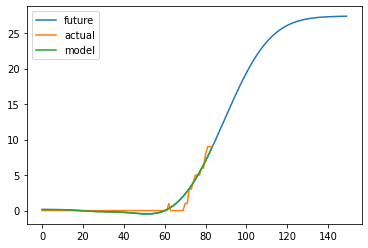

Hawaii average accuracy: 96.0%


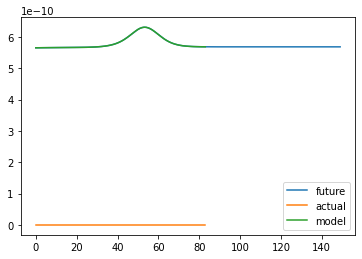

Faroe Islands average accuracy: 1e+02%


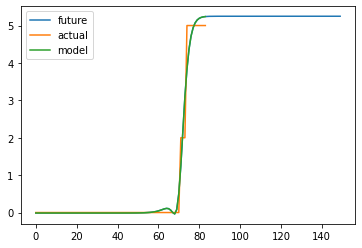

Congo (Brazzaville) average accuracy: 98.3%


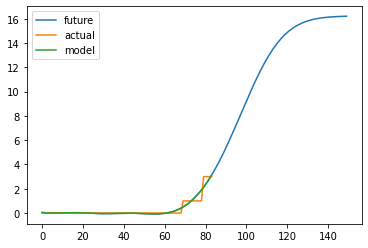

Tanzania average accuracy: 96.3%


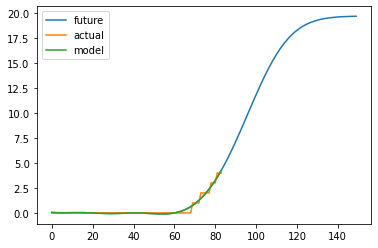

Oman average accuracy: 97.5%


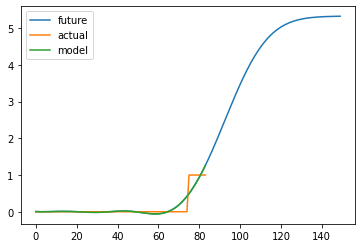

Benin average accuracy: 94.0%


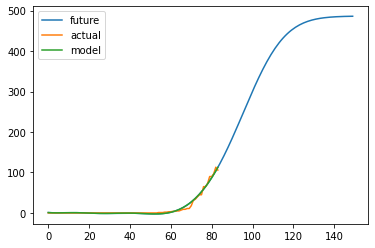

Kentucky average accuracy: 98.2%


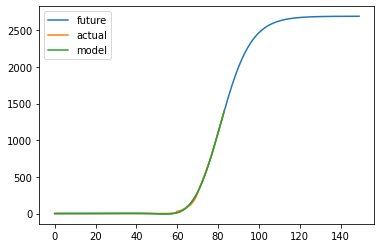

Turkey average accuracy: 99.7%


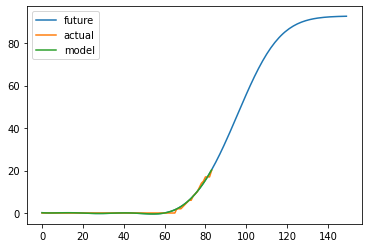

Nebraska average accuracy: 98.6%


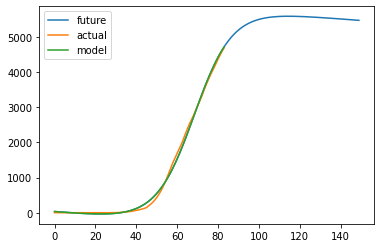

Iran average accuracy: 98.8%


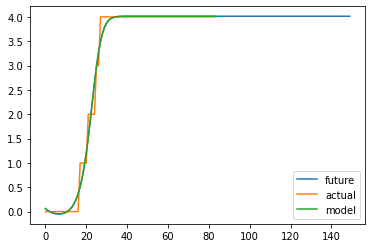

Hunan average accuracy: 98.2%


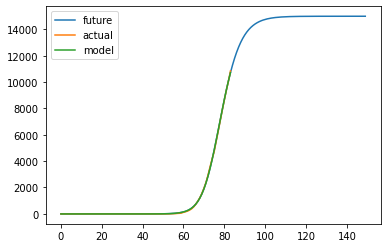

New York average accuracy: 99.8%


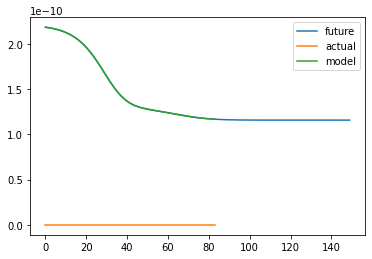

French Polynesia average accuracy: 1e+02%


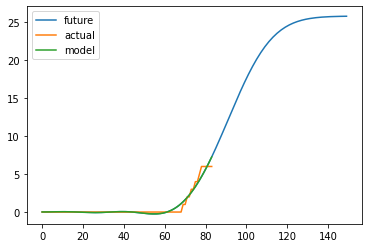

El Salvador average accuracy: 96.8%


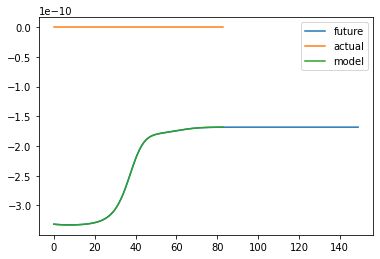

New Caledonia average accuracy: 1e+02%


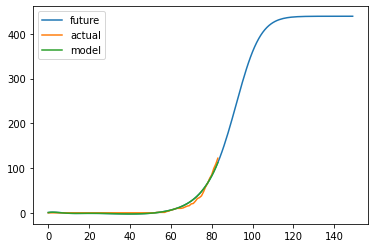

Hungary average accuracy: 98.1%


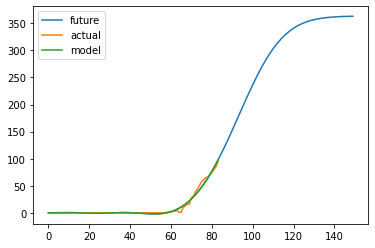

Serbia average accuracy: 98.2%


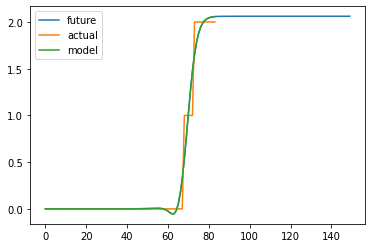

Australian Capital Territory average accuracy: 98.0%


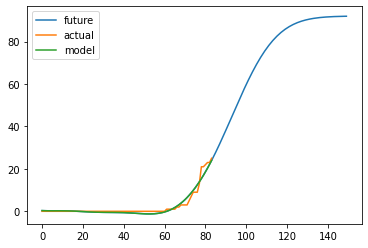

New Hampshire average accuracy: 96.5%


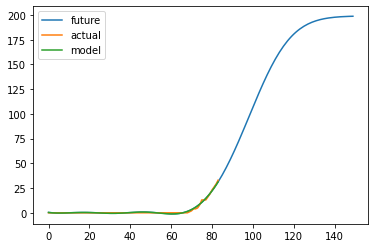

Belarus average accuracy: 98.3%


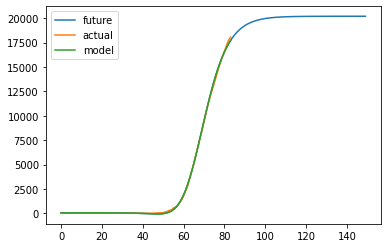

Spain average accuracy: 99.6%


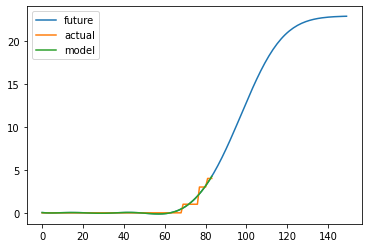

Burma average accuracy: 97.2%


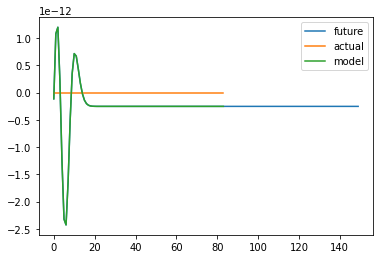

Tibet average accuracy: 1e+02%


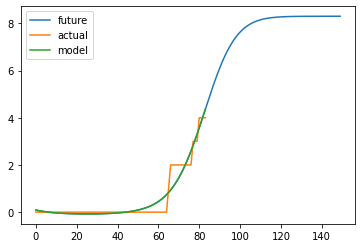

Uzbekistan average accuracy: 95.5%


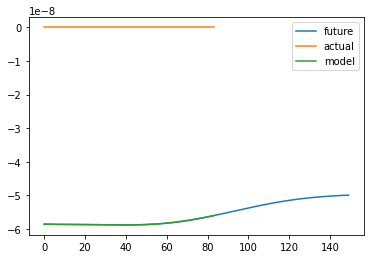

Central African Republic average accuracy: 1e+02%


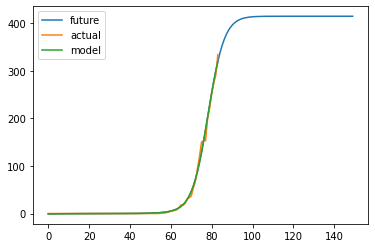

Ontario average accuracy: 99.4%


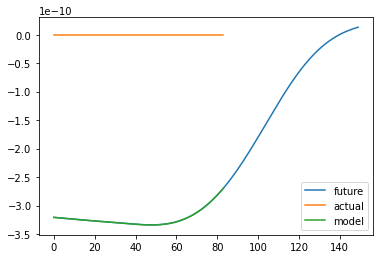

Mozambique average accuracy: 1e+02%


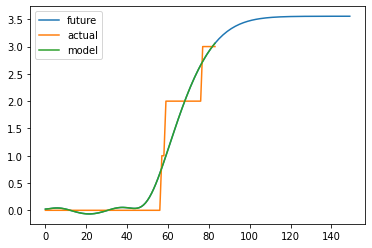

Costa Rica average accuracy: 94.4%


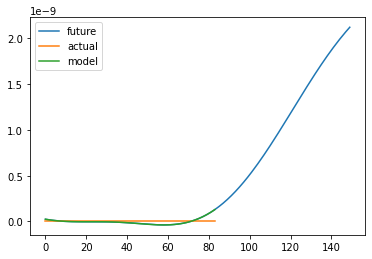

South Sudan average accuracy: 1e+02%


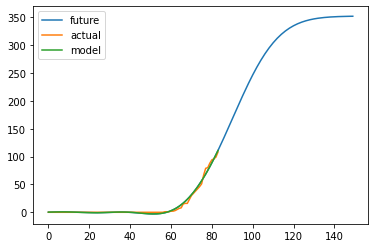

Oklahoma average accuracy: 98.4%


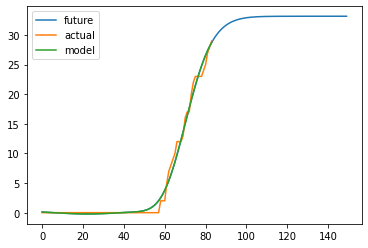

Vermont average accuracy: 98.3%


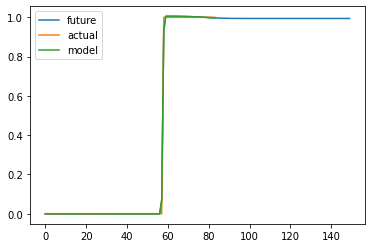

Gabon average accuracy: 99.7%


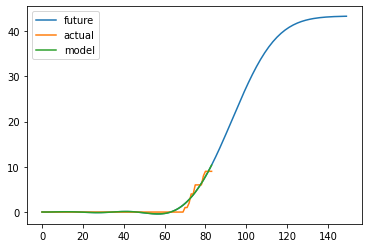

Sint Maarten average accuracy: 96.9%


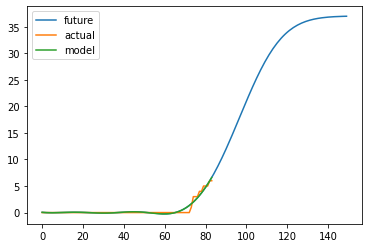

Liberia average accuracy: 97.0%


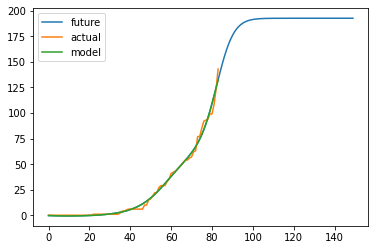

Japan average accuracy: 98.8%


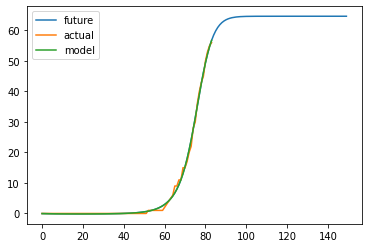

Slovenia average accuracy: 99.3%


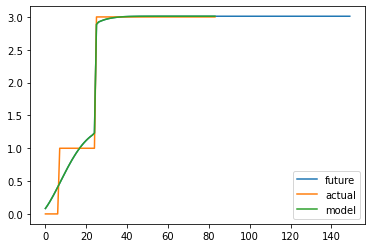

Sichuan average accuracy: 97.5%


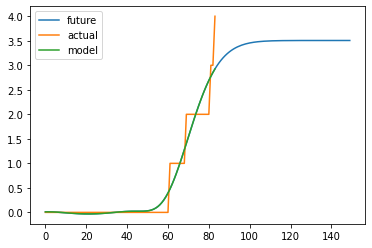

Montenegro average accuracy: 96.9%


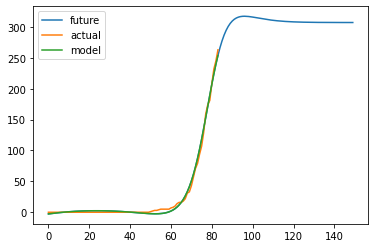

Poland average accuracy: 98.8%


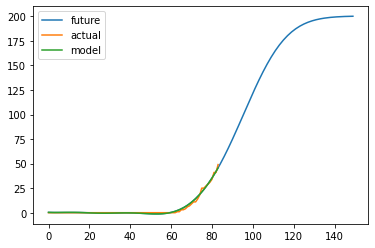

Iowa average accuracy: 98.4%


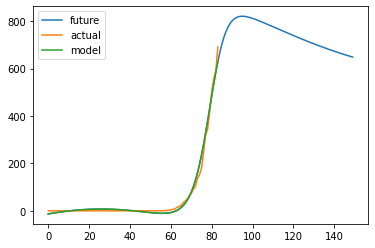

Pennsylvania average accuracy: 98.6%


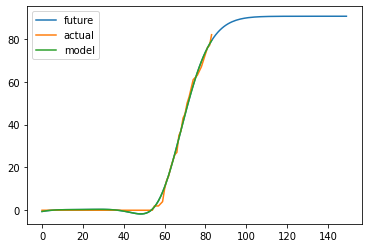

Malaysia average accuracy: 99.0%


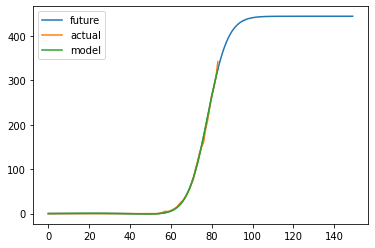

Texas average accuracy: 99.6%


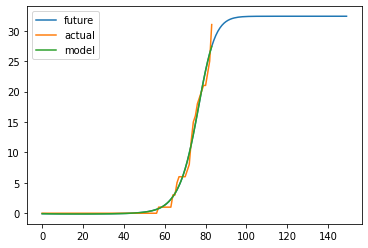

Croatia average accuracy: 98.6%


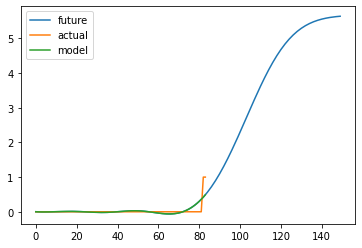

Burundi average accuracy: 95.4%


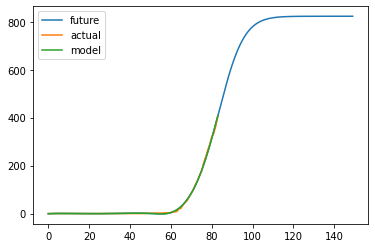

Ireland average accuracy: 99.5%


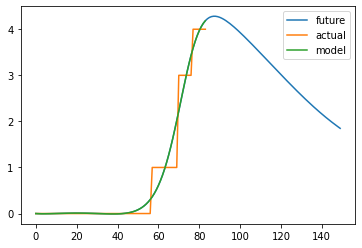

Jamaica average accuracy: 96.7%


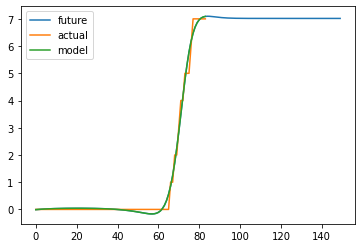

Sri Lanka average accuracy: 98.5%


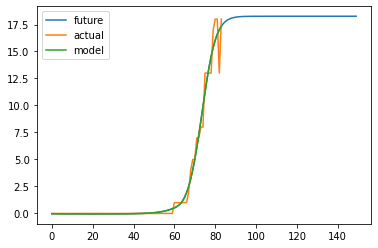

Utah average accuracy: 98.2%


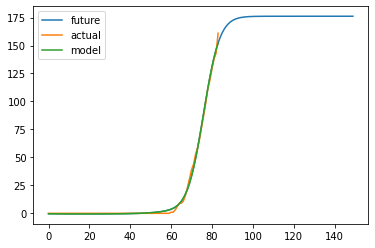

Czechia average accuracy: 99.3%


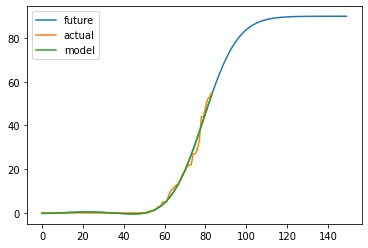

Oregon average accuracy: 98.6%


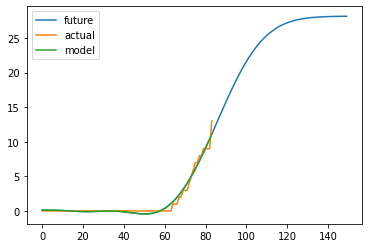

Channel Islands average accuracy: 97.9%


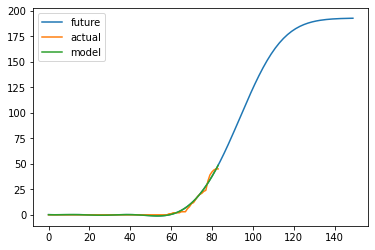

Puerto Rico average accuracy: 98.3%


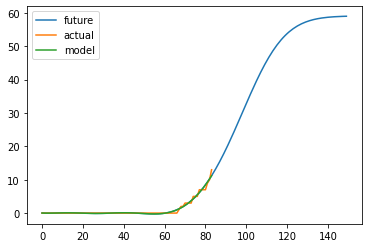

Mali average accuracy: 98.4%


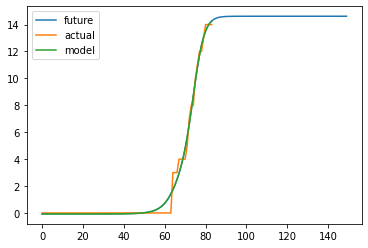

Victoria average accuracy: 98.4%


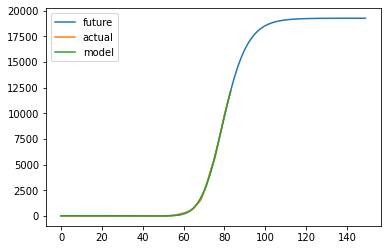

United Kingdom average accuracy: 99.7%


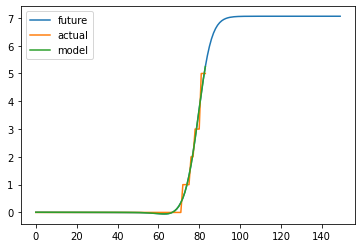

Latvia average accuracy: 98.7%


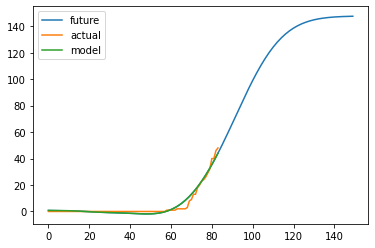

Alberta average accuracy: 97.1%


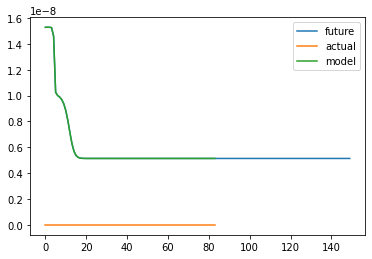

Qinghai average accuracy: 1e+02%


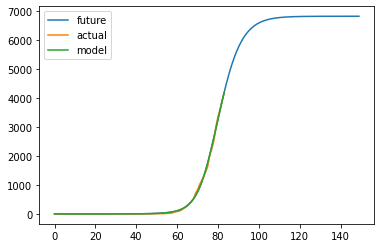

Belgium average accuracy: 99.6%


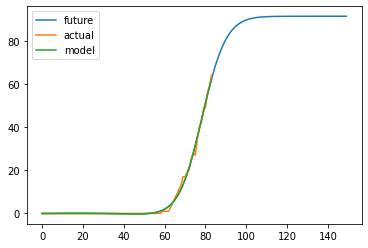

Finland average accuracy: 99.3%


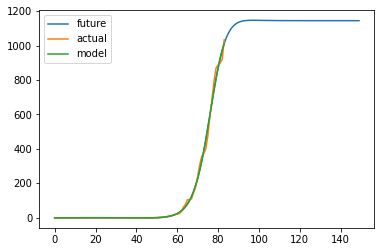

Sweden average accuracy: 99.3%


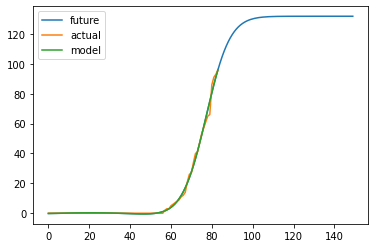

Pakistan average accuracy: 99.2%


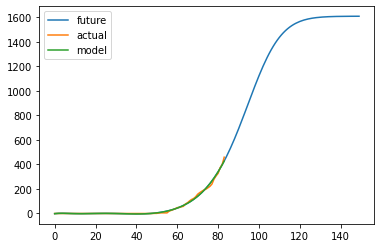

Indonesia average accuracy: 99.1%


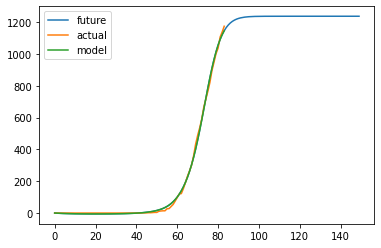

Switzerland average accuracy: 99.3%


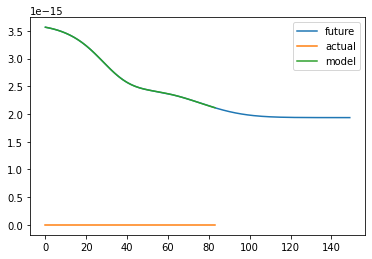

Eritrea average accuracy: 1e+02%


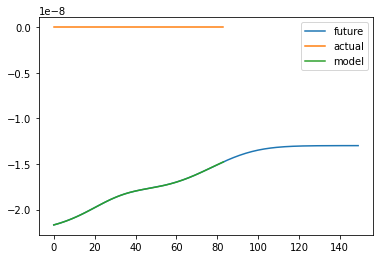

French Guiana average accuracy: 1e+02%


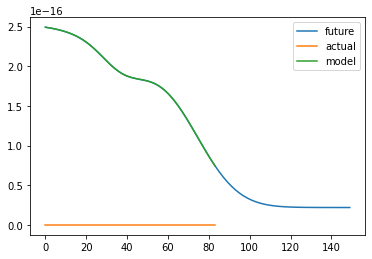

Madagascar average accuracy: 1e+02%


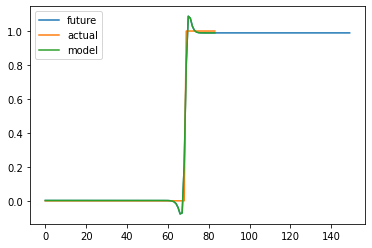

Botswana average accuracy: 98.8%


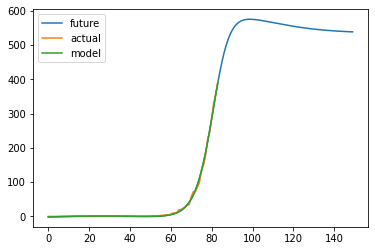

India average accuracy: 99.5%


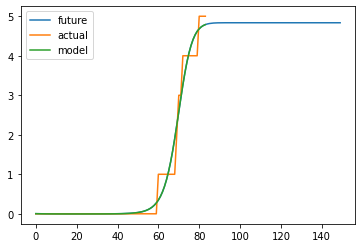

Guam average accuracy: 97.5%


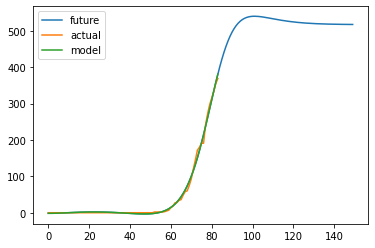

Ecuador average accuracy: 99.1%


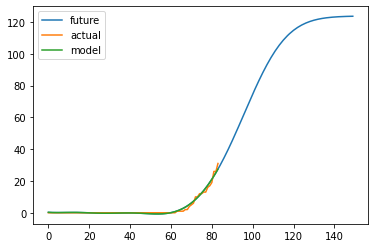

New Mexico average accuracy: 98.2%


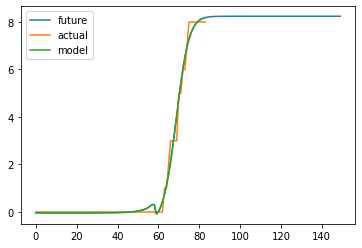

Trinidad and Tobago average accuracy: 98.4%


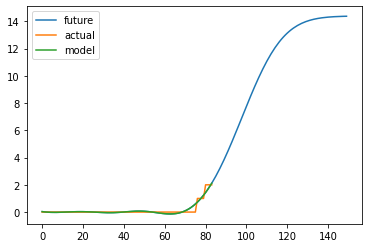

Malawi average accuracy: 96.1%


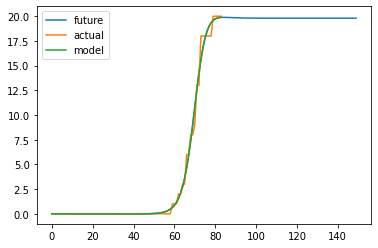

Congo (Kinshasa) average accuracy: 98.9%


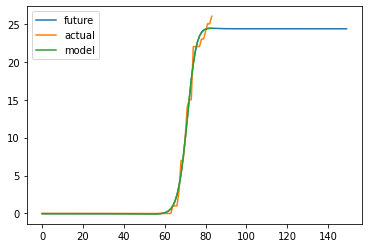

Honduras average accuracy: 99.0%


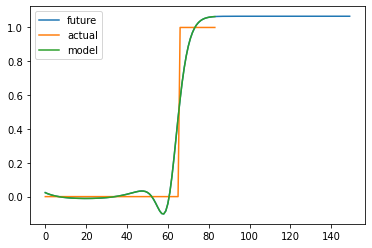

Brunei average accuracy: 95.0%


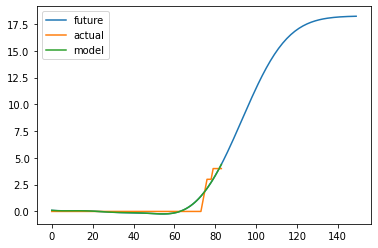

Barbados average accuracy: 94.6%


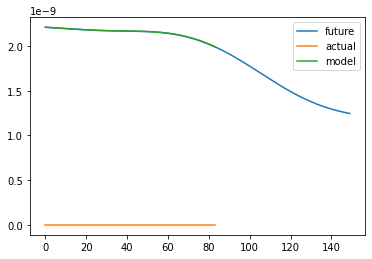

Nepal average accuracy: 1e+02%


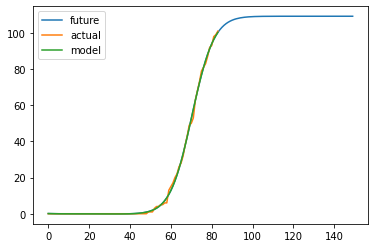

Greece average accuracy: 99.5%


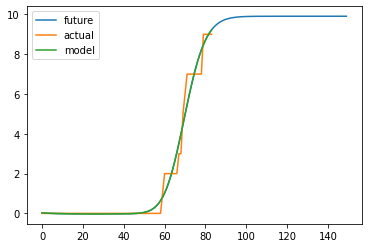

Mauritius average accuracy: 97.6%


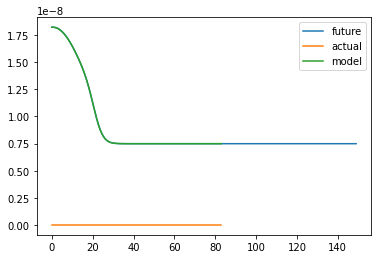

Jiangsu average accuracy: 1e+02%


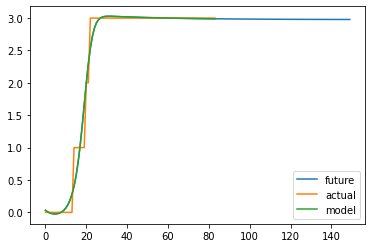

Tianjin average accuracy: 98.0%


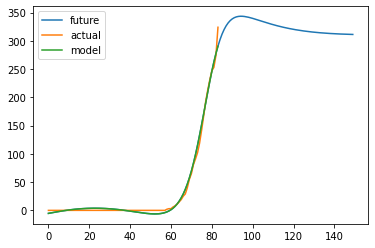

Ohio average accuracy: 98.8%


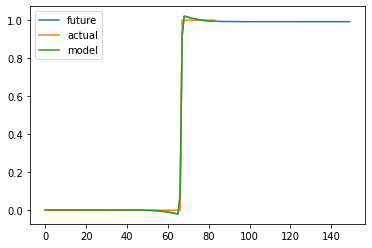

Monaco average accuracy: 99.4%


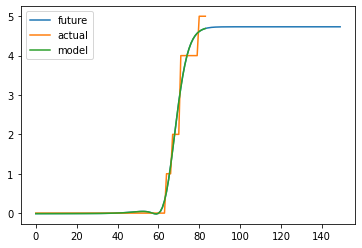

Queensland average accuracy: 97.9%


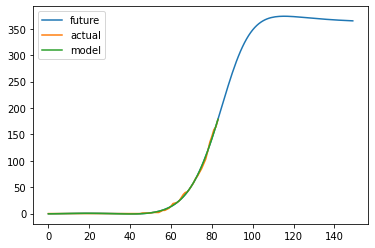

Egypt average accuracy: 99.4%


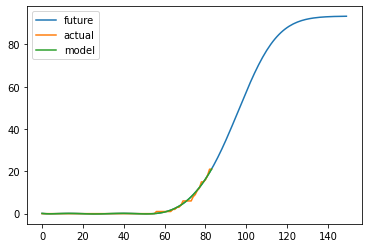

Cuba average accuracy: 98.9%


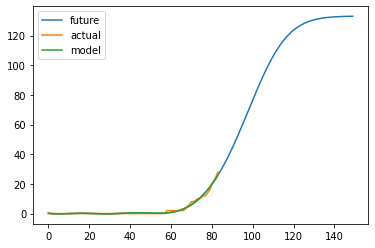

United Arab Emirates average accuracy: 98.3%


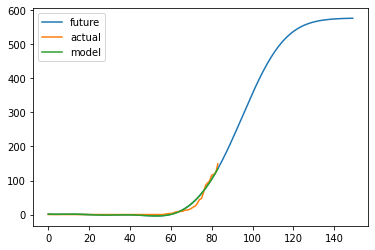

Missouri average accuracy: 97.8%


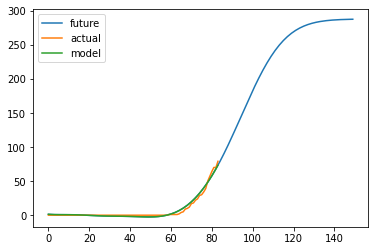

Minnesota average accuracy: 97.4%


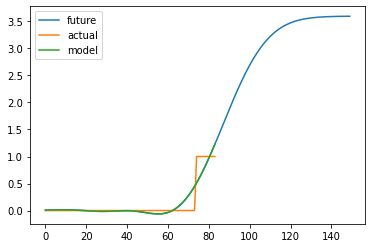

Virgin Islands average accuracy: 93.3%


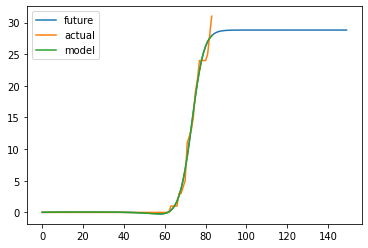

Estonia average accuracy: 99.0%


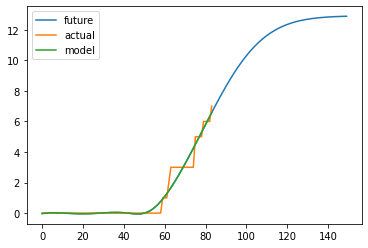

Paraguay average accuracy: 97.3%


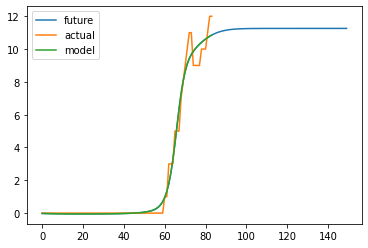

Cyprus average accuracy: 97.8%


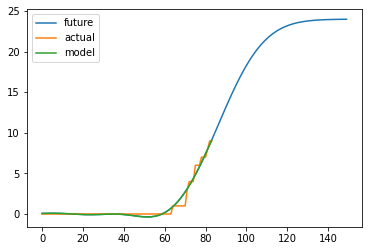

Kenya average accuracy: 97.5%


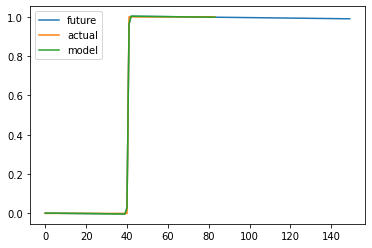

Inner Mongolia average accuracy: 99.8%


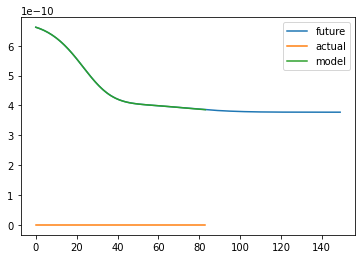

Anguilla average accuracy: 1e+02%


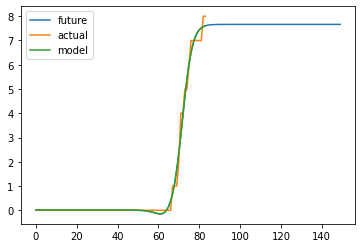

Uruguay average accuracy: 98.8%


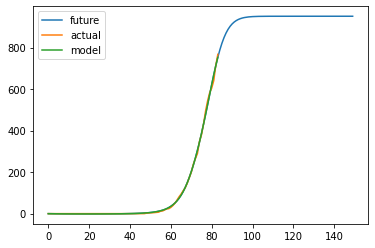

California average accuracy: 99.6%


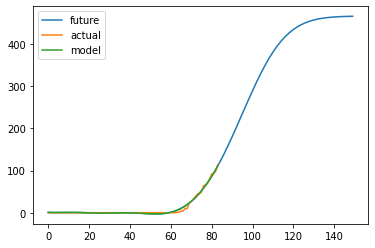

Alabama average accuracy: 98.5%


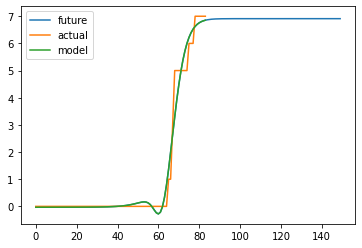

Jordan average accuracy: 97.6%


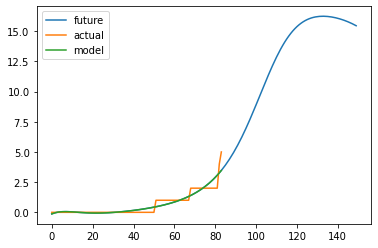

Sudan average accuracy: 95.7%


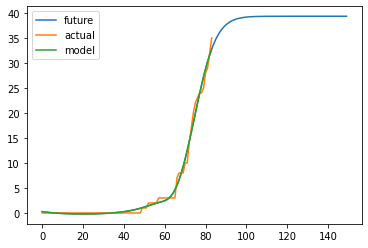

Bulgaria average accuracy: 98.6%


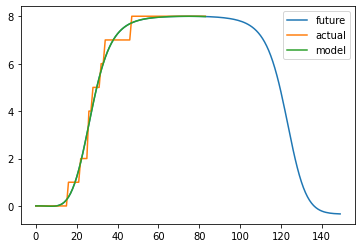

Guangdong average accuracy: 97.8%


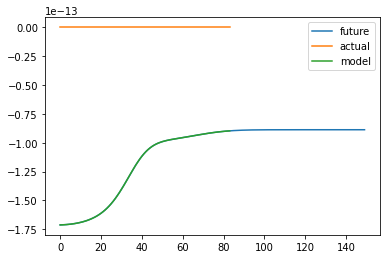

Northern Territory average accuracy: 1e+02%


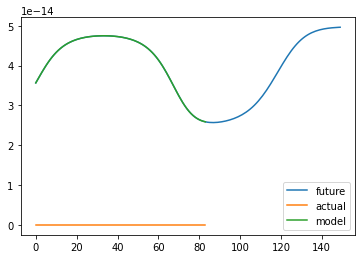

Bhutan average accuracy: 1e+02%


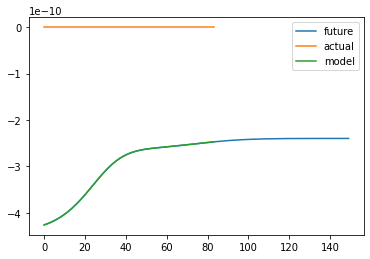

Yukon average accuracy: 1e+02%


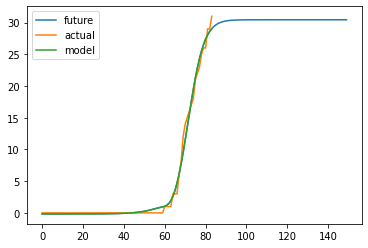

Andorra average accuracy: 98.7%


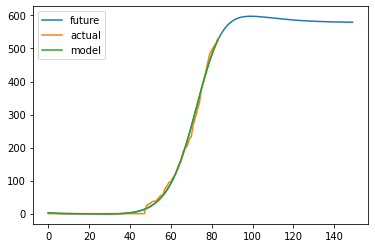

Washington average accuracy: 99.1%


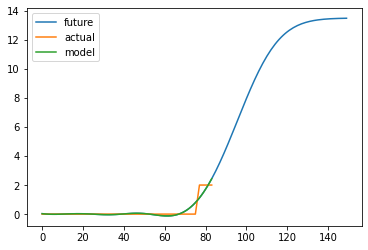

Antigua and Barbuda average accuracy: 94.9%


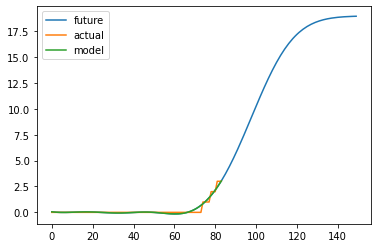

Haiti average accuracy: 97.1%


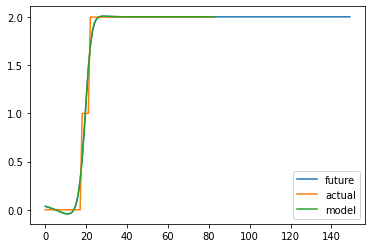

Guangxi average accuracy: 98.3%


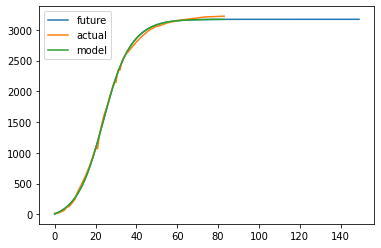

Hubei average accuracy: 99.1%


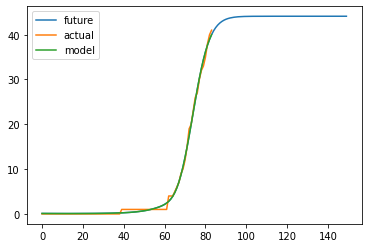

Thailand average accuracy: 99.1%


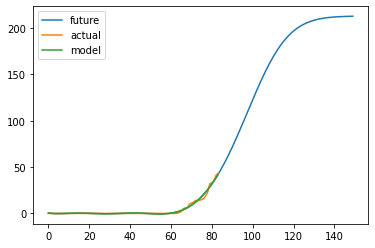

Delaware average accuracy: 98.5%


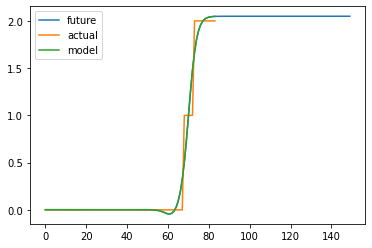

St Martin average accuracy: 98.0%


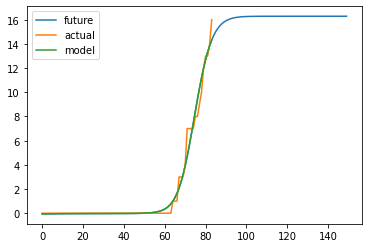

Armenia average accuracy: 98.6%


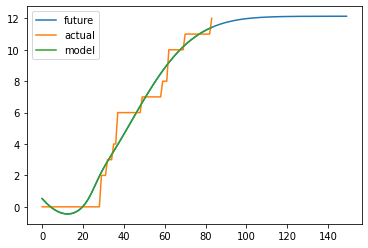

Diamond Princess average accuracy: 95.6%


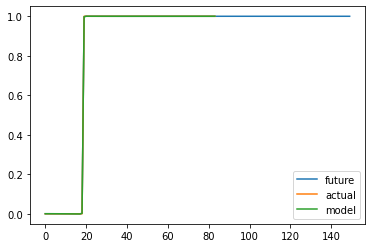

Jiangxi average accuracy: 1e+02%


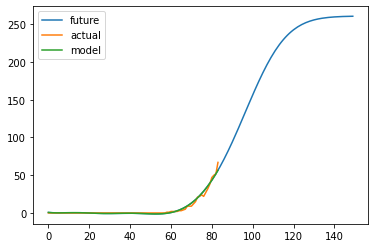

District of Columbia average accuracy: 98.3%


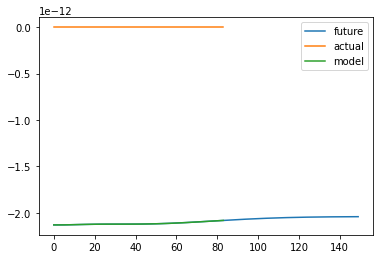

Papua New Guinea average accuracy: 1e+02%


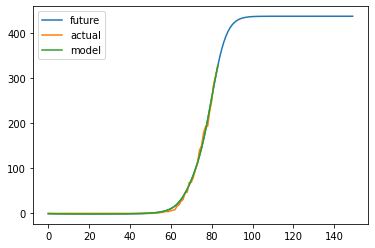

Colorado average accuracy: 99.2%


In [12]:
# Fatality
for cname in cnames:
    if cname == "Canada":
        continue
    model, powers, casenorm, fatnorm = deepcopy(models[cname])

    import matplotlib.pyplot as plt

    raw = model(torch.Tensor([[pow(xval, i) for i in powers] for xval in list(xbycountry[cname])])).detach()
    predictions = np.array([j.numpy()[1]*fatnorm for j in raw])
    plt.plot(np.array(list(range(150))), np.array([j.numpy()[1]*fatnorm for j in model(torch.Tensor([[pow(xval, i) for i in powers] for xval in list(range(150))])).detach()]), label="future")
    plt.plot(xbycountry[cname], [i[1] for i in ybycountry[cname]], label="actual")
    plt.plot(xbycountry[cname], predictions, label="model")
    # plt.plot(np.array([140 for i in range(200000)]), np.array(list(range(200000))), label="day 70")
    # plt.plot(np.array(list(range(200))), np.array([390000 for i in range(200)]), label="growth slows down")
    plt.xlabel = "Days since 20-01-22"
    plt.ylabel = "Cases"
    plt.legend()
    plt.show()
    # print(f"Will max out at {model(torch.Tensor([[102, 102**2]])).detach().numpy()[0][1]*8e4} infected around May 26 2020")
    print(f"{cname} average accuracy: {100*(1 - np.mean(abs(predictions - [i[1] for i in ybycountry[cname]]))/fatnorm):.3}%")
    del plt

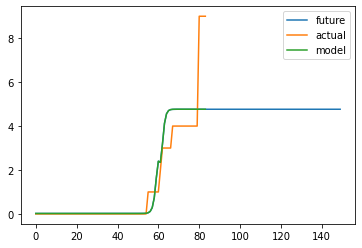

Gambia average accuracy: 99.5%


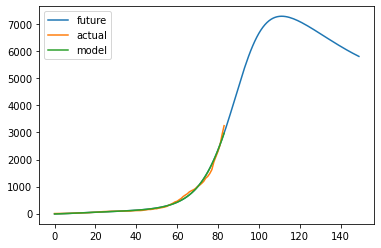

Singapore average accuracy: 98.9%


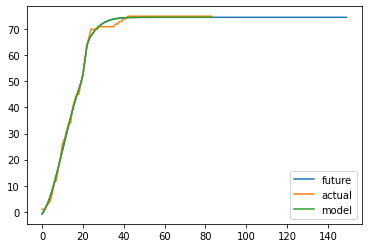

Ningxia average accuracy: 99.2%


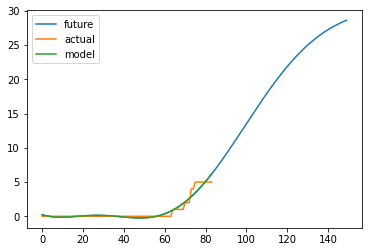

Northwest Territories average accuracy: 99.7%


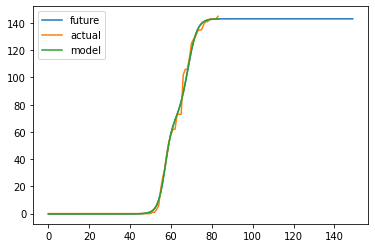

Guadeloupe average accuracy: 99.1%


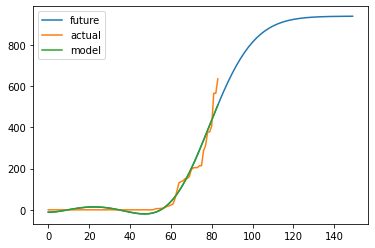

Ghana average accuracy: 97.0%


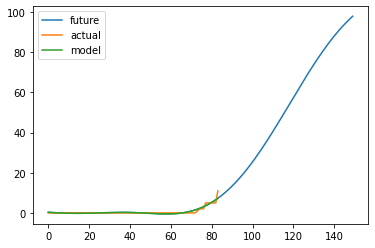

Falkland Islands (Malvinas) average accuracy: 99.6%


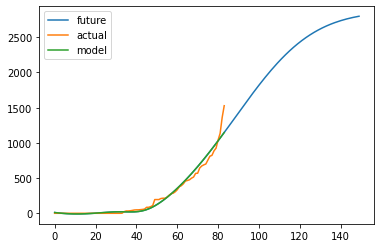

Bahrain average accuracy: 97.8%


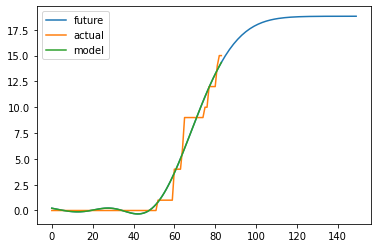

Eswatini average accuracy: 99.5%


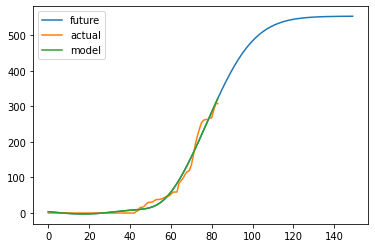

West Bank and Gaza average accuracy: 97.5%


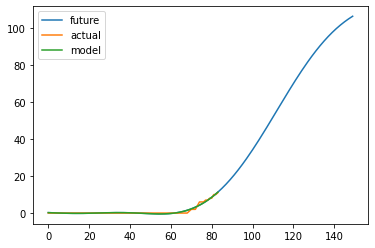

Sierra Leone average accuracy: 99.7%


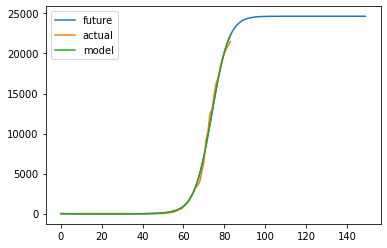

Louisiana average accuracy: 99.3%


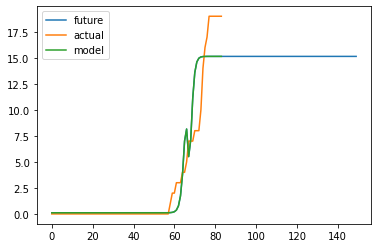

Angola average accuracy: 99.0%


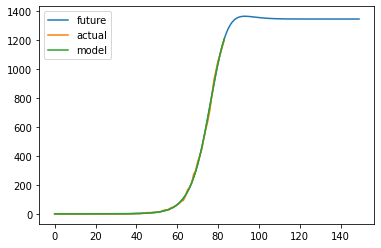

Azerbaijan average accuracy: 99.7%


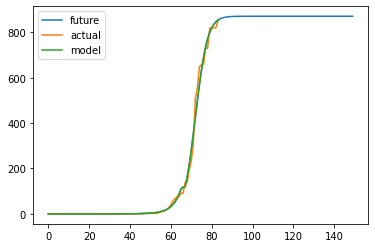

Cameroon average accuracy: 99.0%


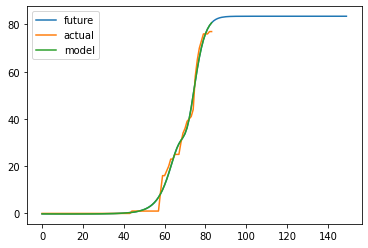

Togo average accuracy: 98.8%


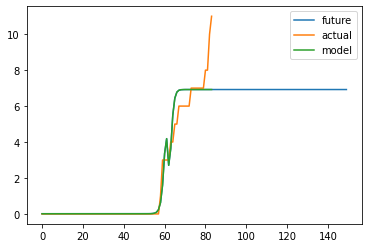

Cabo Verde average accuracy: 99.7%


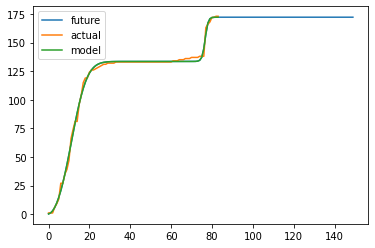

Shanxi average accuracy: 99.1%


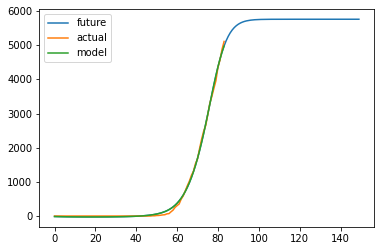

North Carolina average accuracy: 99.3%


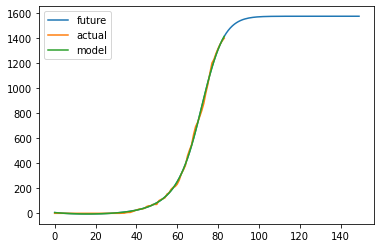

Iraq average accuracy: 99.4%


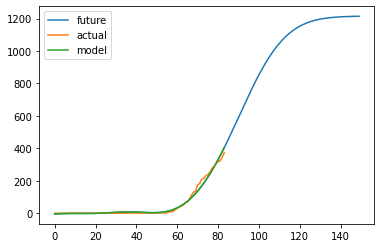

Nigeria average accuracy: 98.0%


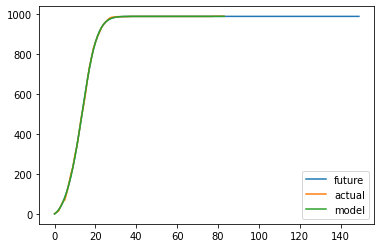

Anhui average accuracy: 99.8%


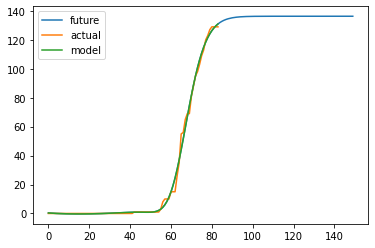

Gibraltar average accuracy: 99.1%


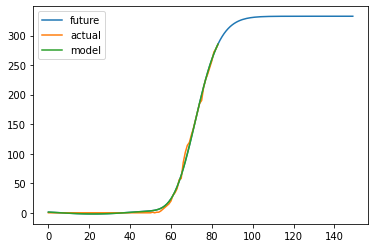

Alaska average accuracy: 99.2%


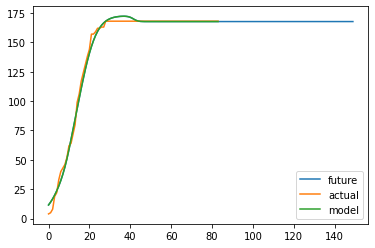

Hainan average accuracy: 98.7%


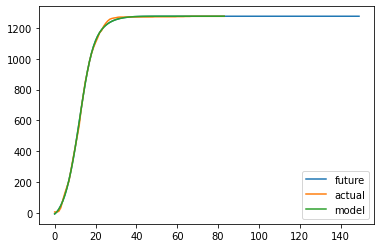

Henan average accuracy: 99.6%


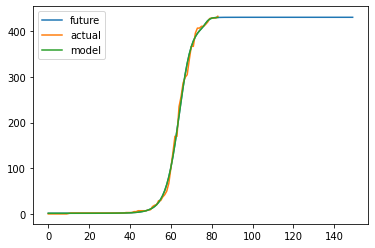

South Australia average accuracy: 99.2%


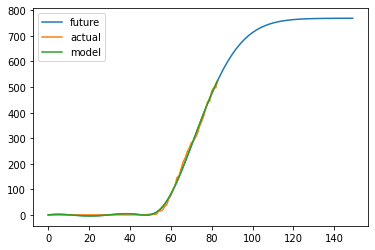

Burkina Faso average accuracy: 99.1%


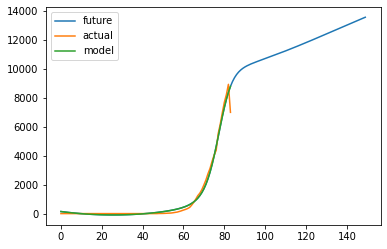

Maryland average accuracy: 98.4%


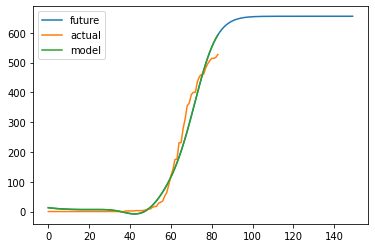

Western Australia average accuracy: 96.7%


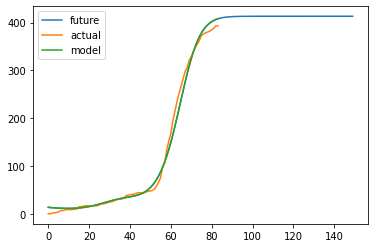

Taiwan* average accuracy: 98.0%


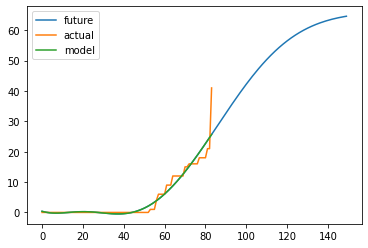

Equatorial Guinea average accuracy: 99.0%


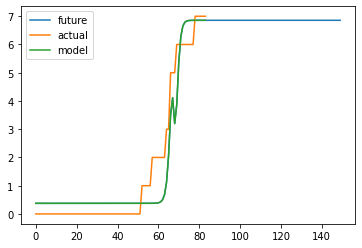

Mauritania average accuracy: 99.4%


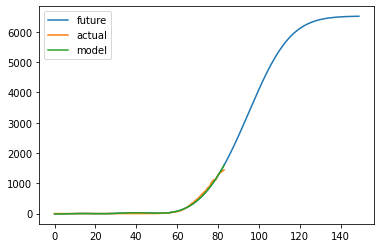

Kansas average accuracy: 98.6%


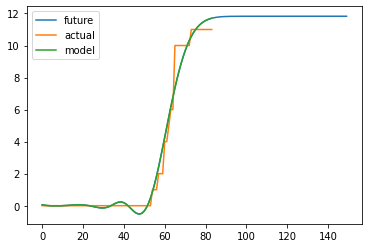

Greenland average accuracy: 99.7%


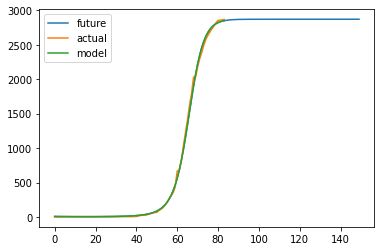

New South Wales average accuracy: 99.4%


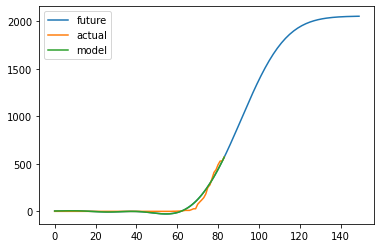

Niger average accuracy: 97.4%


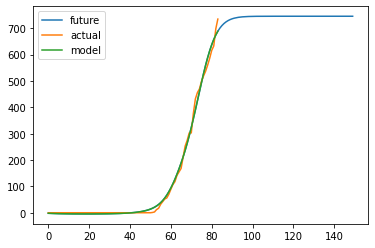

Maine average accuracy: 98.8%


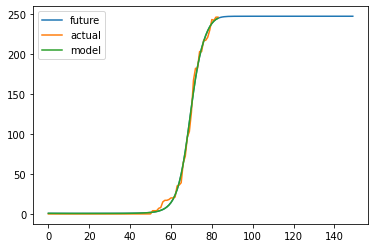

Manitoba average accuracy: 99.0%


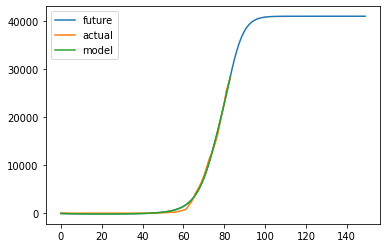

Massachusetts average accuracy: 99.2%


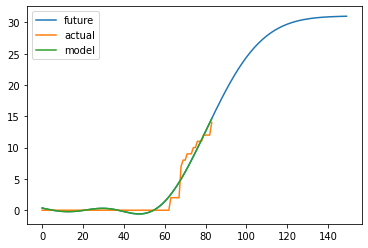

Saint Kitts and Nevis average accuracy: 99.4%


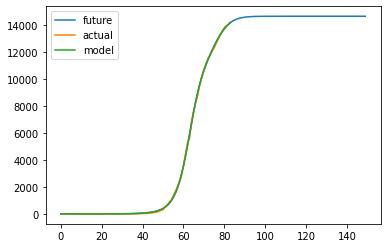

Austria average accuracy: 99.7%


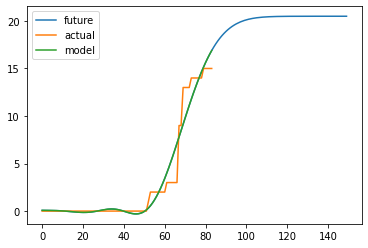

Saint Lucia average accuracy: 99.4%


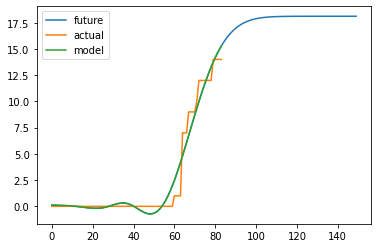

Grenada average accuracy: 99.4%


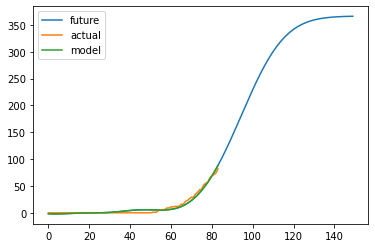

Ethiopia average accuracy: 97.3%


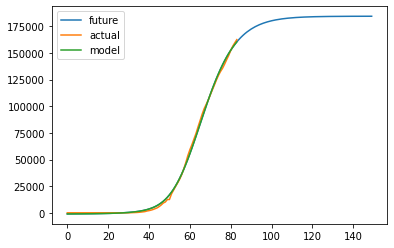

Italy average accuracy: 99.2%


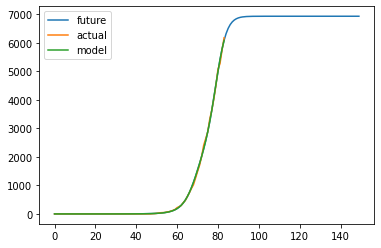

Virginia average accuracy: 99.7%


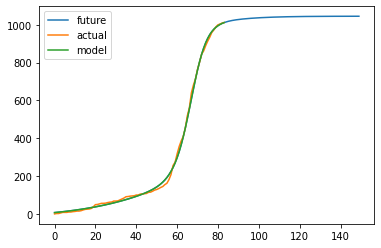

Hong Kong average accuracy: 99.1%


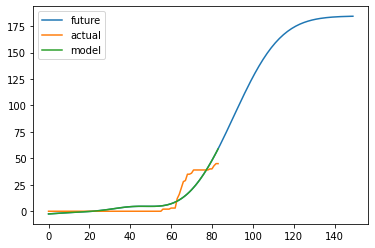

Zambia average accuracy: 95.5%


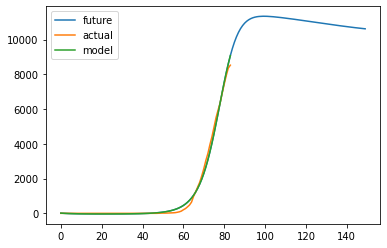

Indiana average accuracy: 98.8%


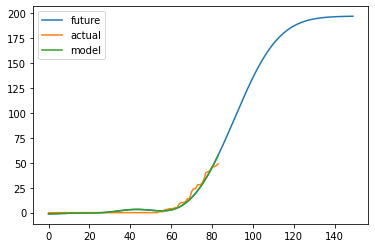

Bahamas average accuracy: 98.1%


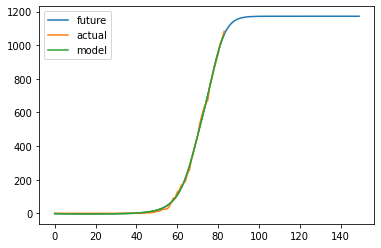

Bosnia and Herzegovina average accuracy: 99.4%


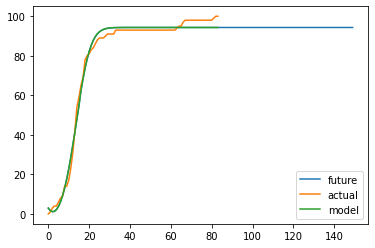

Jilin average accuracy: 97.5%


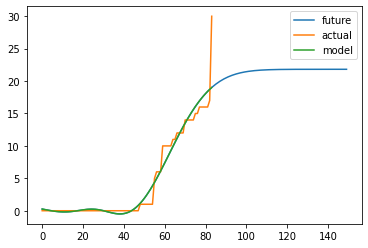

Mongolia average accuracy: 99.2%


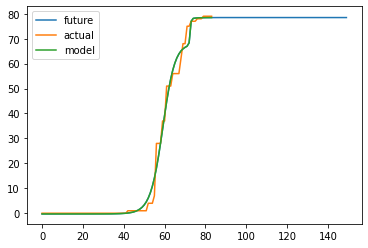

Liechtenstein average accuracy: 98.6%


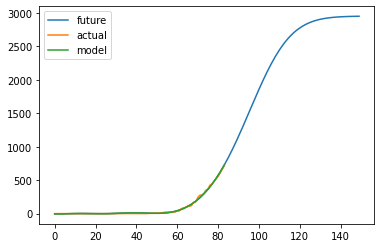

Afghanistan average accuracy: 99.1%


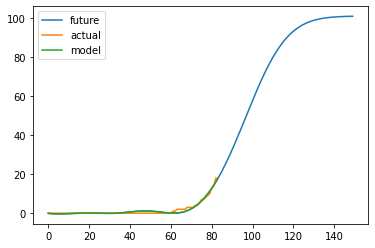

Belize average accuracy: 99.5%


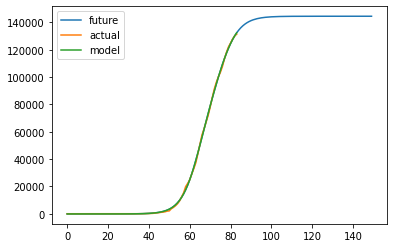

Germany average accuracy: 99.7%


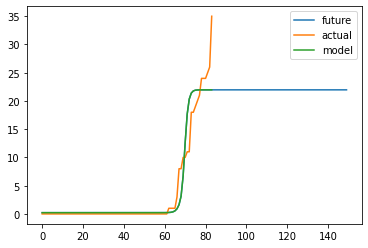

Libya average accuracy: 98.9%


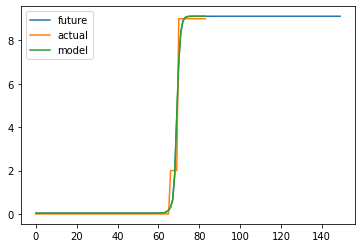

MS Zaandam average accuracy: 99.9%


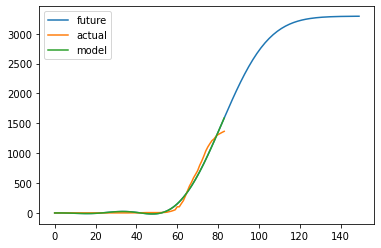

New Zealand average accuracy: 97.5%


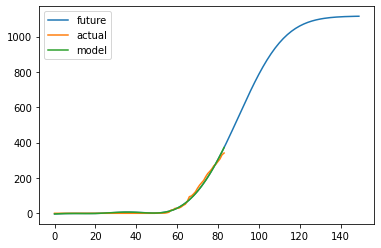

North Dakota average accuracy: 98.4%


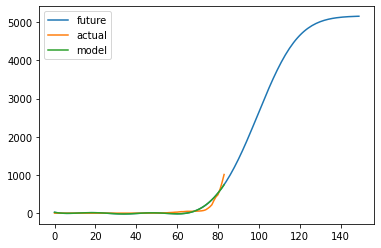

Bangladesh average accuracy: 97.2%


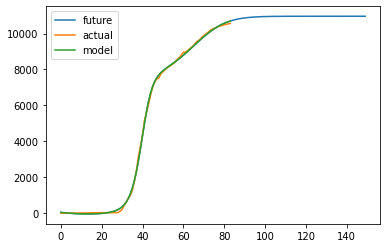

Korea, South average accuracy: 99.4%


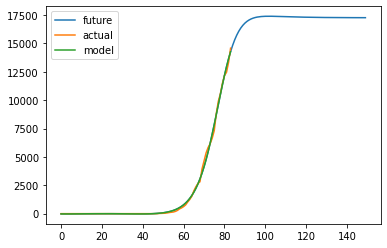

Georgia average accuracy: 99.4%


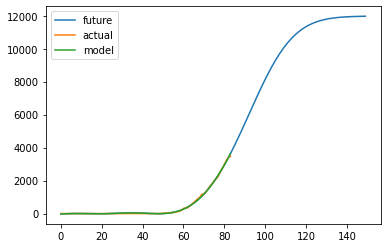

Panama average accuracy: 99.4%


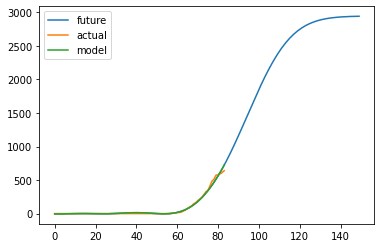

West Virginia average accuracy: 98.6%


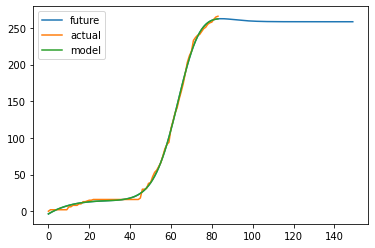

Vietnam average accuracy: 99.1%


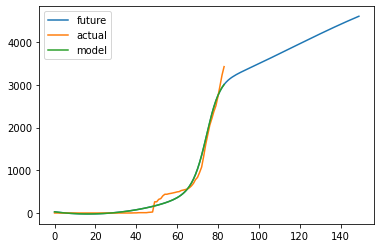

Qatar average accuracy: 97.7%


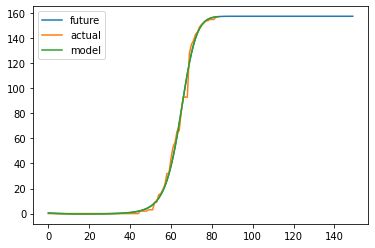

Martinique average accuracy: 99.0%


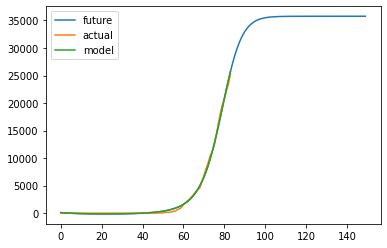

Brazil average accuracy: 99.2%


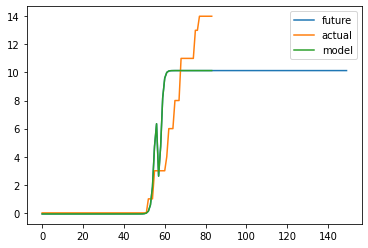

Curacao average accuracy: 98.9%


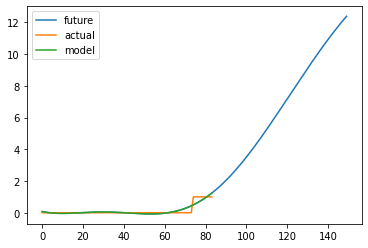

Saint Pierre and Miquelon average accuracy: 99.9%


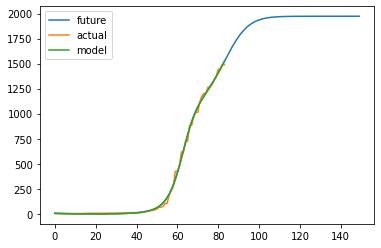

British Columbia average accuracy: 99.2%


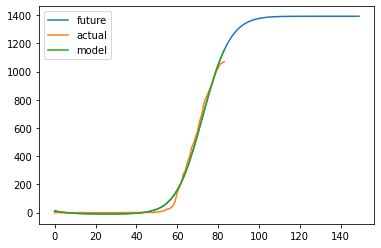

Lithuania average accuracy: 98.3%


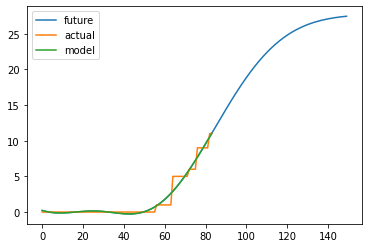

Montserrat average accuracy: 99.7%


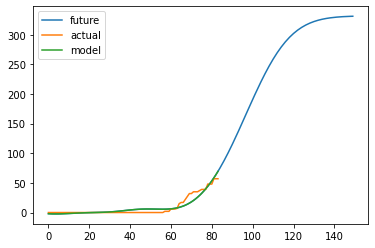

Bermuda average accuracy: 96.2%


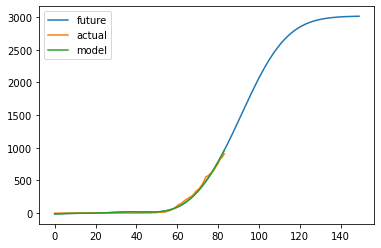

North Macedonia average accuracy: 98.4%


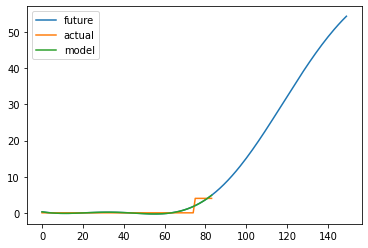

Sao Tome and Principe average accuracy: 99.7%


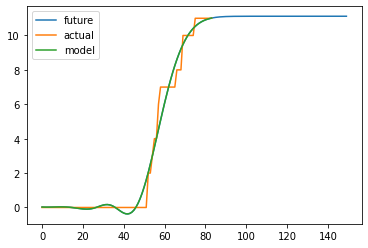

Seychelles average accuracy: 99.7%


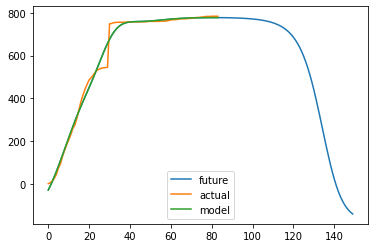

Shandong average accuracy: 98.2%


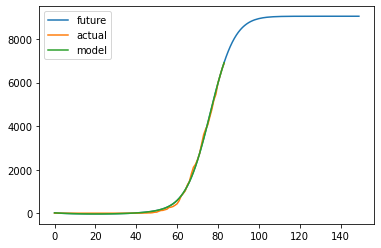

Romania average accuracy: 99.3%


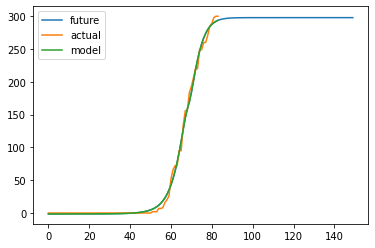

Saskatchewan average accuracy: 98.8%


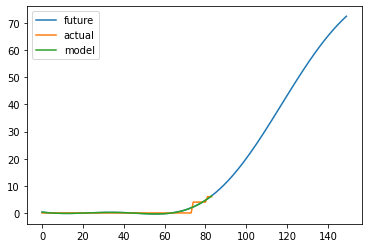

Western Sahara average accuracy: 99.7%


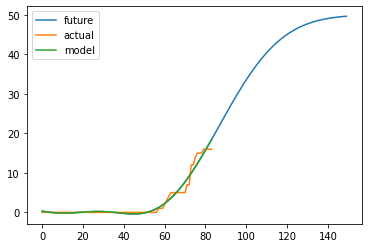

Fiji average accuracy: 99.5%


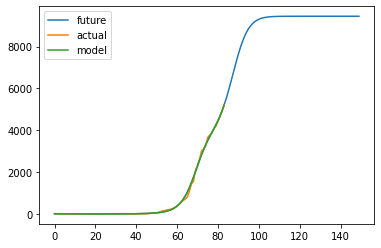

Philippines average accuracy: 99.5%


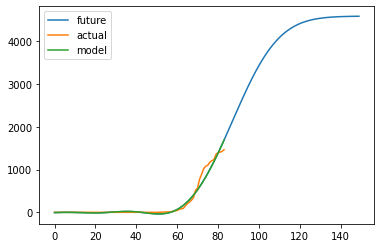

Idaho average accuracy: 97.3%


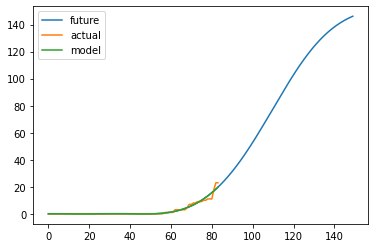

Chad average accuracy: 99.5%


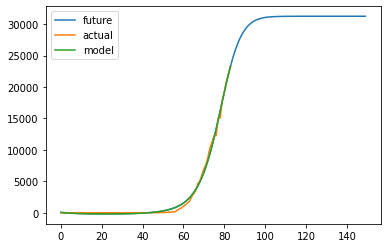

Illinois average accuracy: 98.9%


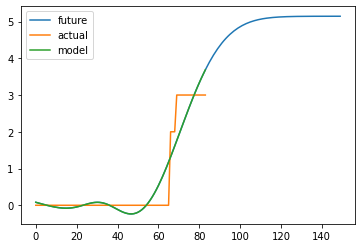

British Virgin Islands average accuracy: 99.8%


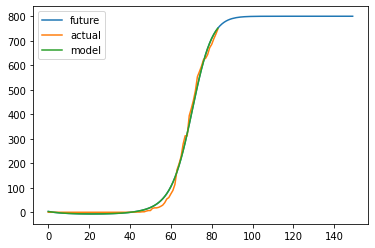

Tunisia average accuracy: 98.6%


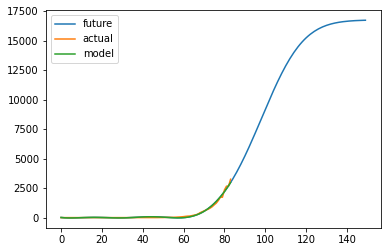

Rhode Island average accuracy: 98.6%


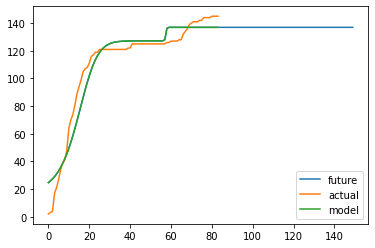

Liaoning average accuracy: 95.2%


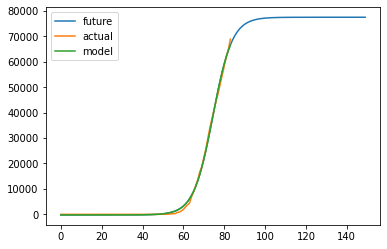

New Jersey average accuracy: 99.3%


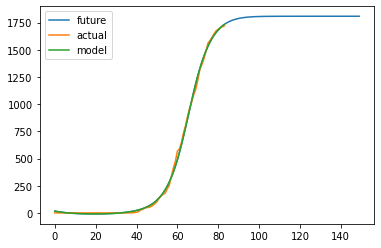

Iceland average accuracy: 99.2%


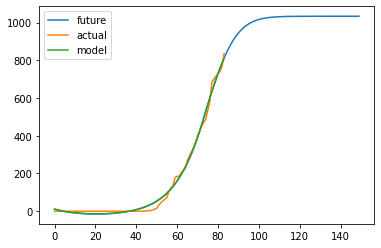

Slovakia average accuracy: 98.3%


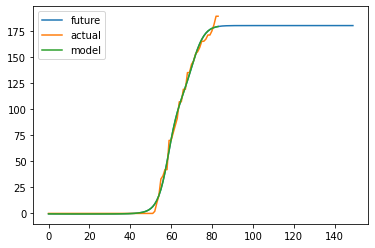

Venezuela average accuracy: 98.9%


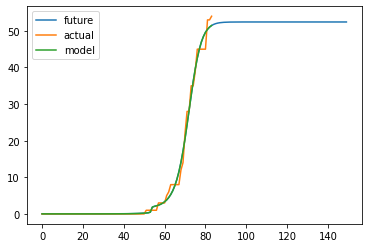

Cayman Islands average accuracy: 99.3%


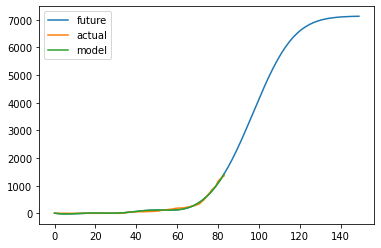

Kuwait average accuracy: 98.4%


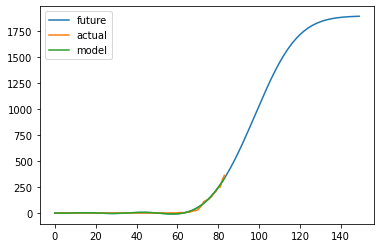

Guinea average accuracy: 98.6%


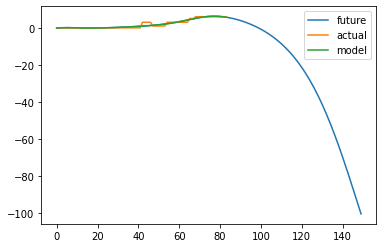

Saint Barthelemy average accuracy: 99.6%


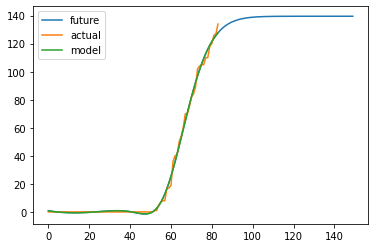

Rwanda average accuracy: 99.0%


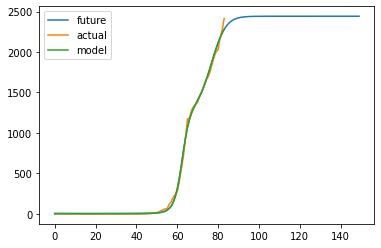

South Africa average accuracy: 99.3%


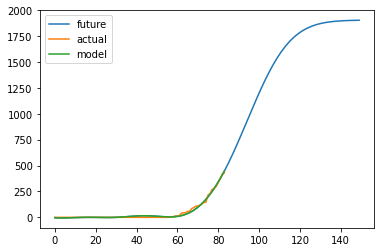

Kyrgyzstan average accuracy: 98.2%


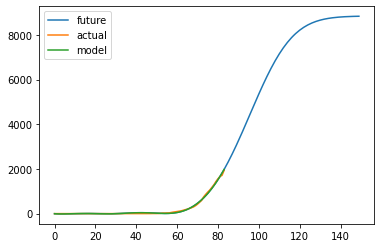

Moldova average accuracy: 98.9%


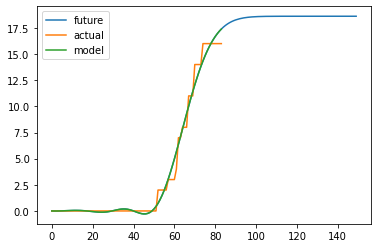

Namibia average accuracy: 99.6%


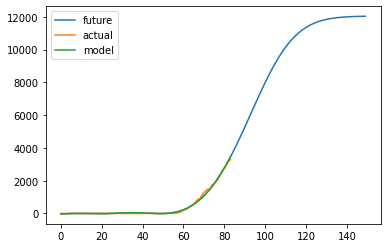

Dominican Republic average accuracy: 99.0%


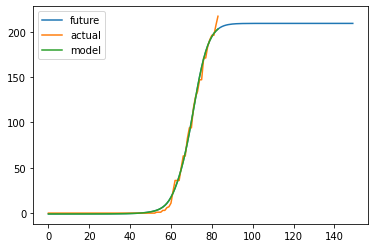

Mayotte average accuracy: 99.0%


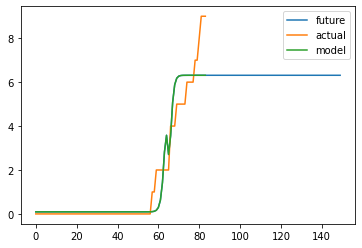

Nicaragua average accuracy: 99.5%


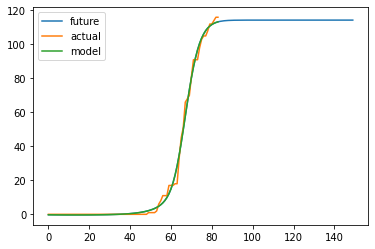

New Brunswick average accuracy: 98.8%


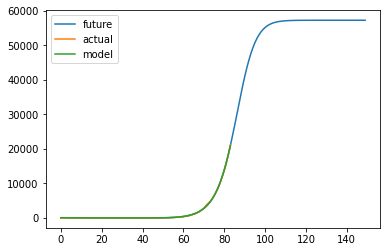

Russia average accuracy: 99.8%


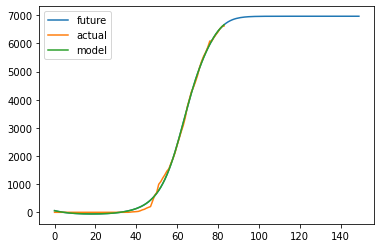

Norway average accuracy: 99.1%


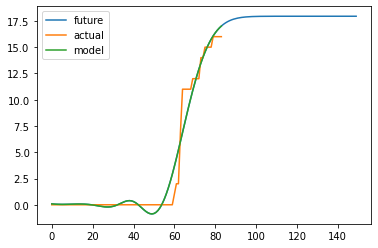

Dominica average accuracy: 99.4%


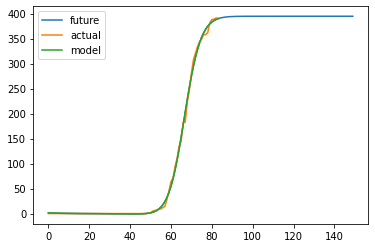

Reunion average accuracy: 99.4%


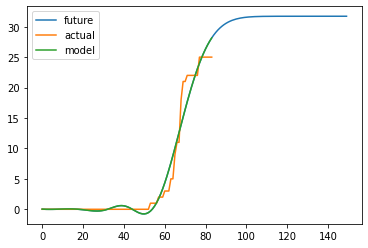

Prince Edward Island average accuracy: 99.2%


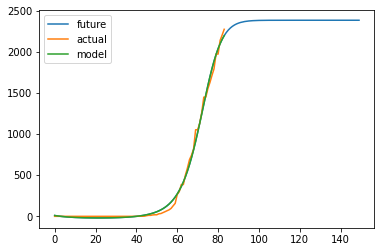

Argentina average accuracy: 98.8%


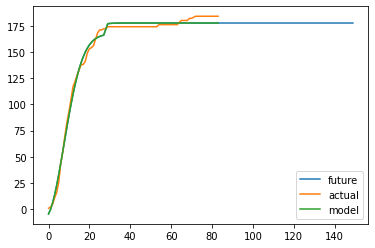

Yunnan average accuracy: 97.9%


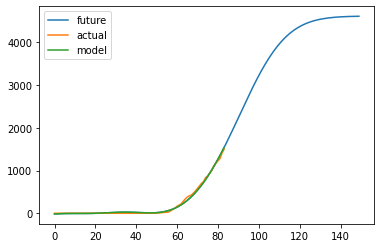

Arkansas average accuracy: 98.7%


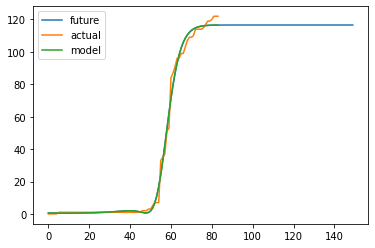

Cambodia average accuracy: 98.4%


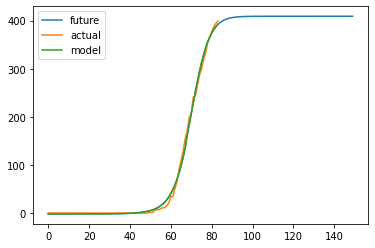

Montana average accuracy: 99.0%


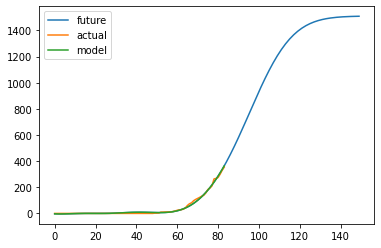

Bolivia average accuracy: 98.6%


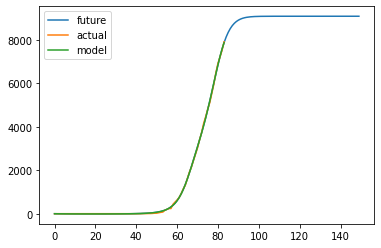

Chile average accuracy: 99.7%


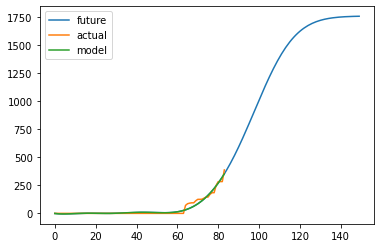

Kosovo average accuracy: 97.4%


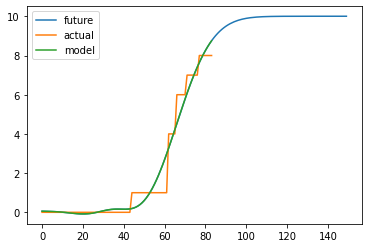

Holy See average accuracy: 99.7%


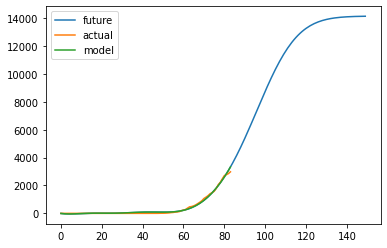

Colombia average accuracy: 98.2%


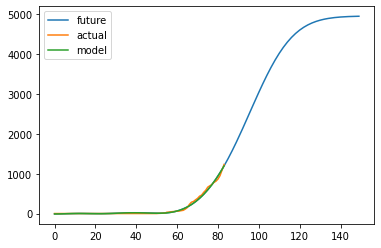

Kazakhstan average accuracy: 98.7%


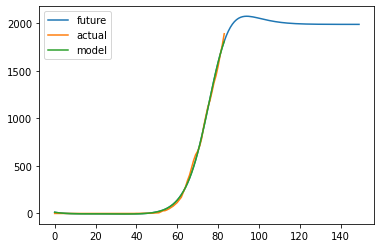

Morocco average accuracy: 99.3%


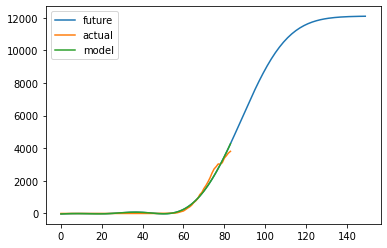

Arizona average accuracy: 98.2%


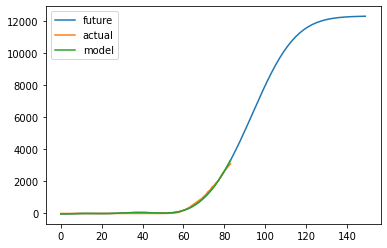

Mississippi average accuracy: 98.7%


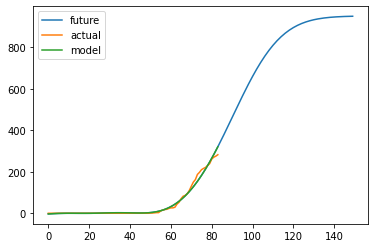

Wyoming average accuracy: 98.2%


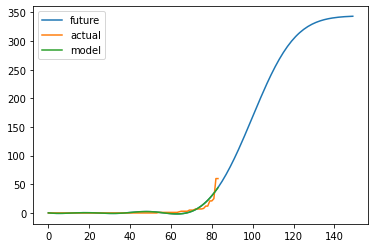

Somalia average accuracy: 97.9%


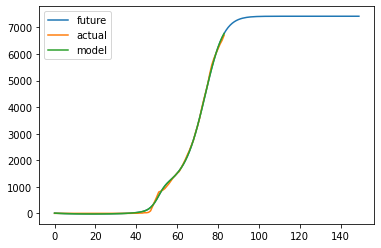

Denmark average accuracy: 99.5%


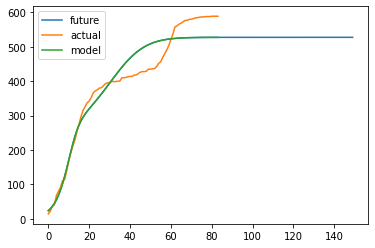

Beijing average accuracy: 93.8%


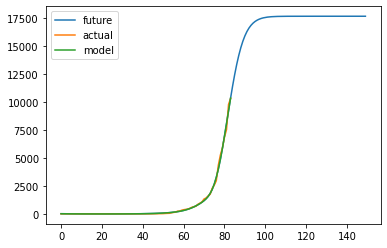

Peru average accuracy: 99.5%


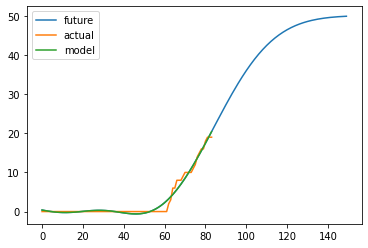

Laos average accuracy: 99.5%


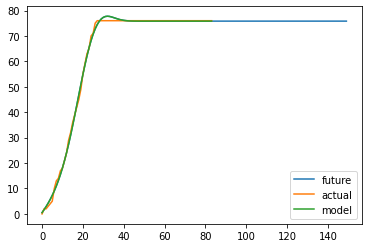

Xinjiang average accuracy: 99.4%


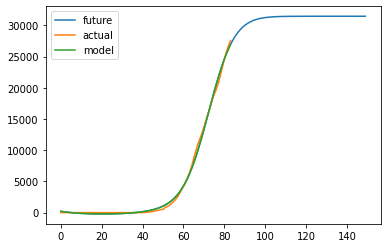

Netherlands average accuracy: 99.0%


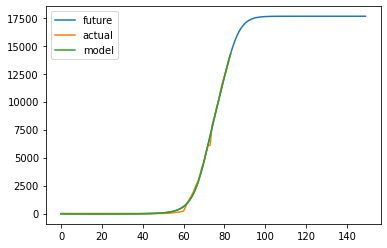

Quebec average accuracy: 99.4%


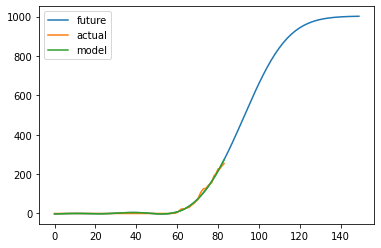

Isle of Man average accuracy: 98.7%


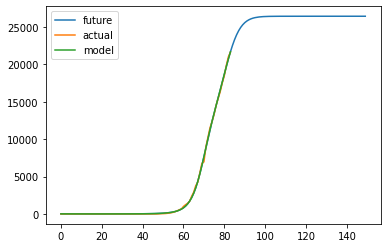

Florida average accuracy: 99.7%


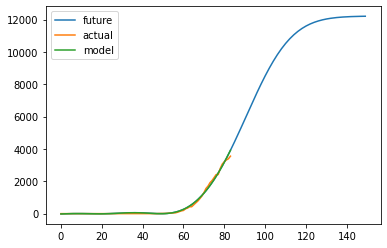

South Carolina average accuracy: 98.7%


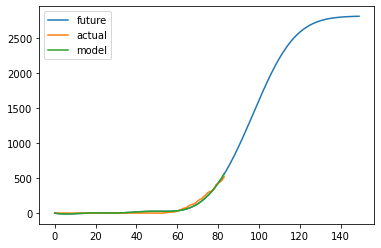

Nova Scotia average accuracy: 97.2%


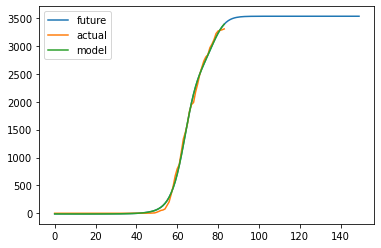

Luxembourg average accuracy: 99.1%


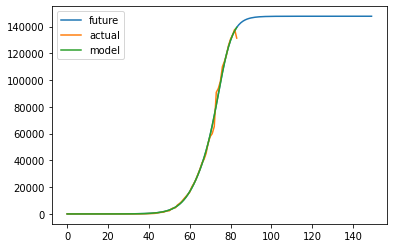

France average accuracy: 99.5%


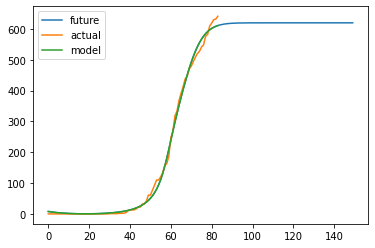

Lebanon average accuracy: 98.8%


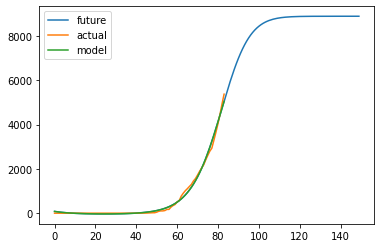

Saudi Arabia average accuracy: 98.8%


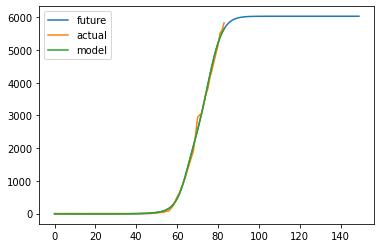

Tennessee average accuracy: 99.4%


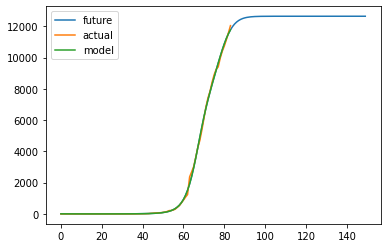

Israel average accuracy: 99.6%


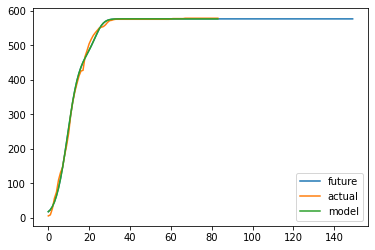

Chongqing average accuracy: 99.2%


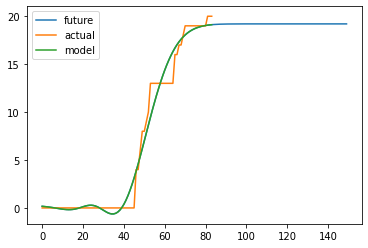

Maldives average accuracy: 99.3%


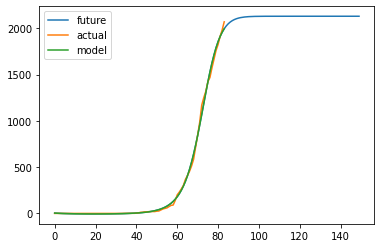

Algeria average accuracy: 99.4%


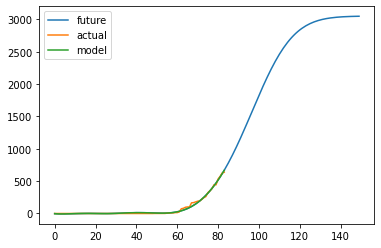

Cote d'Ivoire average accuracy: 98.6%


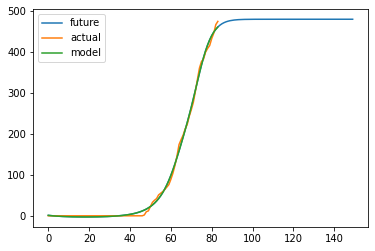

Albania average accuracy: 99.1%


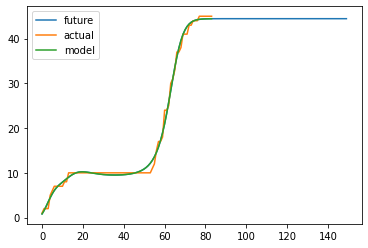

Macau average accuracy: 99.4%


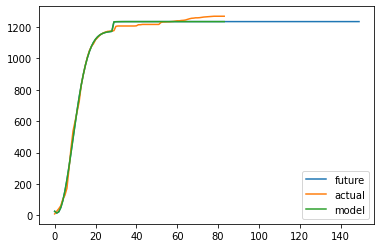

Zhejiang average accuracy: 98.6%


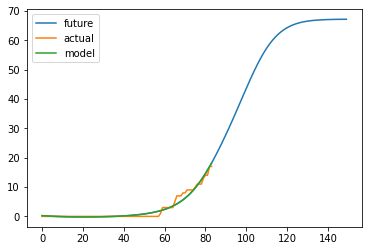

Zimbabwe average accuracy: 99.4%


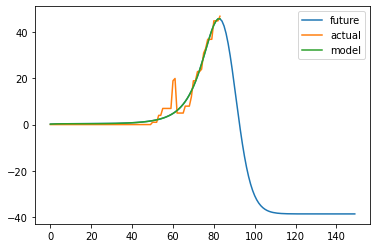

Guyana average accuracy: 98.5%


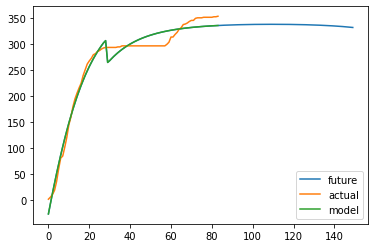

Fujian average accuracy: 96.4%


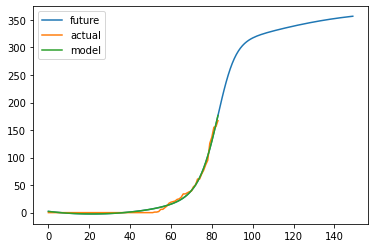

Guatemala average accuracy: 98.3%


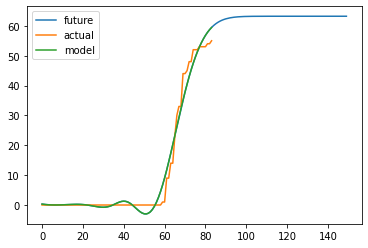

Uganda average accuracy: 98.3%


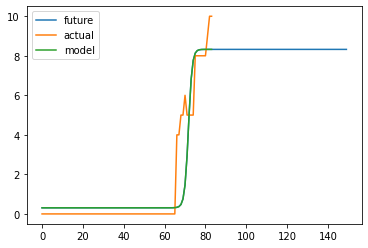

Turks and Caicos Islands average accuracy: 99.4%


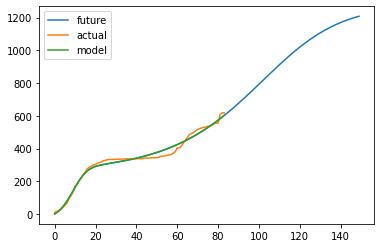

Shanghai average accuracy: 97.4%


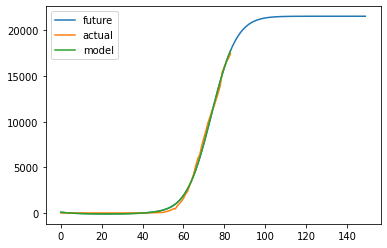

Portugal average accuracy: 99.0%


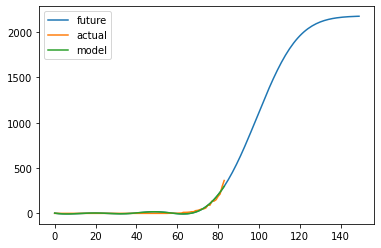

Djibouti average accuracy: 97.7%


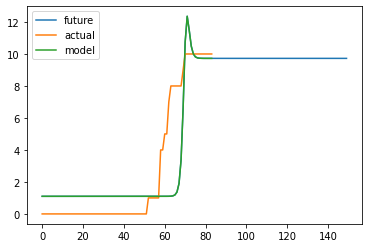

Suriname average accuracy: 98.5%


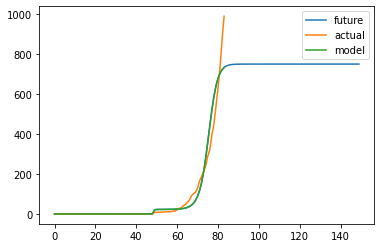

South Dakota average accuracy: 98.1%


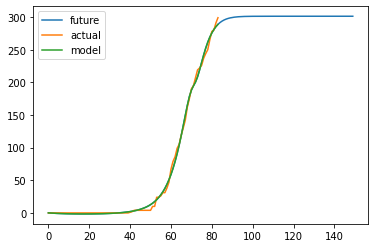

Senegal average accuracy: 99.1%


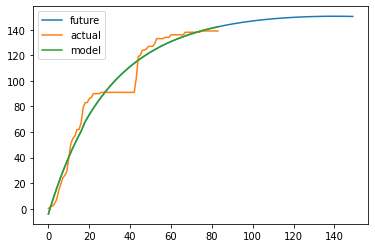

Gansu average accuracy: 95.5%


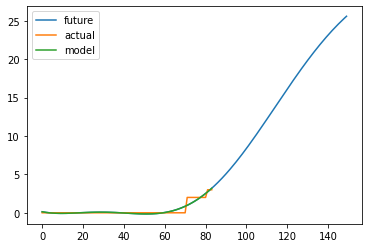

Bonaire, Sint Eustatius and Saba average accuracy: 99.8%


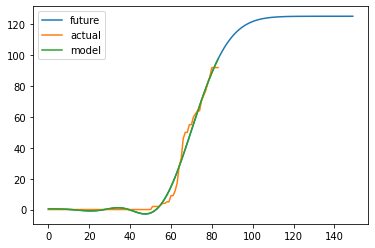

Aruba average accuracy: 98.0%


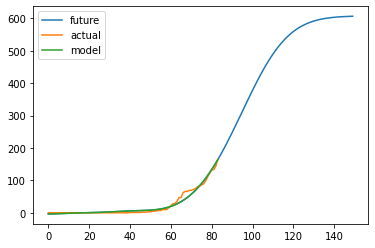

Tasmania average accuracy: 97.2%


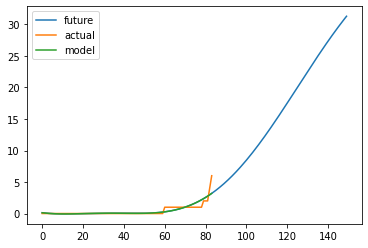

Timor-Leste average accuracy: 99.8%


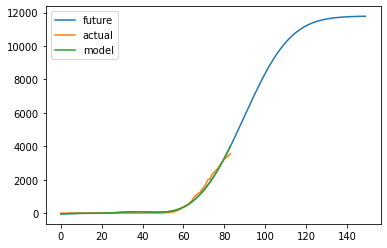

Wisconsin average accuracy: 97.9%


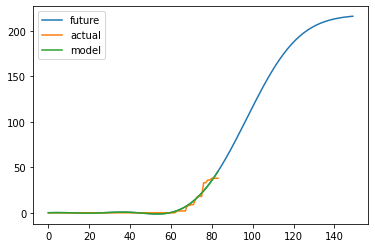

Guinea-Bissau average accuracy: 98.9%


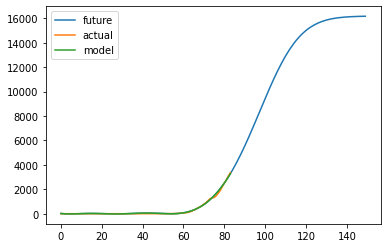

Ukraine average accuracy: 99.1%


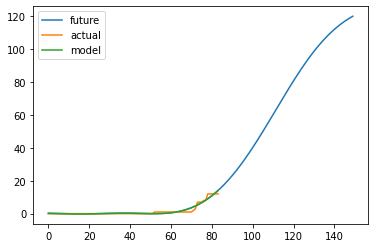

Saint Vincent and the Grenadines average accuracy: 99.5%


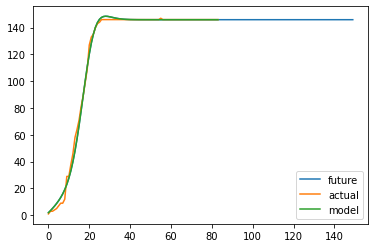

Guizhou average accuracy: 99.1%


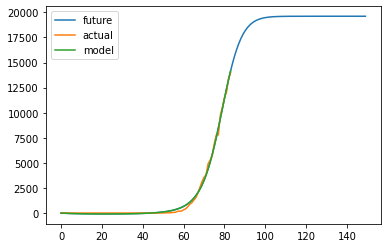

Connecticut average accuracy: 99.0%


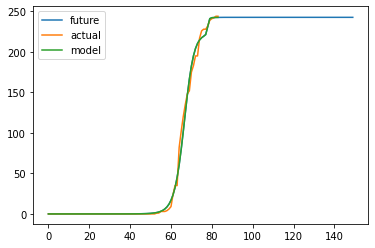

Newfoundland and Labrador average accuracy: 99.0%


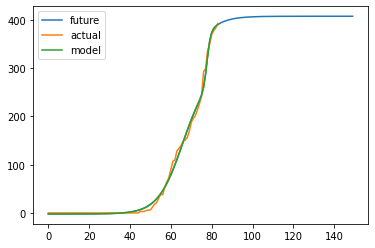

Malta average accuracy: 98.8%


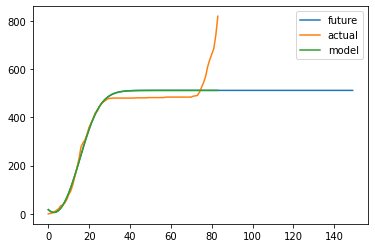

Heilongjiang average accuracy: 96.2%


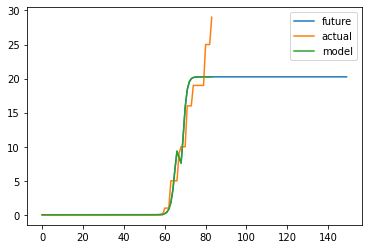

Syria average accuracy: 99.2%


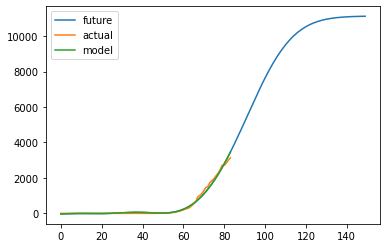

Nevada average accuracy: 98.3%


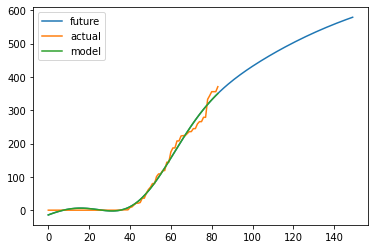

San Marino average accuracy: 97.9%


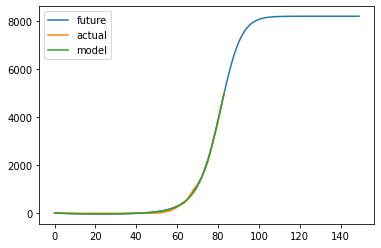

Mexico average accuracy: 99.4%


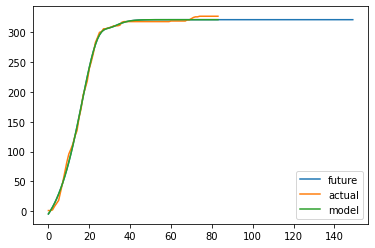

Hebei average accuracy: 99.0%


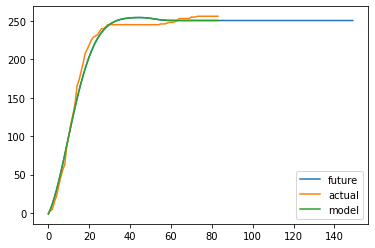

Shaanxi average accuracy: 97.5%


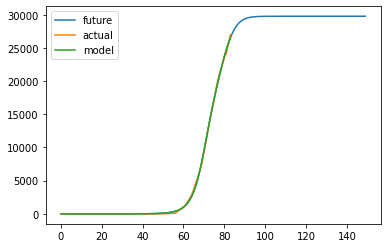

Michigan average accuracy: 99.7%


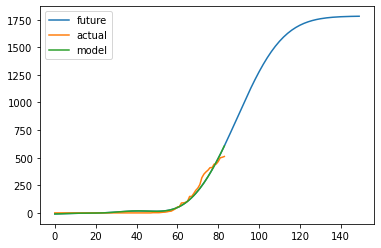

Hawaii average accuracy: 96.9%


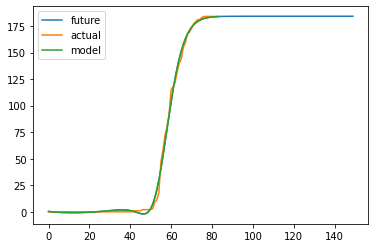

Faroe Islands average accuracy: 99.0%


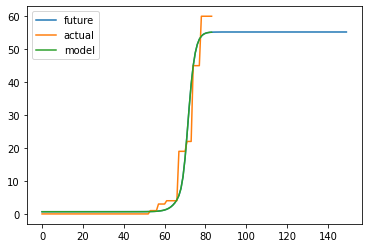

Congo (Brazzaville) average accuracy: 98.0%


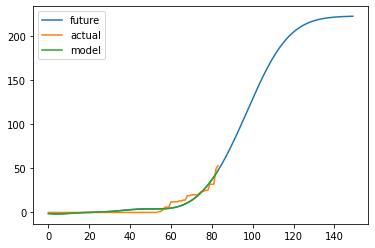

Tanzania average accuracy: 97.3%


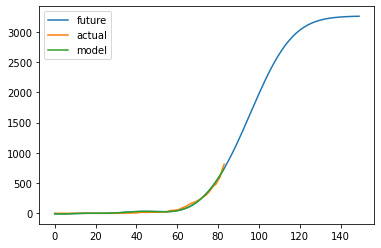

Oman average accuracy: 98.4%


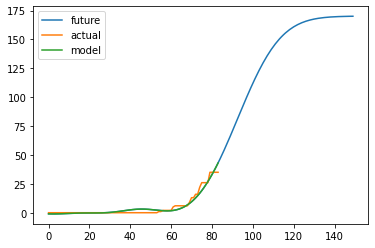

Benin average accuracy: 98.4%


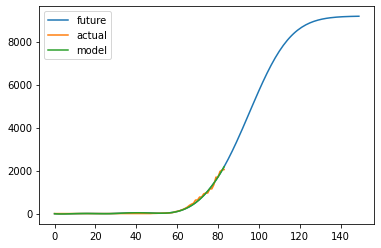

Kentucky average accuracy: 98.8%


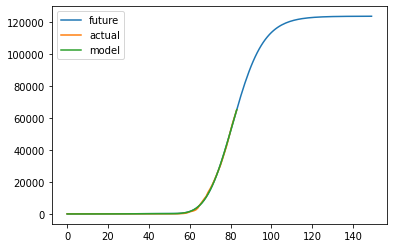

Turkey average accuracy: 99.7%


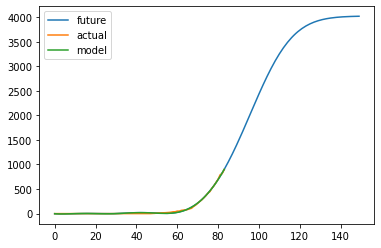

Nebraska average accuracy: 99.0%


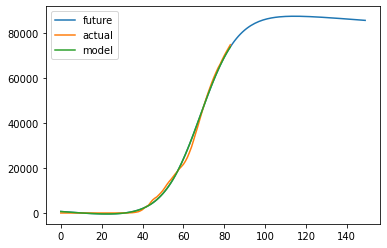

Iran average accuracy: 98.9%


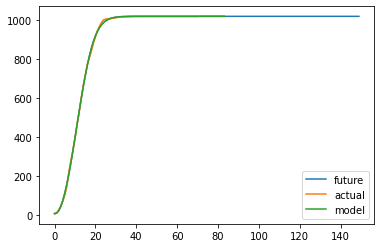

Hunan average accuracy: 99.7%


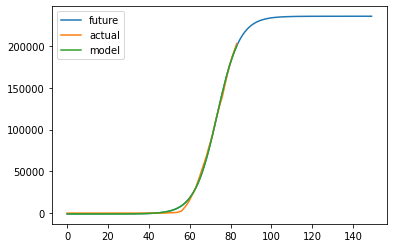

New York average accuracy: 99.2%


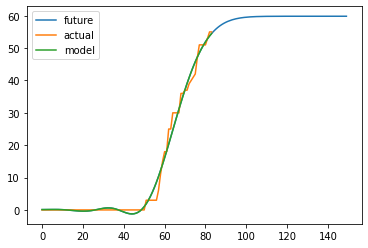

French Polynesia average accuracy: 99.0%


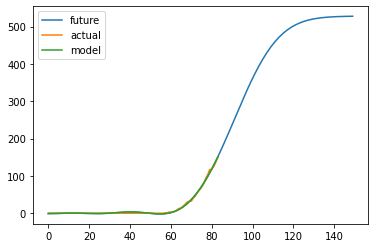

El Salvador average accuracy: 99.0%


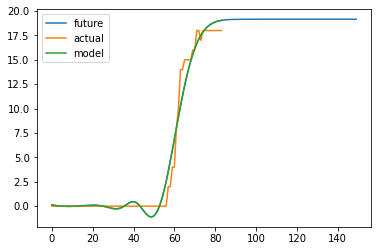

New Caledonia average accuracy: 99.4%


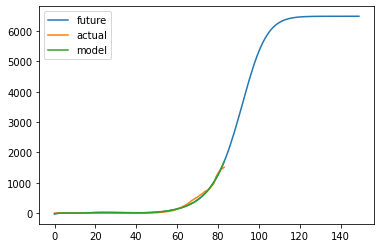

Hungary average accuracy: 98.3%


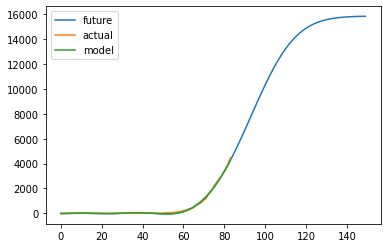

Serbia average accuracy: 99.1%


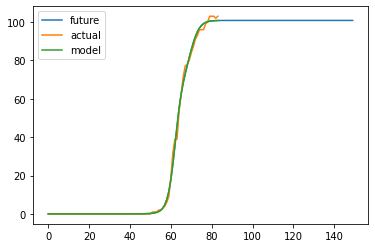

Australian Capital Territory average accuracy: 99.3%


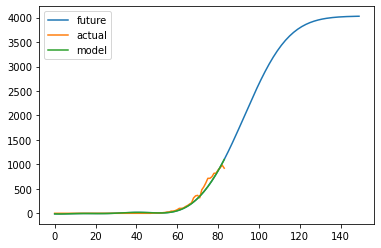

New Hampshire average accuracy: 97.6%


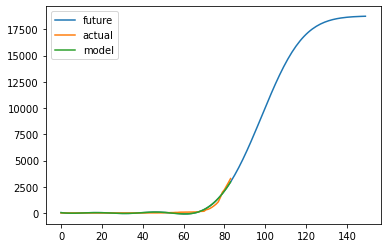

Belarus average accuracy: 97.7%


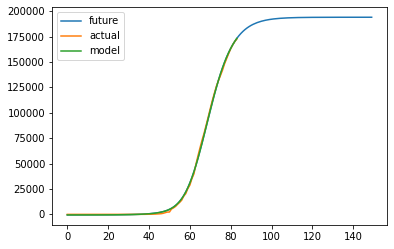

Spain average accuracy: 99.5%


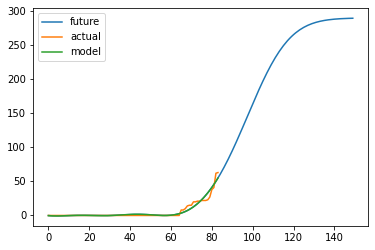

Burma average accuracy: 98.3%


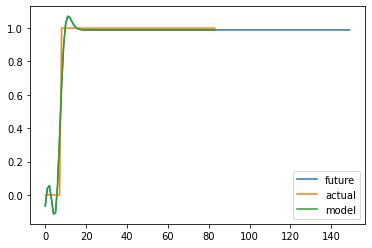

Tibet average accuracy: 1e+02%


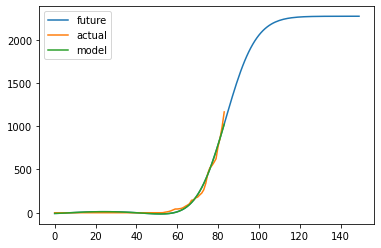

Uzbekistan average accuracy: 98.5%


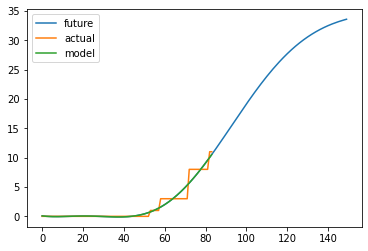

Central African Republic average accuracy: 99.6%


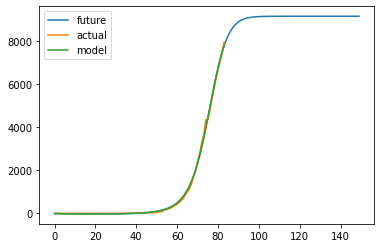

Ontario average accuracy: 99.4%


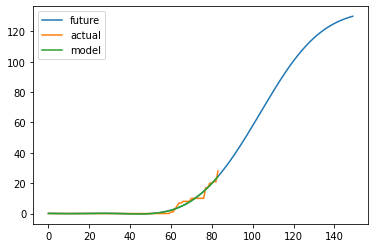

Mozambique average accuracy: 99.4%


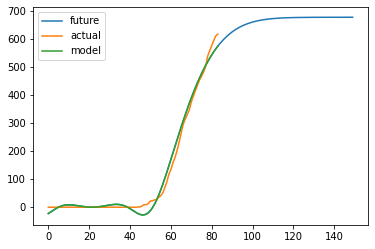

Costa Rica average accuracy: 97.6%


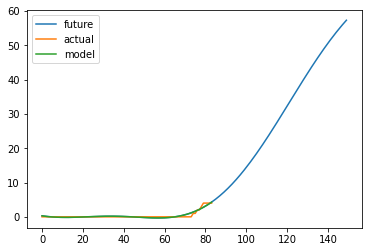

South Sudan average accuracy: 99.8%


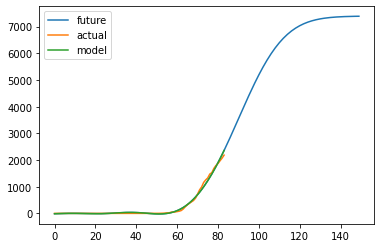

Oklahoma average accuracy: 98.6%


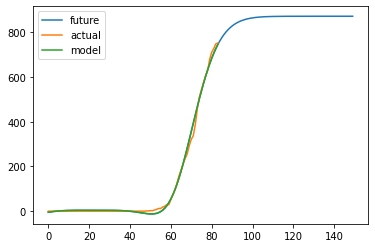

Vermont average accuracy: 99.0%


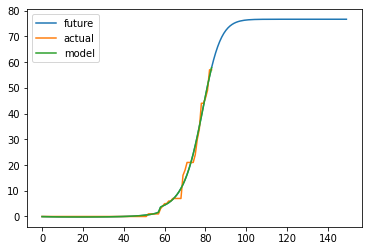

Gabon average accuracy: 99.3%


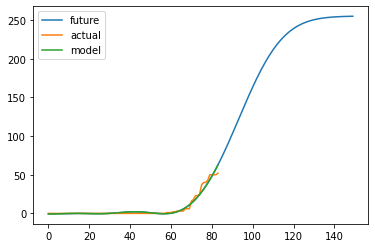

Sint Maarten average accuracy: 98.5%


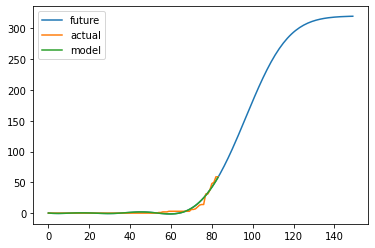

Liberia average accuracy: 98.4%


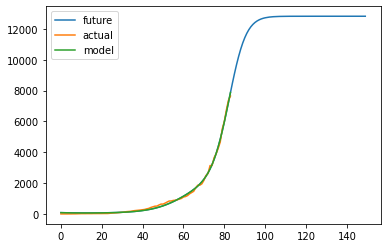

Japan average accuracy: 99.1%


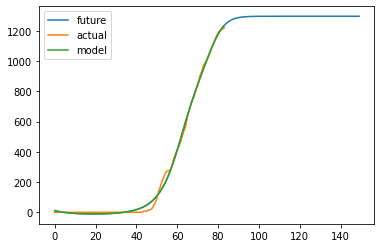

Slovenia average accuracy: 98.9%


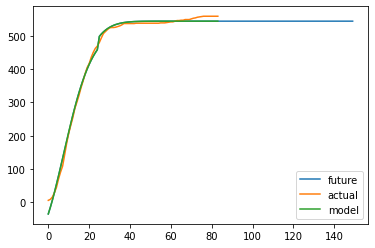

Sichuan average accuracy: 98.6%


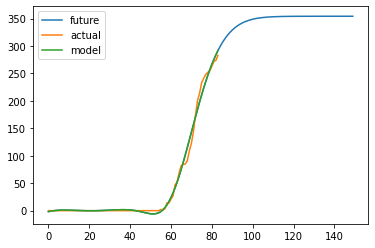

Montenegro average accuracy: 98.6%


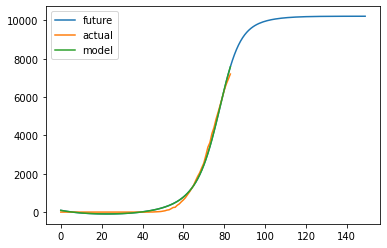

Poland average accuracy: 98.5%


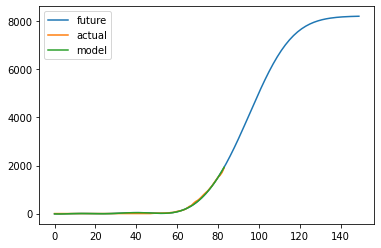

Iowa average accuracy: 99.1%


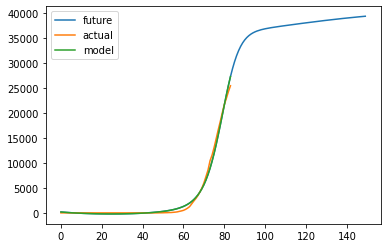

Pennsylvania average accuracy: 98.6%


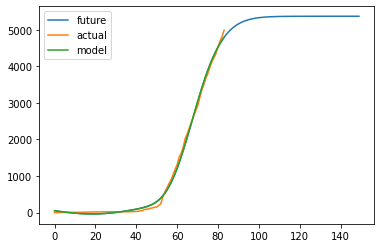

Malaysia average accuracy: 98.8%


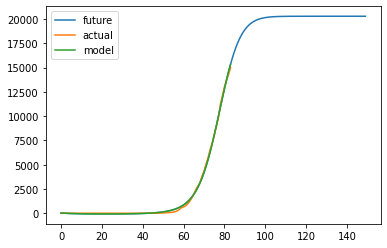

Texas average accuracy: 99.3%


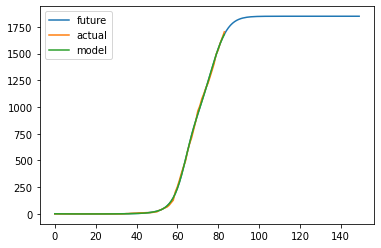

Croatia average accuracy: 99.6%


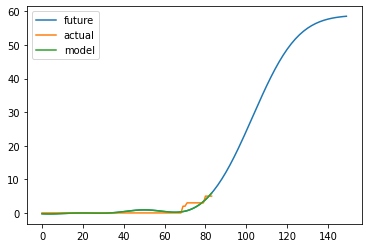

Burundi average accuracy: 99.5%


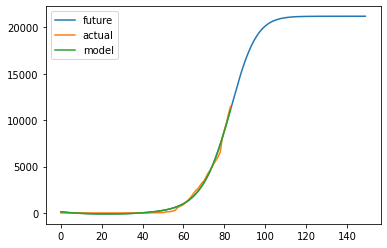

Ireland average accuracy: 98.8%


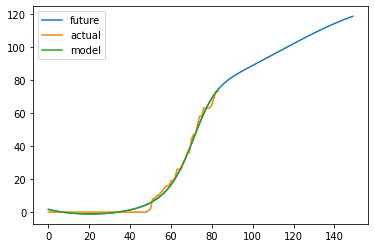

Jamaica average accuracy: 98.5%


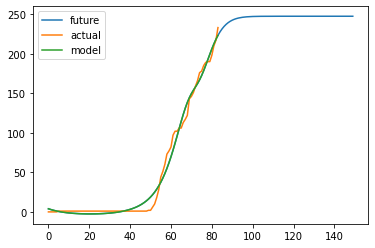

Sri Lanka average accuracy: 97.6%


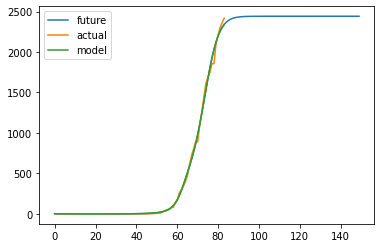

Utah average accuracy: 99.4%


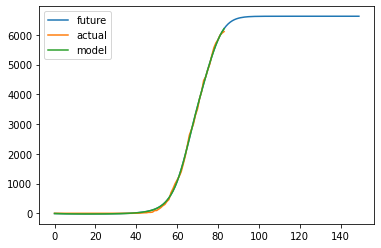

Czechia average accuracy: 99.5%


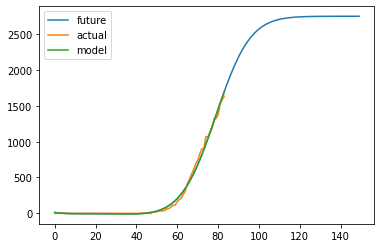

Oregon average accuracy: 98.8%


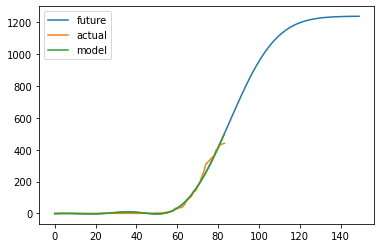

Channel Islands average accuracy: 98.4%


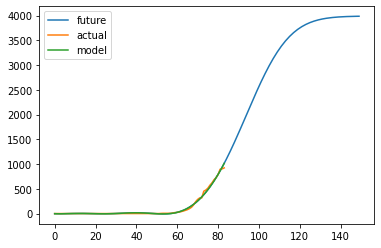

Puerto Rico average accuracy: 98.7%


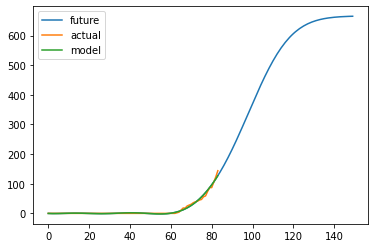

Mali average accuracy: 98.7%


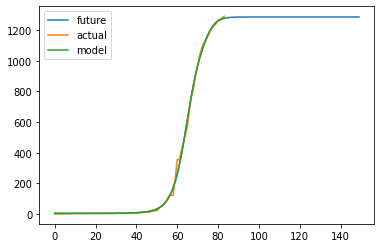

Victoria average accuracy: 99.5%


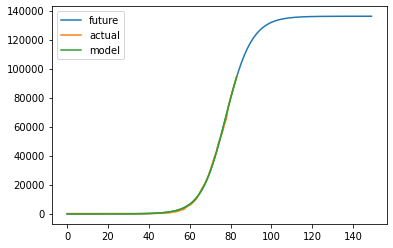

United Kingdom average accuracy: 99.5%


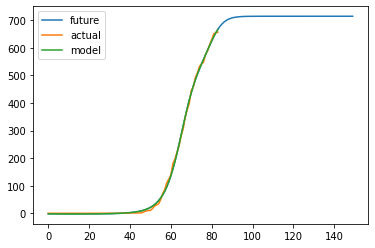

Latvia average accuracy: 99.3%


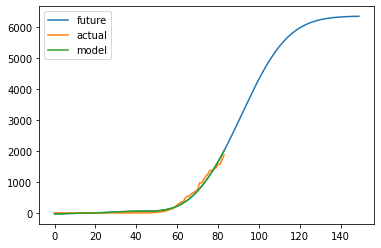

Alberta average accuracy: 97.3%


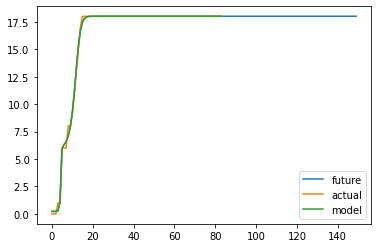

Qinghai average accuracy: 99.9%


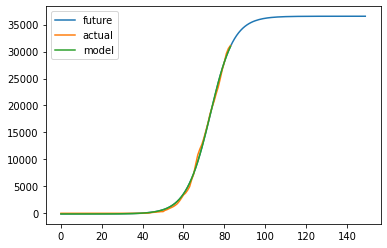

Belgium average accuracy: 99.3%


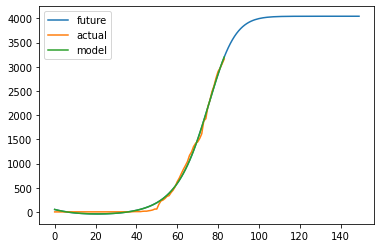

Finland average accuracy: 98.7%


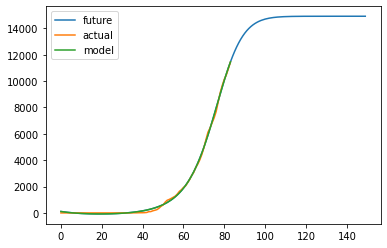

Sweden average accuracy: 99.3%


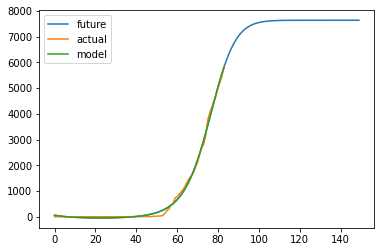

Pakistan average accuracy: 99.0%


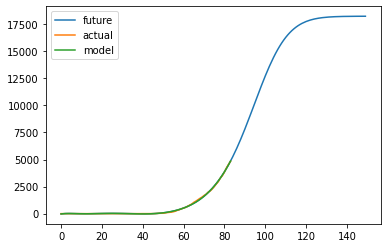

Indonesia average accuracy: 99.5%


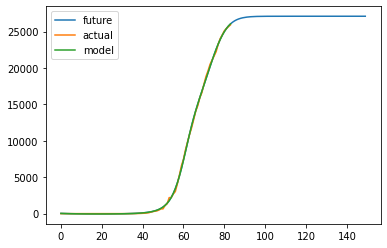

Switzerland average accuracy: 99.7%


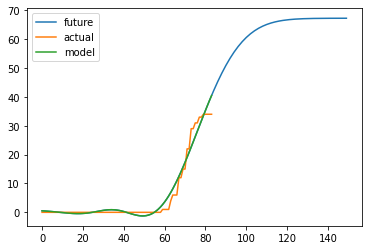

Eritrea average accuracy: 98.7%


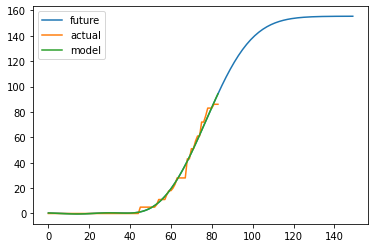

French Guiana average accuracy: 98.6%


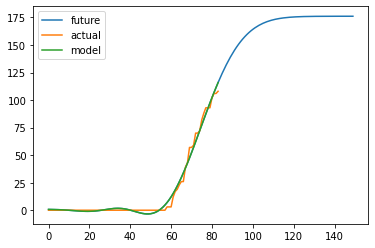

Madagascar average accuracy: 98.1%


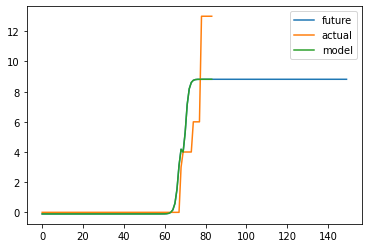

Botswana average accuracy: 99.3%


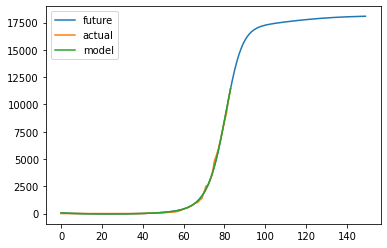

India average accuracy: 99.5%


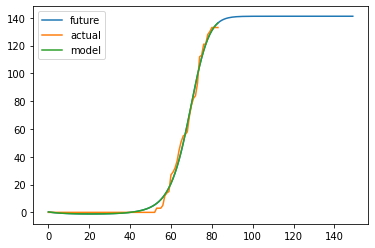

Guam average accuracy: 98.5%


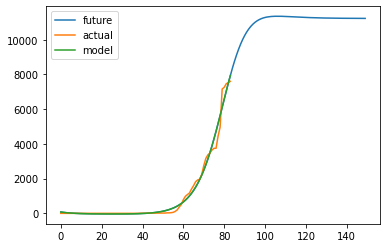

Ecuador average accuracy: 98.2%


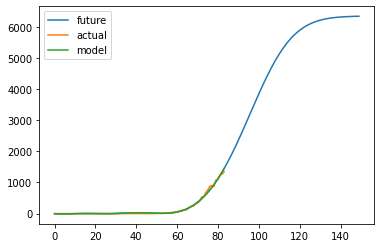

New Mexico average accuracy: 98.7%


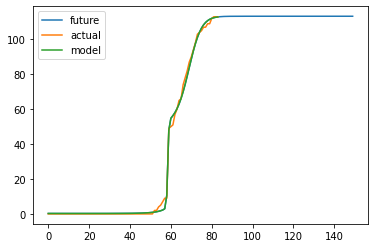

Trinidad and Tobago average accuracy: 99.2%


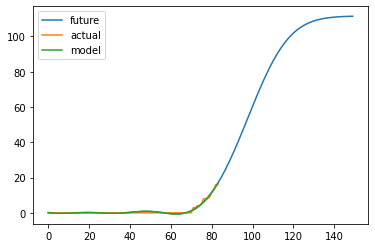

Malawi average accuracy: 99.6%


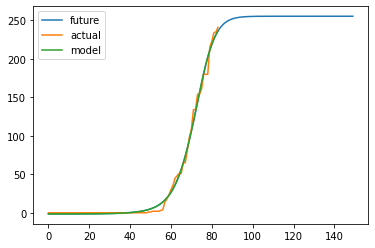

Congo (Kinshasa) average accuracy: 98.7%


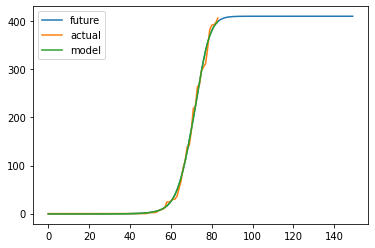

Honduras average accuracy: 99.3%


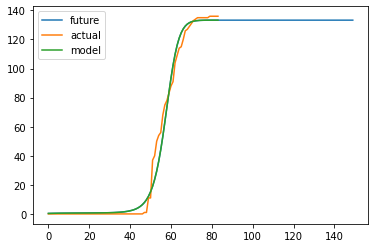

Brunei average accuracy: 97.5%


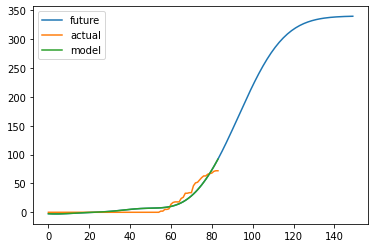

Barbados average accuracy: 95.1%


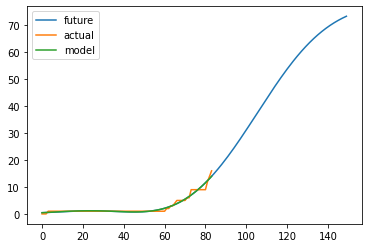

Nepal average accuracy: 99.6%


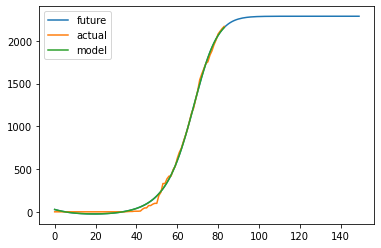

Greece average accuracy: 99.0%


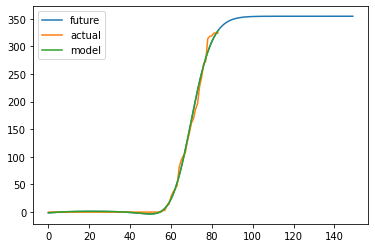

Mauritius average accuracy: 98.9%


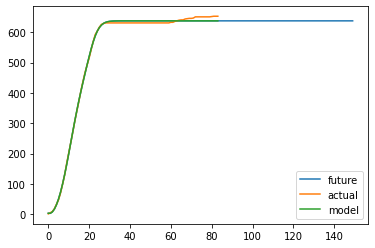

Jiangsu average accuracy: 99.1%


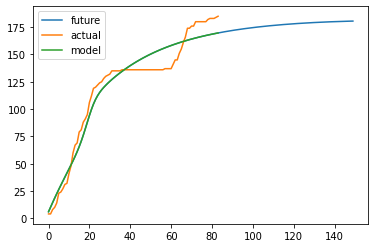

Tianjin average accuracy: 94.5%


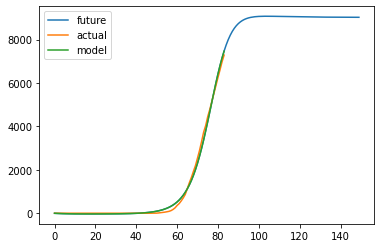

Ohio average accuracy: 98.9%


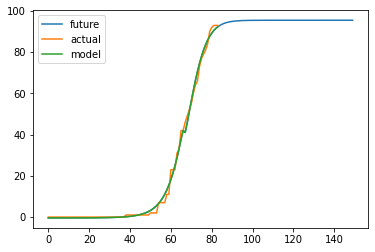

Monaco average accuracy: 98.9%


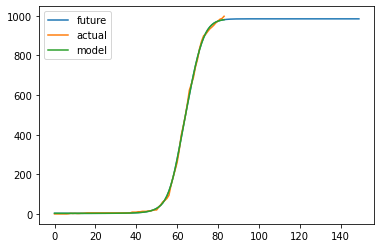

Queensland average accuracy: 99.6%


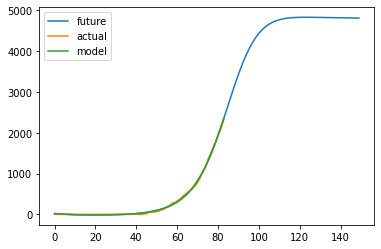

Egypt average accuracy: 99.3%


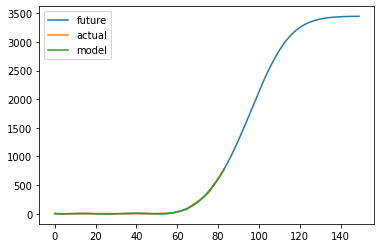

Cuba average accuracy: 99.4%


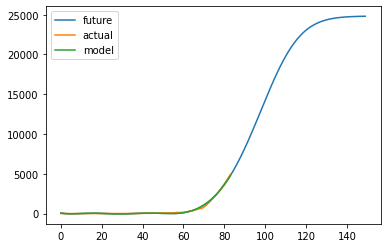

United Arab Emirates average accuracy: 98.9%


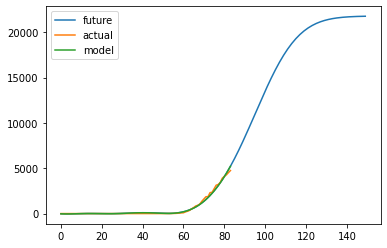

Missouri average accuracy: 98.6%


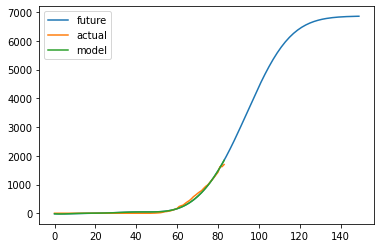

Minnesota average accuracy: 98.1%


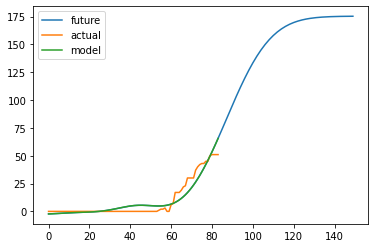

Virgin Islands average accuracy: 96.1%


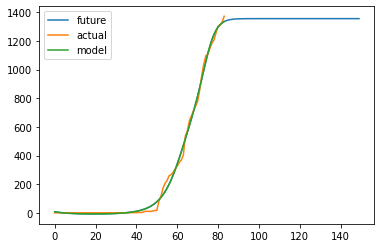

Estonia average accuracy: 98.8%


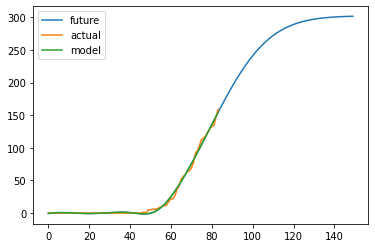

Paraguay average accuracy: 98.8%


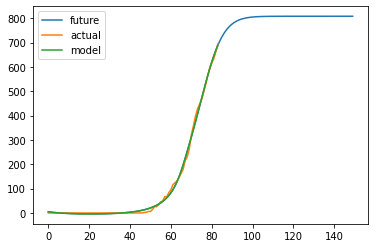

Cyprus average accuracy: 99.1%


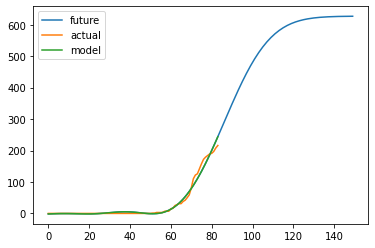

Kenya average accuracy: 97.7%


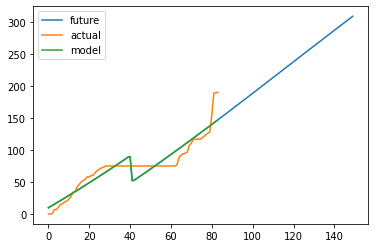

Inner Mongolia average accuracy: 94.3%


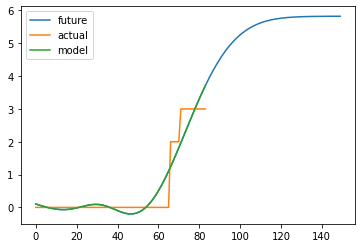

Anguilla average accuracy: 99.8%


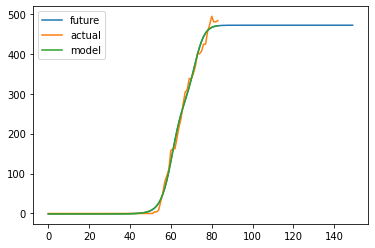

Uruguay average accuracy: 98.8%


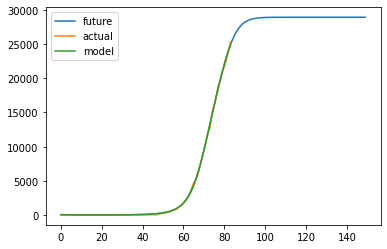

California average accuracy: 99.7%


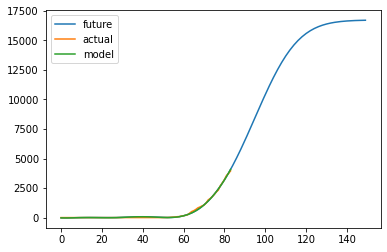

Alabama average accuracy: 99.2%


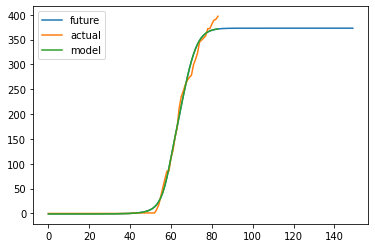

Jordan average accuracy: 98.8%


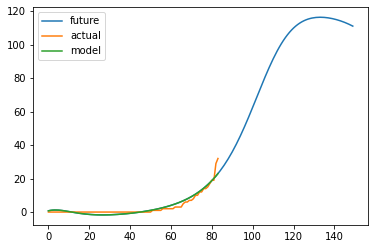

Sudan average accuracy: 98.7%


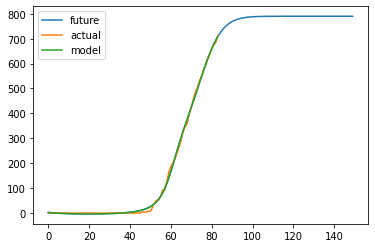

Bulgaria average accuracy: 99.3%


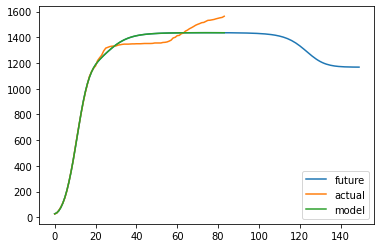

Guangdong average accuracy: 97.3%


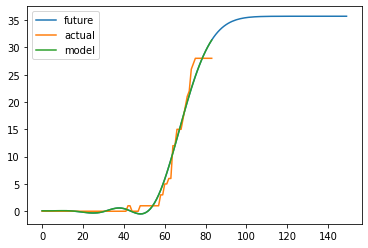

Northern Territory average accuracy: 99.2%


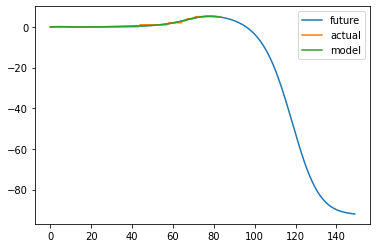

Bhutan average accuracy: 99.8%


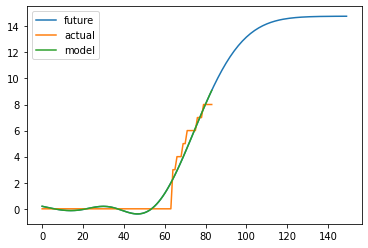

Yukon average accuracy: 99.7%


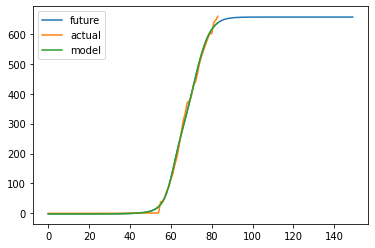

Andorra average accuracy: 99.2%


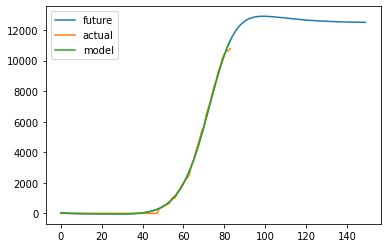

Washington average accuracy: 99.3%


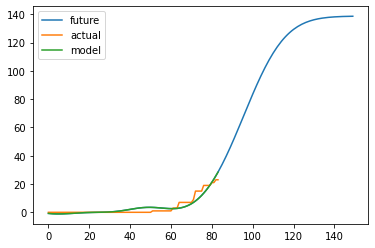

Antigua and Barbuda average accuracy: 98.3%


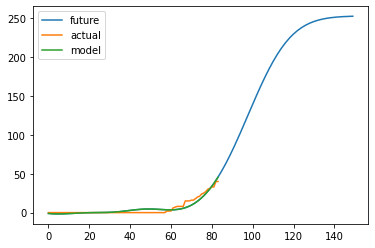

Haiti average accuracy: 97.5%


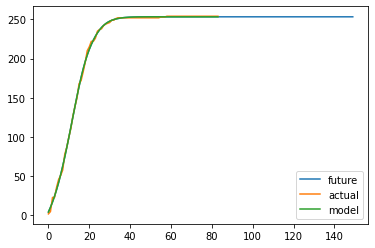

Guangxi average accuracy: 99.5%


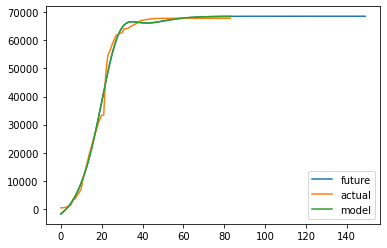

Hubei average accuracy: 98.3%


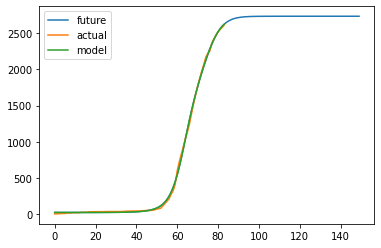

Thailand average accuracy: 99.4%


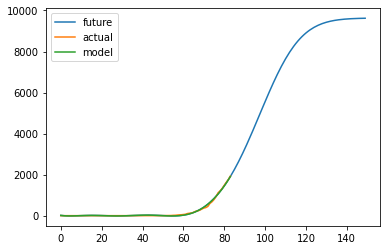

Delaware average accuracy: 99.0%


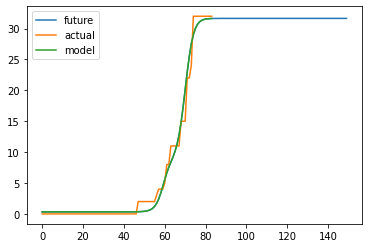

St Martin average accuracy: 99.2%


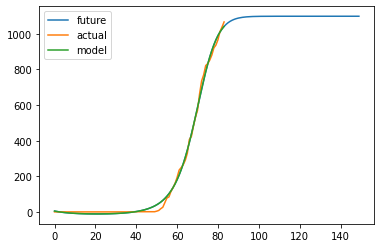

Armenia average accuracy: 98.8%


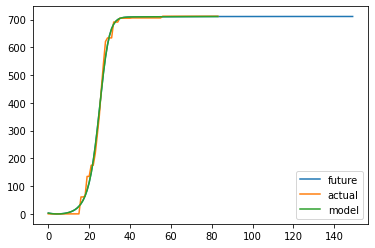

Diamond Princess average accuracy: 99.0%


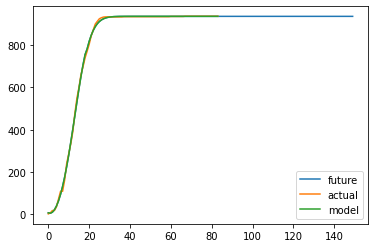

Jiangxi average accuracy: 99.6%


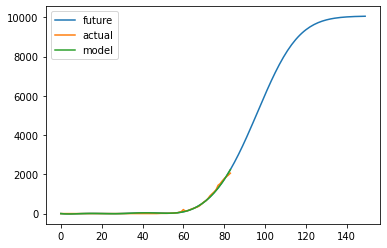

District of Columbia average accuracy: 98.9%


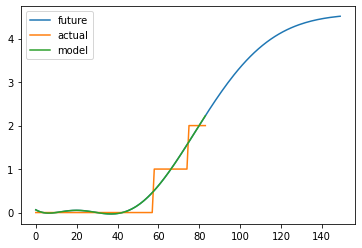

Papua New Guinea average accuracy: 99.9%


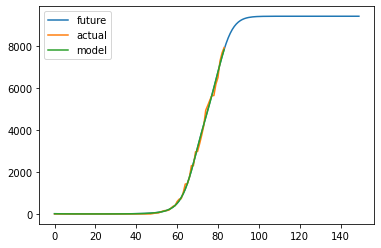

Colorado average accuracy: 99.4%


In [13]:
# Cases

for cname in cnames:
    if "Canada" == cname:
        continue
    model, powers, casenorm, fatnorm = deepcopy(models[cname])

    
    import matplotlib.pyplot as plt
    
    predictions = np.array([j.numpy()[0]*casenorm for j in model(torch.Tensor([[pow(xval, i) for i in powers] for xval in list(xbycountry[cname])])).detach()])
    plt.plot(np.array(list(range(150))), np.array([j.numpy()[0]*casenorm for j in model(torch.Tensor([[pow(xval, i) for i in powers] for xval in list(range(150))])).detach()]), label="future")
    plt.plot(xbycountry[cname], [i[0] for i in ybycountry[cname]], label="actual")
    plt.plot(xbycountry[cname], predictions, label="model")
#     plt.plot(np.array([73 for i in range(int(casenorm) * 2)]), np.array(list(range(int(casenorm) * 2))), label="day 70")
    # plt.plot(np.array(list(range(200))), np.array([390000 for i in range(200)]), label="growth slows down")
    plt.xlabel = "Days Since 2020-01-22"
    plt.ylabel = "Cases"
    plt.legend()
    plt.show()
    # print(f"Will max out at {model(torch.Tensor([[[102]]])).item()*8e4} infected around May 26 2020")
    print(f"{cname} average accuracy: {100*(1-np.mean(abs(predictions - [i[0] for i in ybycountry[cname]]))/casenorm):.3}%")
    del plt

In [14]:
!rm /kaggle/working/submission.csv
stuff = []
with open("/kaggle/working/submission.csv", 'a+') as fout:
    fout.write("ForecastId,ConfirmedCases,Fatalities\n")
    for i, p in enumerate(ptest.to_numpy()):
        cname = p[1] if type(p[1]) is str else p[2]
        model, powers, casenorm, fatnorm = deepcopy(models[cname])
        date = dateToInt(p[3])
        predictions = np.array([(j.numpy()[0]*casenorm, j.numpy()[1]*fatnorm) for j in model(torch.Tensor([[pow(xval, i) for i in powers] for xval in (date,)])).detach()])
        print(i, cname, date, tuple(predictions[0]))
        print(i + 1, int(round(predictions[0][0])), int(round(predictions[0][1])), sep=',', file=fout)
        stuff.append((i+1, predictions[0]))
print(len(stuff))

rm: cannot remove '/kaggle/working/submission.csv': No such file or directory
0 Afghanistan 71 (235.7187124419212, 6.819411883592606)
1 Afghanistan 72 (264.290435136342, 7.701190074920655)
2 Afghanistan 73 (294.96791393165586, 8.648001430034638)
3 Afghanistan 74 (327.79813255331516, 9.661315624952318)
4 Afghanistan 75 (362.8270533414364, 10.742536529302598)
5 Afghanistan 76 (400.09042478277684, 11.892760916233064)
6 Afghanistan 77 (439.6243358258724, 13.113112978219986)
7 Afghanistan 78 (481.45040579366685, 14.40423981142044)
8 Afghanistan 79 (525.5859982368708, 15.766684318542481)
9 Afghanistan 80 (572.0324750025987, 17.200484886646272)
10 Afghanistan 81 (620.7884742437362, 18.70559764480591)
11 Afghanistan 82 (671.8325468682289, 20.281353561401367)
12 Afghanistan 83 (725.1328596997738, 21.92678199219704)
13 Afghanistan 84 (780.6391946260213, 23.640314551591874)
14 Afghanistan 85 (838.2885662179232, 25.420015434980392)
15 Afghanistan 86 (897.995348338151, 27.263230451345446)
16 Afghan